In [1]:
import numpy as np
import matplotlib.pyplot as plt
import awkward as ak
from coffea import hist, processor
import coffea
import uproot
import sys
sys.path.insert(0,"../")
# from corrections import add_pileup_weight
import os
import pickle
import glob

import mplhep as hep
plt.style.use(hep.style.CMS) 

In [5]:
from HNLprocessor.util import f_xsec
from HNLprocessor.util import f_v2

from HNLprocessor.util import f_xsec,f_xsec_tau
from HNLprocessor.util import f_v2,f_v2_tau
plt.style.use(hep.style.CMS) 

def loadLimits(f):
    
    T=uproot.open(f)['limit']
    return np.array(T['limit'].array())

def getf_xsec(f):
    mass = float(f.split("/")[-1].split("_")[3].replace("mHNL","").replace("p","."))  

    if "Dirac" in f:
        if "tau" in f:
            return lambda x: f_xsec_tau(mass)(x)*2                      
        else:
            return lambda x: f_xsec(mass)(x)*2
    elif "mixed" in f:
        print(f)
        #fe = float(f.split("*")[1][2:].replace("p","."))

        #fmu = float(f.split("*")[2][3:].replace("p","."))

        #ftau = float(f.split("*")[3].split("_")[0][4:].replace("p","."))
        fe = float(f.split("-")[1][2:].replace("p","."))
        fmu = float(f.split("-")[2][3:].replace("p","."))
        ftau = float(f.split("-")[3].split("_")[0][4:].replace("p","."))
        return lambda x: f_xsec(mass)(x)*(fe+fmu) + f_xsec_tau(mass)(x)*ftau
    else:
        if "tauType" in f:
            return f_xsec_tau(mass)
        else:
            return f_xsec(mass)
    print("ERROR: cannot find xsec function for ",f)
    return

def getf_v2(f):
    mass = float(f.split("/")[-1].split("_")[3].replace("mHNL","").replace("p","."))      
    if "Dirac" in f:
        if "tau" in f:
            return lambda x: f_v2_tau(mass)(x)*2                      
        else:
            return lambda x: f_v2(mass)(x)*2
    elif "mixed" in f:
        
        fe = float(f.split("-")[1][2:].replace("p","."))
        fmu = float(f.split("-")[2][3:].replace("p","."))
        ftau = float(f.split("-")[3].split("_")[0][4:].replace("p","."))
        print("Mixing")
        print(fe+fmu)
        print(ftau)
        return lambda x: f_v2(mass)(x)*(fe+fmu) + f_v2_tau(mass)(x)*ftau
    else:
        if "tauType" in f:
            return lambda x:f_v2_tau(mass)
        else:
            return lambda x:f_v2(mass)
    print("ERROR: cannot find v2 function for ",f)
    return


def loadLimitFiles(fpath,ctau_max=-1):
    arr =[]
    ctau = []
    for f in glob.glob(fpath):
        ct = f.split("/")[-1].split("_")[4].replace("pl","")
        if float(ct) <=0:
            ct = 0.75
        mass = float(f.split("/")[-1].split("_")[3].replace("mHNL","").replace("p","."))  
              
        func_xsec = getf_xsec(f)
        xsec = func_xsec(float(ct))
        signalName = "_".join(f.split("/")[-1].split("_")[1:-1])  
        with uproot.open(f) as file:
                if "limit;1" not in file.keys(): continue
        limit = loadLimits(f)
        norm=1
        if len(limit) !=6:
            print("Problem loading limit for ",signalName)
            print(limit)
        else:
            if ctau_max>-1:
                if float(ct)<ctau_max:
                    arr.append(loadLimits(f)*xsec/norm)
                    ctau.append(float(ct))                            
            else:
                arr.append(loadLimits(f)*xsec/norm)
                ctau.append(float(ct))        
    arr = np.array(arr)
    ctau = np.array(ctau)
    return arr,ctau

from scipy.interpolate import Rbf,interp1d
from scipy import interpolate
import numpy as np
def interpolate1D(combineLimits,x,nBins=10,f="linear"):
    epsilon = 0.2
    smooth = 1
    newLimits = []
    if nBins<0:
        xi = np.sort(x)
    else:
        xi = np.logspace(np.log10(min(x)),np.log10(max(x)),nBins)    

    funcs=[]
    for i in range(6):
        y = combineLimits[:,i]
        if f=="linear":
            rbfi = interp1d(x, np.log(y),fill_value="extrapolate")
        else:
            rbfi = Rbf(x,y,function='multiquadric', epsilon=epsilon,smooth=smooth)            
        yi = np.exp(rbfi(xi))
        newLimits.append(yi)
        funcs.append(rbfi)
    newLimits = np.array(newLimits).transpose()
    return newLimits, xi,funcs

def plotlimit(ax,CLs,poi_values,showBands = True, legend=True,color='black'
              ,mask=None,mask1sig=None,plotObs=False,maskObs=None):

    # index mapping:
    # 0 : -2 sigma
    # 1 : -1 sigma
    # 2 : expected
    # 3 : +1 sigma
    # 4 : +2 sigma
    # 5 : obs
    if type(mask)==type(np.array([])):
        poi_expected    = poi_values[mask]
        expected_CLs = CLs[mask,2]       
    else:
        poi_expected = poi_values
        expected_CLs = CLs[:,2]

    if maskObs is not None: 
        obs_CLs    = CLs[maskObs,5]         
        poi_obs    = poi_values[maskObs]
    else:
        poi_obs      = poi_values        
        obs_CLs      = CLs[:,5]                
        
    if plotObs:
        if legend:
            ax.plot(poi_obs, obs_CLs, color=color, label=r"expected CL$_S$")
        else:
            ax.plot(poi_obs, obs_CLs, color=color, label='_nolegend_')        
    if legend:
        ax.plot(poi_expected, expected_CLs, "--", color=color, label=r"expected CL$_S$")
    else:
        ax.plot(poi_expected, expected_CLs, "--", color=color, label='_nolegend_')        
        
        
    if showBands:
        # 1 and 2 sigma bands
        if legend:
            sigOnelabel = r"expected CL$_S$ $\pm 1\sigma$"
            sigTwolabel = r"expected CL$_S$ $\pm 2\sigma$"            
        else:
            sigOnelabel = '_nolegend_'
            sigTwolabel = '_nolegend_'
            
        ax.fill_between(
            poi_values,
            CLs[:, 1],
            CLs[:, 3],
            color="limegreen",
            label=sigOnelabel,
            where=mask1sig,
        )
        ax.fill_between(
            poi_values,
            CLs[:, 0],
            CLs[:, 4],
            color="yellow",
            label=sigTwolabel,
            zorder=0,  # draw beneath 1 sigma band
        )    
        
    return ax

def plotOneMass_fpath(fpath,showBand=True,ax=None,addTheory=True,color='black',plotObs=False):
    mass = float(fpath.split("/")[-1].split("_")[3].replace("mHNL","").replace("p","."))       

    
    isDirac = True if "Dirac" in fpath else False
    isTau   = True if "tauType" in fpath else False
    isMixed = True if "mixed" in fpath else False
    if isMixed:
        fe = float(fpath[fpath.find("fe")+2:fpath.find("fe")+5].replace("p","."))
        fmu = float(fpath[fpath.find("fmu")+3:fpath.find("fmu")+6].replace("p","."))
        ftau = float(fpath[fpath.find("ftau")+4:fpath.find("ftau")+7].replace("p","."))
    if isTau:
        label   = r"$m_{HNL}^\tau=%.1fGeV$"%mass
        if "/ele" in fpath:
            channel = "Electron Channel\n"+label
            lumi    = "122"
        elif "/mu" in fpath:
            channel = "Muon Channel\n"+label
            lumi    = "120"
        else:
            channel = "Ele+Mu Channel\n"+label
            lumi    = "122"            
    else:
        if "ele" in fpath:
            label = r"$m_{HNL}^e=%.1fGeV$"%mass
            channel = "Electron Channel\n"+label            
            lumi    = "122"
        else:            
            label = r"$m_{HNL}^\mu=%.1fGeV$"%mass
            channel = "Muon Channel\n"+label            
            lumi    = "120"
    if isMixed:
        label = r"$m_{HNL}=%(HNL)sGeV$, (%(fe)s,%(fmu)s,%(ftau)s)"%({"HNL":mass,"fe":fe,"fmu":fmu,"ftau":ftau})
        if "ele" in fpath:
            channel = "Electron Channel\n"+label            
            lumi    = "122"
        else:            
            channel = "Muon Channel\n"+label            
            lumi    = "120"
        #channel = "Combined Channel\n"+label    
    if len(glob.glob(fpath))==0:
        print("Cannot find files with ",fpath)
        return
    arr,ctau = loadLimitFiles(fpath)
    print(arr,ctau)
    arr_i, ctau_i,funcs = interpolate1D(arr, ctau,-1)

    plt.style.use(hep.style.CMS) 

    if ax ==None:
        fig, ax = plt.subplots(figsize=(8,6))
    ax = plotlimit(ax,arr_i,ctau_i,showBand,color=color,plotObs=plotObs)
    if addTheory:
        if isDirac:
            if 'tauType' in fpath:
                ax.plot(ctau_i,f_xsec_tau(mass)(ctau_i)*2,label="Theory")
            else:
                ax.plot(ctau_i,f_xsec(mass)(ctau_i)*2,label="Theory")
        elif isMixed:
            ax.plot(ctau_i,(f_xsec(mass)(ctau_i))*(fe+fmu)+f_xsec_tau(mass)(ctau_i)*ftau,label="Theory")
        else:
            if 'tauType' in fpath:
                ax.plot(ctau_i,f_xsec_tau(mass)(ctau_i),label="Theory")
                #ax.plot(ctau_i,f_xsec(mass)(ctau_i),label="Theory")
            else:
                ax.plot(ctau_i,f_xsec(mass)(ctau_i),label="Theory")            

    ax.set_xlabel("ctau[mm]")
    ax.set_ylabel("95% CL Limit on $\sigma$[pb]")
    ax.set_yscale("log")
    ax.set_xscale("log")
    if plotObs:
        ax.legend(["Observed","Expected","Theory"],title=channel,loc=1,fontsize="x-small",title_fontsize="x-small")
    else:
        ax.legend(["Expected","Theory"],title=channel,loc=1,fontsize="x-small")
        
    ytext = ax.get_ylim()[1]*0.8
    xtext  =ax.get_xlim()[0]*1.4
    ax.set_ylim(None,ax.get_ylim()[1]*4)

    if isDirac:
        ax.text(xtext,ytext,"Dirac")
    else:
        ax.text(xtext,ytext,"Majorana")        
    hep.cms.label(ax=ax,label="Preliminary",data=True,lumi=lumi)
    
    return ax

def get_masses(fpath,HNLtype="*"):
    ans =[p.split("/")[-1].split("_")[2].replace("mHNL","") for p in glob.glob(fpath+f'/*{HNLtype}*comb*.txt') if not "bkg" in p]
    return np.unique(ans)

def fill_zeros(y1,y2):
    y1_new=[]
    y2_new= []
    if (not np.any(y1))or (not np.any(y2)):
        print("Invalid ctau!")    
    for i,(iy1,iy2) in enumerate(zip(y1,y2)):
        #fill y1_new
        if iy1!=0: y1_new.append(iy1)
        elif y2[i]!=0: y1_new.append(y2[i])
        elif y1_new[i-1]!=0: y1_new.append((y1_new[i-1]+y2_new[i-1])/2)
        # fill y2_new
        if iy2!=0: y2_new.append(iy2)
        elif y1[i]!=0: y2_new.append(y1[i])
        elif y2_new[i-1]!=0: y2_new.append((y2_new[i-1]+y1_new[i-1])/2)      
    return np.array(y1_new),np.array(y2_new)

def get_ct_xing(fpath,init_ct):
    ## get limit and ctau from path
    arr,ctau = loadLimitFiles(fpath)
    if not list(arr): return 0
    if len(arr)<=1: return 0
    ## get iterpolated limit and ctau from path    
    arr_i, ctau_i,funcs = interpolate1D(arr, ctau,-1)
    print(arr,ctau)
    func_xsec = getf_xsec(fpath)
    ct_xing = intersect(funcs,func_xsec,init_ct)
    return ct_xing

def get_ct_xing_up(fpath):
    arr,ctau = loadLimitFiles(fpath)
    arr_i, ctau_i,funcs = interpolate1D(arr, ctau,-1)    
    func_xsec = getf_xsec(fpath)    
    ct_xing = intersect(funcs,func_xsec,int(min(ctau_i)))
    return ct_xing
def get_ct_xing_down(fpath):
    arr,ctau = loadLimitFiles(fpath)
    arr_i, ctau_i,funcs = interpolate1D(arr, ctau,-1)    
    func_xsec = getf_xsec(fpath)        
    ct_xing = intersect(funcs,func_xsec,int(max(ctau_i)))
    return ct_xing

from scipy.optimize import fsolve
def intersect(funcs,xsec,x0):
    def eq(i):
        def eq_i(x):
            return np.exp(funcs[i](x))-xsec(x) 
        return eq_i
    if isinstance(x0,int):
        sol =[]
        for i in range(len(funcs)):
            root= fsolve(eq(i),x0,full_output=True)  
            ## fill only the converged solution
            if root[2]==1:
                sol.append(root[0])
            else:
                sol.append([0])
    else:
        sol =[ fsolve(eq(i),x0)  for i in range(len(funcs))]
    return np.array(sol)[:,0]


In [6]:
def get_limits(basedir,HNLtype,masses_up,masses_down,debug=False):
    masses_str = get_masses(basedir,HNLtype)
    fpaths = []
    print("Available masses = ",masses_str)
    for mass_str in masses_str:
        fpaths.append( f'{basedir}higgsCombine_HNL_*{HNLtype}*_mHNL{mass_str}_pl*_comb.Asym*.root') 
    ct_up,limits_up,m_up =[], [],[]
    ct_down,limits_down,m_down =[], [],[]   

    for fpath in fpaths:
        print(fpath)
        mass = float(fpath.split("/")[-1].split("_")[3].replace("mHNL","").replace("p","."))
        func_v2 = getf_v2(fpath)        
        if mass in masses_up:
            ct_xing_up = get_ct_xing_up(fpath)
            if debug:
                print(mass,ct_xing_up)              
            m_up.append(mass)              
        if mass in masses_down:
            ct_xing_down = get_ct_xing_down(fpath)
            if debug:
                print(mass,ct_xing_down)            
            m_down.append(mass)
        ## Fill the invalid limit points
        if mass in masses_up and mass in masses_down:
            y_up_new, y_down_new = fill_zeros(ct_xing_up,ct_xing_down)            
            ct_up.append(y_up_new)
            ct_down.append(y_down_new)            
            limits_up.append(func_v2(y_up_new))
            limits_down.append(func_v2(y_down_new))
            if debug:
                print(mass,y_up_new)     
                print(mass,y_down_new)
        elif mass in masses_up:
            if debug: print(mass,ct_xing_up)                        
            ct_up.append(ct_xing_up)                
            limits_up.append(func_v2(ct_xing_up))
        elif mass in masses_down:
            if debug: print(mass,ct_xing_down)            
            ct_down.append(ct_xing_down)
            limits_down.append(func_v2(ct_xing_down))       
    result= {
        'm_up': np.array(m_up),
        'limit_up':np.array(limits_up),
        'm_down': np.array(m_down),
        'limit_down':np.array(limits_down),        
        'ct_up':np.array(ct_up),
        'ct_down':np.array(ct_down),        
    }
    return result 



In [7]:
import os
basedir="../limit/combine/HNL_datacards/ele_v14_testing/"
basedir="../limit/combine/HNL_datacards/muon_v20_testing/"
basedir="../limit/combine/HNL_datacards/combined_channel_v2/limits/"
basedir="/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/"
d = dict()

fpath = basedir + "/higgsCombine_HNL_mixed-fe%(fe)s-fmu%(fmu)s-ftau%(ftau)s_mHNL1p5_*_comb*.root"
print(fpath)
for fe in range(101):
    #if fe==0: continue
    fe=fe/100.0
    for fmu in range(101):
        fmu=fmu/100.0
        for ftau in range (101):
            ftau= ftau/100.0
            
            if round(fe+fmu+ftau,2) !=1: continue
            fpath_new = fpath%({"fe":str(fe).replace(".","p"),
                                "fmu":str(fmu).replace(".","p"),
                                "ftau":str(ftau).replace(".","p"),})
            #print(fpath_new)
            #print(get_ct_xing(fpath_new,1500))
            print(fpath_new)
            #arr, ctau = loadLimitFiles(fpath_new)
            #if not list(arr): continue
            #if len(arr)<=1: continue
            #if 1000 not in list(ctau): continue
            #d[(fe*10,fmu*10,ftau*10)] = arr[list(ctau).index(1000)][-1]
            tmp = get_ct_xing(fpath_new,1000)
            if type(tmp)==int: continue
            print("#"*100)
            print(tmp)
            if tmp[-1] != 0:
                d[(round(fe*100,2),round(fmu*100,2),round(ftau*100,2))]=tmp[-1]
            else:
                d[(round(fe*100,2),round(fmu*100,2),round(ftau*100,2))]=get_ct_xing(fpath_new,100)[-1]
print(d)
#ax = plotOneMass_fpath(fpath,plotObs=False)
#ax.set_ylim(None,1e4)
#ax.set_xlim(1e2,1e4)
#test = get_ct_xing(fpath,1500)
#print(test)
#print(get_ct_xing_down(fpath))

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe%(fe)s-fmu%(fmu)s-ftau%(ftau)s_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p0-ftau1p0_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p0-ftau1p0_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p0-ftau1p0_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
Problem loading limit for  HNL_mixed-fe0p0-fmu0p0-ftau1p0_mHNL1p5_pl7500
[ 3984.375      21263.52851562]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p0-ftau1p0_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/lim

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p04-ftau0p96_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p04-ftau0p96_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p04-ftau0p96_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p04-ftau0p96_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p04-ftau0p96_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p04-ftau0p9

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p08-ftau0p92_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p08-ftau0p92_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p08-ftau0p92_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p08-ftau0p92_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p08-ftau0p92_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p08-ftau0p92_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p12-ftau0p88_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p12-ftau0p88_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p12-ftau0p88_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p12-ftau0p88_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p12-ftau0p88_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p12-ftau0p88

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p16-ftau0p84_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p16-ftau0p84_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p16-ftau0p84_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p16-ftau0p84_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p16-ftau0p84_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p2-ftau0p8_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p2-ftau0p8_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p2-ftau0p8_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p2-ftau0p8_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p2-ftau0p8_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p2

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p24-ftau0p76_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p24-ftau0p76_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p24-ftau0p76_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p24-ftau0p76_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p24-ftau0p76_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p24-ftau0p76_mH

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p28-ftau0p72_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p28-ftau0p72_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p28-ftau0p72_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p28-ftau0p72_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p28-ftau0p72_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p28-ftau0p72_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p32-ftau0p68_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p32-ftau0p68_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p32-ftau0p68_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p32-ftau0p68_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p32-ftau0p68_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p32-ftau0p68_mHN

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p36-ftau0p64_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p36-ftau0p64_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p36-ftau0p64_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p36-ftau0p64_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p36-ftau0p64_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p36-ftau0p64

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p4-ftau0p6_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p4-ftau0p6_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p4-ftau0p6_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p4-ftau0p6_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p4-ftau0p6_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p4-ftau0p6_mHNL1p5_pl3

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p44-ftau0p56_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p44-ftau0p56_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p44-ftau0p56_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p44-ftau0p56_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p44-ftau0p56_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p44-ftau0p56_mHN

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p48-ftau0p52_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p48-ftau0p52_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p48-ftau0p52_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p48-ftau0p52_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p48-ftau0p52_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p48-ftau0p52_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p52-ftau0p48_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p52-ftau0p48_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p52-ftau0p48_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p52-ftau0p48_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p52-ftau0p48_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p52-ftau0p48

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p56-ftau0p44_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p56-ftau0p44_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p56-ftau0p44_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p56-ftau0p44_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p56-ftau0p44_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p56-ftau0p44

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p6-ftau0p4_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p6-ftau0p4_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p6-ftau0p4_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p6-ftau0p4_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p6-ftau0p4_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p6-ftau0p4_mHNL1p5_pl150

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p64-ftau0p36_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p64-ftau0p36_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p64-ftau0p36_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p64-ftau0p36_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p64-ftau0p36_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p68-ftau0p32_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p68-ftau0p32_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p68-ftau0p32_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p68-ftau0p32_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p68-ftau0p32_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixe

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p72-ftau0p28_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p72-ftau0p28_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p72-ftau0p28_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p72-ftau0p28_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p72-ftau0p28_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p76-ftau0p24_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p76-ftau0p24_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p76-ftau0p24_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p76-ftau0p24_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p76-ftau0p24_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixe

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p8-ftau0p2_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p8-ftau0p2_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p8-ftau0p2_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p8-ftau0p2_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p8-ftau0p2_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fm

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p84-ftau0p16_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p84-ftau0p16_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p84-ftau0p16_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p84-ftau0p16_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p84-ftau0p16_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p88-ftau0p12_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p88-ftau0p12_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p88-ftau0p12_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p88-ftau0p12_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p88-ftau0p12_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p92-ftau0p08_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p92-ftau0p08_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p92-ftau0p08_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p92-ftau0p08_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p92-ftau0p08_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p96-ftau0p04_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p96-ftau0p04_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p96-ftau0p04_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p96-ftau0p04_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p96-ftau0p04_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mi

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu1p0-ftau0p0_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu1p0-ftau0p0_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu1p0-ftau0p0_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu1p0-ftau0p0_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu1p0-ftau0p0_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p01-fmu0p27-ftau0p72_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p01-fmu0p28-ftau0p71_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p01-fmu0p29-ftau0p7_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p01-fmu0p3-ftau0p69_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p01-fmu0p31-ftau0p68_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p01-fmu0p32-ftau0p67_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_l

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p01-fmu0p81-ftau0p18_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p01-fmu0p82-ftau0p17_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p01-fmu0p83-ftau0p16_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p01-fmu0p84-ftau0p15_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p01-fmu0p85-ftau0p14_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p01-fmu0p86-ftau0p13_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p02-ftau0p96_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p02-ftau0p96_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p02-ftau0p96_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p02-ftau0p96_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p02-ftau0p96_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HN

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p06-ftau0p92_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p06-ftau0p92_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p06-ftau0p92_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p06-ftau0p92_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p06-ftau0p92_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p06-f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p1-ftau0p88_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p1-ftau0p88_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p1-ftau0p88_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p1-ftau0p88_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p1-ftau0p88_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p1-ftau0p88_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p14-ftau0p84_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p14-ftau0p84_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p14-ftau0p84_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p14-ftau0p84_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p14-ftau0p84_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p14-f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p18-ftau0p8_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p18-ftau0p8_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p18-ftau0p8_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p18-ftau0p8_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p18-ftau0p8_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p18-ftau0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p22-ftau0p76_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p22-ftau0p76_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p22-ftau0p76_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p22-ftau0p76_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p22-ftau0p76_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p22-ftau

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p26-ftau0p72_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p26-ftau0p72_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p26-ftau0p72_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p26-ftau0p72_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p26-ftau0p72_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p26-ftau

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p3-ftau0p68_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p3-ftau0p68_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p3-ftau0p68_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p3-ftau0p68_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p3-ftau0p68_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p3-ftau0p68_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p34-ftau0p64_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p34-ftau0p64_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p34-ftau0p64_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p34-ftau0p64_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p34-ftau0p64_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mi

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p38-ftau0p6_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p38-ftau0p6_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p38-ftau0p6_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p38-ftau0p6_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p38-ftau0p6_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p42-ftau0p56_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p42-ftau0p56_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p42-ftau0p56_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p42-ftau0p56_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p42-ftau0p56_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p46-ftau0p52_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p46-ftau0p52_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p46-ftau0p52_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p46-ftau0p52_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p46-ftau0p52_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p5-ftau0p48_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p5-ftau0p48_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p5-ftau0p48_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p5-ftau0p48_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p5-ftau0p48_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p54-ftau0p44_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p54-ftau0p44_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p54-ftau0p44_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p54-ftau0p44_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p54-ftau0p44_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p58-ftau0p4_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p58-ftau0p4_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p58-ftau0p4_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p58-ftau0p4_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p58-ftau0p4_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p62-ftau0p36_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p62-ftau0p36_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p62-ftau0p36_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p62-ftau0p36_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p62-ftau0p36_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mi

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p66-ftau0p32_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p66-ftau0p32_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p66-ftau0p32_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p66-ftau0p32_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p66-ftau0p32_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HN

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p7-ftau0p28_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p7-ftau0p28_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p7-ftau0p28_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p7-ftau0p28_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p7-ftau0p28_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p7-ftau0p2

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p74-ftau0p24_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p74-ftau0p24_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p74-ftau0p24_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p74-ftau0p24_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p74-ftau0p24_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p74-f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p78-ftau0p2_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p78-ftau0p2_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p78-ftau0p2_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p78-ftau0p2_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p78-ftau0p2_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p78-ftau0p2

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p82-ftau0p16_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p82-ftau0p16_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p82-ftau0p16_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p82-ftau0p16_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p82-ftau0p16_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p82-ftau0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p86-ftau0p12_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p86-ftau0p12_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p86-ftau0p12_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p86-ftau0p12_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p86-ftau0p12_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p86-ftau0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p9-ftau0p08_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p9-ftau0p08_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p9-ftau0p08_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p9-ftau0p08_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p9-ftau0p08_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p9-ftau0p08_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p94-ftau0p04_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p94-ftau0p04_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p94-ftau0p04_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p94-ftau0p04_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p94-ftau0p04_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p94-fta

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p98-ftau0p0_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p98-ftau0p0_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p98-ftau0p0_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p98-ftau0p0_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p98-ftau0p0_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p98-ftau0p0_mHN

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p03-fmu0p26-ftau0p71_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p03-fmu0p27-ftau0p7_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p03-fmu0p28-ftau0p69_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p03-fmu0p29-ftau0p68_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p03-fmu0p3-ftau0p67_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p03-fmu0p31-ftau0p66_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_l

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p03-fmu0p8-ftau0p17_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p03-fmu0p81-ftau0p16_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p03-fmu0p82-ftau0p15_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p03-fmu0p83-ftau0p14_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p03-fmu0p84-ftau0p13_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p03-fmu0p85-ftau0p12_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p02-ftau0p94_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p02-ftau0p94_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
[[1.13482127e+05 1.22936169e+05 1.37684476e+05 1.61283572e+05
  1.92955200e+05 1.31380998e+05]
 [5.06125120e+01 7.10247559e+01 1.06203304e+02 1.64199637e+02
  2.46674759e+02 1.73765163e+02]
 [2.47658581e+00 3.40530550e+00 4.95317163e+00 7.40137233e+00
  1.07827648e+01 6.90298714e+00]
 [6.50145386e+00 9.00329457e+00 1.33149775e+01 2.03738294e+01
  3.05099414e+01 1.66814951e+01]
 [1.40957107e+01 1.93529877e+01 2.84134011e+01 4.27970453e+01
  6.23847607e+01 4.06875023e+01]
 [3.23839274e+00 4.45279002e+00 6.47678548e+00 9.70387876e+00
  1.41140039e+01 9.05393070e+00]
 [6.11478453e+00 8.39541560e+00 1.23258649e+01 1.85164239e+01
  2.7035736

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p06-ftau0p9_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p06-ftau0p9_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p06-ftau0p9_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p06-ftau0p9_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p06-ftau0p9_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p1-ftau0p86_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p1-ftau0p86_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p1-ftau0p86_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p1-ftau0p86_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p1-ftau0p86_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
[[3.57790758e+00 4.93337728e+00 7.26939952e+00 1.11522017e+01
  1.67570477e+01 8.50683366e+00]
 [2.42331

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p14-ftau0p82_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p14-ftau0p82_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p14-ftau0p82_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p14-ftau0p82_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p14-ftau0p82_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
[[6.76028605e+00 9.21739001e+00 1.33125633e+01 1.97864249e+01
  2.85980247e+01 1.67792306e+01]
 [1.59

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p18-ftau0p78_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p18-ftau0p78_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p18-ftau0p78_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p18-ftau0p78_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
[[1.32420272e+00 1.82077875e+00 2.64840545e+00 3.95743085e+00
  5.76542341e+00 3.16294081e+00]
 [1.37392279e+01 1.87329088e+01 2.70557103e+01 4.01049825e+01
  5.77296718e+01 3.35558531e+01]
 [1.25324545e+04 1.36333541e+04 1.53507576e+04 1.81042524e+04
  2.19552016e+04 1.53727524e+04]

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p22-ftau0p74_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p22-ftau0p74_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p22-ftau0p74_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p22-ftau0p74_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p22-ftau0p74_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
[[1.10586514e+01 1.50780459e+01 2.17770367e+01 3.22803457e+01
  4.64663903e+01 2.62538541e+01]
 [9.915

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p26-ftau0p7_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p26-ftau0p7_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p26-ftau0p7_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p26-ftau0p7_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
[[9.33097809e-01 1.28300949e+00 1.86619562e+00 2.79603754e+00
  4.08924423e+00 2.15531989e+00]
 [8.06508700e+03 8.74521695e+03 9.87876686e+03 1.16507399e+04
  1.41289647e+04 9.86842160e+03]
 [1.71619202e+00 2.33996181e+00 3.37957814e+00 5.00958654e+00
  7.25226850e+00 3.98471698e+00]


/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p3-ftau0p66_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p3-ftau0p66_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p3-ftau0p66_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p3-ftau0p66_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p3-ftau0p66_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
[[4.24429091e+00 5.90328667e+00 8.76240703e+00 1.34077418e+01
  2.02333057e+01 8.94710374e+00]
 [1.478307

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p34-ftau0p62_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p34-ftau0p62_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p34-ftau0p62_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p34-ftau0p62_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p34-ftau0p62_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
[[5.71183904e+03 6.18102581e+03 6.96300378e+03 8.23972589e+03
  9.98275094e+03 6.98516417e+03]
 [7.13

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p38-ftau0p58_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p38-ftau0p58_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p38-ftau0p58_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p38-ftau0p58_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p38-ftau0p58_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
[[3.23678803e+00 4.43693637e+00 6.57633124e+00 1.00889453e+01
  1.52755393e+01 6.70130995e+00]
 [1.12292140e

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p42-ftau0p54_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p42-ftau0p54_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p42-ftau0p54_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p42-ftau0p54_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p42-ftau0p54_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
[[5.35774019e-01 7.67474678e-01 1.10611410e+00 1.68810448e+00
  2.53890716e+00 1.17706298e+00]
 [7.6772219

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p46-ftau0p5_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p46-ftau0p5_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p46-ftau0p5_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p46-ftau0p5_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p46-ftau0p5_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p04-fmu0p5-ftau0p46_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p5-ftau0p46_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p5-ftau0p46_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p5-ftau0p46_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p5-ftau0p46_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p5-ftau0p46

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p04-fmu0p54-ftau0p42_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p54-ftau0p42_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p54-ftau0p42_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p54-ftau0p42_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p54-ftau0p42_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p54-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p04-fmu0p58-ftau0p38_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p58-ftau0p38_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p58-ftau0p38_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p58-ftau0p38_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p58-ftau0p38_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p58-ftau

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p04-fmu0p62-ftau0p34_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p62-ftau0p34_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p62-ftau0p34_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p62-ftau0p34_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p62-ftau0p34_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p62-ftau0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p04-fmu0p66-ftau0p3_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p66-ftau0p3_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p66-ftau0p3_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p66-ftau0p3_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p66-ftau0p3_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p66-ftau0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p04-fmu0p7-ftau0p26_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p7-ftau0p26_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p7-ftau0p26_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p7-ftau0p26_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p7-ftau0p26_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p7-ftau0p26_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p04-fmu0p74-ftau0p22_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p74-ftau0p22_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p74-ftau0p22_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p74-ftau0p22_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p74-ftau0p22_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p74-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p04-fmu0p78-ftau0p18_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p78-ftau0p18_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p78-ftau0p18_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p78-ftau0p18_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p78-ftau0p18_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p78-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p04-fmu0p82-ftau0p14_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p82-ftau0p14_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p82-ftau0p14_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p82-ftau0p14_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p82-ftau0p14_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p82-fta

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p04-fmu0p86-ftau0p1_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p86-ftau0p1_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p86-ftau0p1_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p86-ftau0p1_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p86-ftau0p1_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p86-ftau0p1_mH

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p04-fmu0p9-ftau0p06_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p9-ftau0p06_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p9-ftau0p06_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p9-ftau0p06_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p9-ftau0p06_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p9-ftau0p06_mH

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p04-fmu0p94-ftau0p02_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p94-ftau0p02_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p94-ftau0p02_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p94-ftau0p02_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p94-ftau0p02_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p94-ftau0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p05-fmu0p01-ftau0p94_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p05-fmu0p02-ftau0p93_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p05-fmu0p03-ftau0p92_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p05-fmu0p04-ftau0p91_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p05-fmu0p05-ftau0p9_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p05-fmu0p06-ftau0p89_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p05-fmu0p55-ftau0p4_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p05-fmu0p56-ftau0p39_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p05-fmu0p57-ftau0p38_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p05-fmu0p58-ftau0p37_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p05-fmu0p59-ftau0p36_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p05-fmu0p6-ftau0p35_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_l

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p02-ftau0p92_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p02-ftau0p92_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p02-ftau0p92_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p02-ftau0p92_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p02-ftau0p92_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p02-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p06-ftau0p88_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p06-ftau0p88_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p06-ftau0p88_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p06-ftau0p88_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p06-ftau0p88_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p06-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p1-ftau0p84_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p1-ftau0p84_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p1-ftau0p84_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p1-ftau0p84_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p1-ftau0p84_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p1-ftau0p84_mH

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p14-ftau0p8_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p14-ftau0p8_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p14-ftau0p8_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p14-ftau0p8_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p14-ftau0p8_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p14-ftau0p8_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p18-ftau0p76_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p18-ftau0p76_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p18-ftau0p76_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p18-ftau0p76_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p18-ftau0p76_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p18-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p22-ftau0p72_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p22-ftau0p72_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p22-ftau0p72_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p22-ftau0p72_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p22-ftau0p72_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p26-ftau0p68_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p26-ftau0p68_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p26-ftau0p68_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p26-ftau0p68_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p26-ftau0p68_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p3-ftau0p64_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p3-ftau0p64_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p3-ftau0p64_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p3-ftau0p64_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p3-ftau0p64_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mix

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p34-ftau0p6_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p34-ftau0p6_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p34-ftau0p6_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p34-ftau0p6_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p34-ftau0p6_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p38-ftau0p56_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p38-ftau0p56_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p38-ftau0p56_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p38-ftau0p56_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p38-ftau0p56_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p42-ftau0p52_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p42-ftau0p52_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p42-ftau0p52_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p42-ftau0p52_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p42-ftau0p52_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p46-ftau0p48_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p46-ftau0p48_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p46-ftau0p48_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p46-ftau0p48_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p46-ftau0p48_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p5-ftau0p44_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p5-ftau0p44_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p5-ftau0p44_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p5-ftau0p44_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p5-ftau0p44_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mix

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p54-ftau0p4_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p54-ftau0p4_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p54-ftau0p4_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p54-ftau0p4_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p54-ftau0p4_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p58-ftau0p36_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p58-ftau0p36_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p58-ftau0p36_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p58-ftau0p36_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p58-ftau0p36_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p58-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p62-ftau0p32_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p62-ftau0p32_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p62-ftau0p32_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p62-ftau0p32_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p62-ftau0p32_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p62-fta

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p66-ftau0p28_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p66-ftau0p28_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p66-ftau0p28_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p66-ftau0p28_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p66-ftau0p28_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p66-ftau0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p7-ftau0p24_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p7-ftau0p24_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p7-ftau0p24_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p7-ftau0p24_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p7-ftau0p24_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p7-ftau0p24_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p74-ftau0p2_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p74-ftau0p2_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p74-ftau0p2_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p74-ftau0p2_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p74-ftau0p2_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p74-ftau0p2_mH

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p78-ftau0p16_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p78-ftau0p16_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p78-ftau0p16_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p78-ftau0p16_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p78-ftau0p16_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p78-ftau0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p82-ftau0p12_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p82-ftau0p12_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p82-ftau0p12_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p82-ftau0p12_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p82-ftau0p12_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p82-ftau0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p86-ftau0p08_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p86-ftau0p08_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p86-ftau0p08_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p86-ftau0p08_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p86-ftau0p08_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p86-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p9-ftau0p04_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p9-ftau0p04_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p9-ftau0p04_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p9-ftau0p04_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p9-ftau0p04_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p9-ftau0p04_mH

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p94-ftau0p0_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p94-ftau0p0_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p94-ftau0p0_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p94-ftau0p0_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p94-ftau0p0_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p07-fmu0p27-ftau0p66_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p07-fmu0p28-ftau0p65_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p07-fmu0p29-ftau0p64_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p07-fmu0p3-ftau0p63_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p07-fmu0p31-ftau0p62_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p07-fmu0p32-ftau0p61_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p07-fmu0p81-ftau0p12_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p07-fmu0p82-ftau0p11_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p07-fmu0p83-ftau0p1_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p07-fmu0p84-ftau0p09_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p07-fmu0p85-ftau0p08_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p07-fmu0p86-ftau0p07_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p02-ftau0p9_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
[[1.92005319e+00 2.63617539e+00 3.87034343e+00 5.82961773e+00
  8.54416919e+00 5.80993320e+00]
 [1.77507729e+01 2.45814922e+01 3.63535830e+01 5.27280678e+01
  7.19254064e+01 4.37261139e+01]
 [5.53659540e+04 6.04854659e+04 6.84719044e+04 8.12997063e+04
  9.88990240e+04 6.48034581e+04]
 [5.13598029e+00 7.17517064e+00 1.06895200e+01 1.65269370e+01
  2.49530113e+01 1.45692532e+01]
 [1.23691165e+02 1.53030561e+02 1.90752641e+02 2.47778754e+02
  3.26952972e+02 1.45079557e+02]
 [4.34929843e+00 6.04933923e+00 8.97919677e+00 1.36678778e+01
  2.02198137e+01 1.38350113e+01]
 [7.25122665e+04 7.83724460e+04 8.88188528e+04 1.04750456e+05
  1.27031896e+05 8.89835884e+04]
 [2.49002173e+00 3.45342300e+00 5.05909178e+00 7.62014275e+00
  1.11684497e+01 7.59176242e+00]
 [2.59423591e+01 3.65084658e+01 5.53436995e+01 8.68898408e+01


[[3.97475603e+00 5.52839680e+00 8.20594793e+00 1.26216981e+01
  1.89800722e+01 1.07310227e+01]
 [2.28440462e+00 3.17732588e+00 4.71619018e+00 7.21644862e+00
  1.08623411e+01 6.31891346e+00]
 [4.02662297e+04 4.38033723e+04 4.93213149e+04 5.81681748e+04
  7.05411081e+04 4.93454959e+04]
 [1.32360630e+01 1.82504693e+01 2.68923185e+01 4.10419180e+01
  5.88629100e+01 3.28529577e+01]
 [8.29407267e+00 1.15030889e+01 1.68514492e+01 2.53821154e+01
  3.72012538e+01 2.48428535e+01]
 [1.49312574e+00 2.05304790e+00 2.98625149e+00 4.47416729e+00
  6.50754348e+00 4.26150887e+00]
 [1.53785071e+03 1.96924234e+03 2.64221330e+03 3.66381493e+03
  5.08090034e+03 1.85036150e+03]
 [2.19655387e+01 3.05513629e+01 4.53482089e+01 6.92085147e+01
  1.02747948e+02 7.12772076e+01]
 [3.59283382e+00 4.98291833e+00 7.29972585e+00 1.09950469e+01
  1.61148727e+01 1.07125877e+01]
 [1.23887794e+02 1.52749078e+02 1.91055875e+02 2.47411087e+02
  3.26892631e+02 1.45591745e+02]
 [2.27982640e+00 3.13476130e+00 4.55965281e+00 6.8

[[1.55791340e+00 2.13307329e+00 3.09167311e+00 4.61979232e+00
  6.73039127e+00 4.25750604e+00]
 [3.15379223e+00 4.38653713e+00 6.51105494e+00 9.93689602e+00
  1.49065566e+01 8.21489823e+00]
 [1.77428403e+01 2.43603871e+01 3.57650954e+01 5.37278051e+01
  7.84476962e+01 5.28534494e+01]
 [6.92120828e+00 9.51666138e+00 1.38424166e+01 2.07394752e+01
  3.01649508e+01 1.96641465e+01]
 [1.83047624e+00 2.50918705e+00 3.71906284e+00 5.70552512e+00
  8.57299291e+00 4.86450273e+00]
 [1.18492576e+00 1.62927292e+00 2.36985152e+00 3.53175010e+00
  5.13939744e+00 3.24833587e+00]
 [1.81102190e+00 2.49015512e+00 3.62204381e+00 5.39787104e+00
  7.85497400e+00 4.97974522e+00]
 [2.99077331e+00 4.11231331e+00 5.98154663e+00 8.96188408e+00
  1.30347948e+01 8.47781388e+00]
 [1.23137362e+02 1.51823824e+02 1.89898582e+02 2.45912434e+02
  3.23617461e+02 1.44966829e+02]
 [2.22370852e+04 2.41123418e+04 2.72377694e+04 3.21234608e+04
  3.89564303e+04 2.66829709e+04]
 [2.34300959e+04 2.53547109e+04 2.85624026e+04 3.3

[[1.61224805e+04 1.74820916e+04 1.97481101e+04 2.32903670e+04
  2.82444521e+04 1.97695776e+04]
 [1.34704611e+03 1.73102252e+03 2.33002571e+03 3.23092120e+03
  4.46551645e+03 1.67008013e+03]
 [5.81762233e+00 7.96540732e+00 1.15450490e+01 1.72053929e+01
  2.49673349e+01 1.58825327e+01]
 [1.11905280e+00 1.53397938e+00 2.27363109e+00 3.43366836e+00
  5.10575314e+00 2.88471886e+00]
 [9.66917839e-01 1.32389041e+00 1.91884470e+00 2.86727087e+00
  4.17721246e+00 2.54419596e+00]
 [1.53392021e+04 1.66866574e+04 1.87886877e+04 2.21588510e+04
  2.68722534e+04 1.85757201e+04]
 [1.48059294e+00 2.02720719e+00 2.93823095e+00 4.37879642e+00
  6.37201803e+00 3.90609724e+00]
 [1.49104563e+00 2.04390109e+00 3.02942605e+00 4.64753236e+00
  6.94761733e+00 3.83325311e+00]
 [2.58242955e+00 3.53995241e+00 5.24684099e+00 8.04933508e+00
  1.20638680e+01 6.47835237e+00]
 [1.20044911e+02 1.50033264e+02 1.87387178e+02 2.43407176e+02
  3.18634451e+02 1.43451608e+02]
 [1.42314315e+01 1.95682184e+01 2.84628631e+01 4.2

[[1.15210351e+04 1.25330878e+04 1.41118899e+04 1.66431665e+04
  2.01833280e+04 1.39871482e+04]
 [6.61876081e+00 9.16574270e+00 1.35552221e+01 2.07414369e+01
  3.12204189e+01 1.54199225e+01]
 [4.91168956e+00 6.72501681e+00 9.74722889e+00 1.44872792e+01
  2.09389813e+01 1.30577621e+01]
 [1.23056001e+00 1.72650743e+00 2.50018542e+00 3.85554055e+00
  5.75839407e+00 3.10054016e+00]
 [8.01452509e-01 1.09733759e+00 1.59047940e+00 2.37660462e+00
  3.46238056e+00 2.05344171e+00]
 [1.20876434e+04 1.31494692e+04 1.48059173e+04 1.74616830e+04
  2.11759515e+04 1.48260446e+04]
 [1.22984594e+03 1.59179760e+03 2.15644220e+03 2.99022224e+03
  4.04923582e+03 1.56723279e+03]
 [1.21936754e+00 1.67663036e+00 2.43873508e+00 3.63440598e+00
  5.27401100e+00 3.15643679e+00]
 [1.04224597e+00 1.43308821e+00 2.08449194e+00 3.10648339e+00
  4.52055002e+00 2.69281622e+00]
 [9.13283091e-01 1.28135973e+00 1.85555930e+00 2.84666872e+00
  4.22273446e+00 2.33592008e+00]
 [1.16264044e+01 1.59187107e+01 2.30725545e+01 3.4

[[1.02594336e+00 1.41067212e+00 2.05188672e+00 3.05789243e+00
  4.46226841e+00 2.59150473e+00]
 [4.19197673e+00 5.73959604e+00 8.31896156e+00 1.23644499e+01
  1.78707797e+01 1.08955286e+01]
 [1.80885624e+00 2.47955070e+00 3.67513648e+00 5.57953923e+00
  8.39940568e+00 4.31234295e+00]
 [1.12104788e+03 1.45097957e+03 1.96567300e+03 2.71002244e+03
  3.56513664e+03 1.45632982e+03]
 [9.10901919e+03 9.85726005e+03 1.11043282e+04 1.31403953e+04
  1.59201041e+04 1.10336697e+04]
 [1.10881527e+02 1.42045026e+02 1.79656145e+02 2.27635986e+02
  2.87386993e+02 1.37639472e+02]
 [5.56937315e+00 7.67929812e+00 1.13155518e+01 1.73595248e+01
  2.60840296e+01 1.26816323e+01]
 [9.68611233e+00 1.32066416e+01 1.90741904e+01 2.83499164e+01
  4.09751435e+01 2.53904200e+01]
 [7.76856152e-01 1.06490177e+00 1.57837440e+00 2.39626523e+00
  3.57915952e+00 1.92356083e+00]
 [1.04247241e+00 1.44580995e+00 2.11803918e+00 3.24934688e+00
  4.84499745e+00 2.56353476e+00]
 [1.80591854e+00 2.47263847e+00 3.58383835e+00 5.3

[[1.55693183e+00 2.13172934e+00 3.08972518e+00 4.57993446e+00
  6.63027055e+00 3.95471764e+00]
 [1.00747748e+03 1.31356873e+03 1.79107108e+03 2.39791029e+03
  3.12430472e+03 1.34779839e+03]
 [8.78595251e-01 1.24393854e+00 1.81387407e+00 2.78271805e+00
  4.12787031e+00 2.14449312e+00]
 [8.75124473e-01 1.20329615e+00 1.75024895e+00 2.61534315e+00
  3.81018936e+00 2.16973276e+00]
 [8.15517780e+00 1.10575193e+01 1.60594271e+01 2.38050687e+01
  3.42665368e+01 2.08195379e+01]
 [3.64225913e+00 4.93850063e+00 7.17244874e+00 1.06318013e+01
  1.53914261e+01 9.20817873e+00]
 [6.59622281e-01 9.00996160e-01 1.36180084e+00 2.03489722e+00
  3.03860458e+00 1.61742365e+00]
 [7.47874231e-01 1.02832707e+00 1.49574846e+00 2.23505101e+00
  3.25615671e+00 1.85126064e+00]
 [4.71454648e+00 6.49016255e+00 9.65539119e+00 1.47356489e+01
  2.22195281e+01 1.05918056e+01]
 [5.71509860e-01 7.85826057e-01 1.14301972e+00 1.70797936e+00
  2.48828694e+00 1.41102078e+00]
 [1.03934984e+02 1.36206463e+02 1.70559974e+02 2.1

[[6.19137626e+03 6.66590784e+03 7.51181196e+03 8.91910536e+03
  1.07954767e+04 7.48983859e+03]
 [6.46872805e+03 6.99150728e+03 7.92341809e+03 9.34465655e+03
  1.13323548e+04 7.89864653e+03]
 [5.71116910e-01 7.80104247e-01 1.17908007e+00 1.76186322e+00
  2.63089732e+00 1.36799440e+00]
 [7.65815857e-01 1.04604888e+00 1.58103919e+00 2.41291514e+00
  3.55418438e+00 1.83280754e+00]
 [6.45814313e-01 8.87994680e-01 1.29162863e+00 1.92489251e+00
  2.80892386e+00 1.56473284e+00]
 [6.93942217e+00 9.40908913e+00 1.36653237e+01 2.02017919e+01
  2.91264533e+01 1.73460644e+01]
 [3.16315027e+00 4.31283373e+00 6.22897284e+00 9.23327640e+00
  1.33288897e+01 7.86190720e+00]
 [9.05441620e+02 1.18603420e+03 1.60967399e+03 2.10372369e+03
  2.72517065e+03 1.24281219e+03]
 [9.58873471e+01 1.27100676e+02 1.57353595e+02 1.95613901e+02
  2.45338102e+02 1.27286124e+02]
 [7.54611247e-01 1.03759046e+00 1.50922249e+00 2.24916904e+00
  3.28212860e+00 1.83445298e+00]
 [1.31892835e+00 1.80796552e+00 2.67972744e+00 4.1

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p34-ftau0p58_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
[[4.27461530e-01 5.87759604e-01 8.54923061e-01 1.28089306e+00
  1.86302095e+00 1.02210979e+00]
 [6.59479506e-01 9.22739470e-01 1.36150608e+00 2.07787284e+00
  3.09289555e+00 1.57315872e+00]
 [1.18971227e+00 1.62212692e+00 2.34281800e+00 3.47278526e+00
  5.02747508e+00 2.90465433e+00]
 [8.80258634e+01 1.15325024e+02 1.42624184e+02 1.78440070e+02
  2.23309851e+02 1.18818141e+02]
 [5.95774508e+00 8.12315627e+00 1.17321749e+01 1.73907339e+01
  2.50333331e+01 1.46391881e+01]
 [8.11729189e+02 1.06018226e+03 1.42330597e+03 1.84880787e+03
  2.40083002e+03 1.13649141e+03]
 [6.55578020e-01 9.01419778e-01 1.31115604e+00 1.95922021e+00
  2.85430999e+00 1.57010483e+00]
 [4.87765974e-01 6.98705090e-01 1.00700072e+00 1.53684182e+00
  2.28757549e+00 1.18204300e+00]
 [2.76514177e+00 3.77016446e+00 5.44520226e+00 8.07148407e+00

[[5.13826871e+00 7.00583177e+00 1.01184369e+01 1.50390039e+01
  2.16749649e+01 1.24831675e+01]
 [3.07292324e+00 4.21231319e+00 6.24339961e+00 9.57818480e+00
  1.44287115e+01 6.68780386e+00]
 [7.26927654e+02 9.50715771e+02 1.25738837e+03 1.62326463e+03
  2.09597882e+03 1.04013273e+03]
 [4.45659517e+03 4.84807987e+03 5.45879600e+03 6.43795087e+03
  7.80736525e+03 5.44656365e+03]
 [5.72229696e-01 7.86815832e-01 1.14445939e+00 1.71469242e+00
  2.49396925e+00 1.35469588e+00]
 [4.89148237e-01 6.72578826e-01 9.78296474e-01 1.46573786e+00
  2.13187231e+00 1.15861096e+00]
 [2.42853496e+00 3.31121402e+00 4.78234578e+00 7.08892475e+00
  1.02333659e+01 5.86829638e+00]
 [4.28619215e-01 5.99721240e-01 8.84891283e-01 1.35048359e+00
  1.98924018e+00 1.01067961e+00]
 [1.04650684e+00 1.41894756e+00 2.06081348e+00 3.05476694e+00
  4.39722651e+00 2.51744978e+00]
 [1.00011150e+00 1.36607972e+00 2.06474633e+00 3.15112847e+00
  4.69042709e+00 2.27592190e+00]
 [5.83398376e-01 7.96879838e-01 1.20443536e+00 1.8

[[6.46376556e+02 8.49453754e+02 1.11055301e+03 1.43370297e+03
  1.85121462e+03 9.46095654e+02]
 [4.05417234e+03 4.37331775e+03 4.94222914e+03 5.82872634e+03
  7.06855257e+03 4.94211032e+03]
 [2.14203947e+00 2.92058843e+00 4.21817004e+00 6.25264030e+00
  9.02613002e+00 5.11568878e+00]
 [4.49156995e+00 6.12408287e+00 8.84493774e+00 1.31109507e+01
  1.88727385e+01 1.07245499e+01]
 [8.64056849e-01 1.23772660e+00 1.78385930e+00 2.75089266e+00
  4.10856117e+00 1.99263160e+00]
 [7.24839540e+01 9.35132493e+01 1.14542545e+02 1.43763120e+02
  1.82914126e+02 1.00168411e+02]
 [2.66038556e+00 3.67814395e+00 5.49240890e+00 8.42606783e+00
  1.26608190e+01 5.83007897e+00]
 [4.30708134e-01 5.92223684e-01 8.61416268e-01 1.28718792e+00
  1.87525275e+00 1.00463506e+00]
 [9.23029829e-01 1.25152638e+00 1.81765874e+00 2.69433583e+00
  3.88946517e+00 2.19414333e+00]
 [5.03236098e-01 6.91949634e-01 1.00647220e+00 1.50795238e+00
  2.19327202e+00 1.17782852e+00]
 [3.28605661e-01 4.51832784e-01 6.57211322e-01 9.8

[[4.43688912e-01 6.10072254e-01 8.87377824e-01 1.32951855e+00
  1.93909244e+00 1.02940529e+00]
 [3.79058824e-01 5.21205883e-01 7.58117647e-01 1.13585383e+00
  1.65663399e+00 8.79323343e-01]
 [3.37966164e-01 4.61637250e-01 6.97736596e-01 1.04260641e+00
  1.56529968e+00 7.71810795e-01]
 [2.35548998e+00 3.22886734e+00 4.78575742e+00 7.41827780e+00
  1.11527488e+01 5.10429556e+00]
 [5.76854689e+02 7.61568367e+02 9.84498669e+02 1.26312074e+03
  1.62140813e+03 8.54360922e+02]
 [3.93058282e+00 5.35919850e+00 7.74022464e+00 1.14734215e+01
  1.65155748e+01 9.28402995e+00]
 [3.35355242e+03 3.63635798e+03 4.10770057e+03 4.84450665e+03
  5.87497979e+03 4.09670433e+03]
 [6.49851067e+01 8.38388105e+01 1.02692514e+02 1.28480736e+02
  1.63659708e+02 9.12377015e+01]
 [3.51714034e+03 3.81374129e+03 4.30807621e+03 5.08082395e+03
  6.16156440e+03 4.30812554e+03]
 [2.89829047e-01 3.98514940e-01 5.79658095e-01 8.68475823e-01
  1.26666530e+00 6.69986188e-01]
 [4.44122202e-01 6.36187146e-01 9.16897450e-01 1.3

[[2.94874152e+03 3.17474474e+03 3.57762004e+03 4.24786586e+03
  5.14151741e+03 3.57667913e+03]
 [3.45944296e+00 4.71681742e+00 6.81244151e+00 1.00981584e+01
  1.45359333e+01 8.07364420e+00]
 [2.07965638e+00 2.87525073e+00 4.29348413e+00 6.51830581e+00
  9.86369409e+00 4.46738869e+00]
 [2.56758853e-01 3.53043423e-01 5.13517706e-01 7.69380648e-01
  1.11904140e+00 5.85861513e-01]
 [3.92790033e-01 5.40086296e-01 7.85580067e-01 1.17699953e+00
  1.71664465e+00 9.02239621e-01]
 [3.06867214e-01 4.05959751e-01 5.95136414e-01 9.27249886e-01
  1.38227500e+00 6.73513818e-01]
 [6.72628135e-01 9.63512681e-01 1.38865163e+00 2.16358311e+00
  3.20922166e+00 1.53616867e+00]
 [5.17495403e+02 6.77936001e+02 8.71571206e+02 1.11128551e+03
  1.42991386e+03 7.67360811e+02]
 [3.07627075e+03 3.33569311e+03 3.76806370e+03 4.44394870e+03
  5.38921928e+03 3.76067131e+03]
 [7.21868588e-01 9.84240056e-01 1.42152584e+00 2.11847620e+00
  3.05697303e+00 1.68794220e+00]
 [3.35826977e-01 4.61762093e-01 6.71653953e-01 1.0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p54-ftau0p38_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p54-ftau0p38_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
[[1.84433918e+00 2.52819014e+00 3.74722881e+00 5.80848169e+00
  8.73255752e+00 3.95116612e+00]
 [5.24511301e+01 6.69331590e+01 8.18749348e+01 1.03088141e+02
  1.31010783e+02 7.50958200e+01]
 [2.57898994e+03 2.78741459e+03 3.15895418e+03 3.72558206e+03
  4.50656440e+03 3.14047865e+03]
 [2.97159274e-01 4.08594002e-01 5.94318548e-01 8.90440929e-01
  1.30228247e+00 6.78675297e-01]
 [2.27251296e-01 3.12470531e-01 4.54502591e-01 6.80960918e-01
  9.95914925e-01 5.15454989e-01]
 [6.11526924e-01 8.35301393e-01 1.26250720e+00 1.88652581e+00
  2.84755832e+00 1.34778527e+00]
 [2.65932367e-01 3.65657005e-01 5.31864734e-01 8.11709412e-01
  1.22710

[[3.23941954e-01 4.38057869e-01 6.28251062e-01 9.78844086e-01
  1.45918778e+00 6.99832539e-01]
 [4.64548825e+01 5.97219453e+01 7.34101847e+01 9.18449991e+01
  1.16992843e+02 6.76354247e+01]
 [2.02563373e-01 2.76942111e-01 4.05126745e-01 6.03753602e-01
  8.81035105e-01 4.55317222e-01]
 [5.72327198e-01 7.76012395e-01 1.12704433e+00 1.67063042e+00
  2.41167366e+00 1.30839261e+00]
 [1.33151149e+00 1.81546471e+00 2.62205340e+00 3.88669899e+00
  5.59476251e+00 3.05621520e+00]
 [3.09175674e-01 4.25116552e-01 6.18351348e-01 9.26448238e-01
  1.35121750e+00 7.00802935e-01]
 [2.63675067e-01 3.62553217e-01 5.27350134e-01 7.90105143e-01
  1.15553996e+00 5.97668613e-01]
 [1.64915904e+00 2.26064038e+00 3.35067233e+00 5.14036610e+00
  7.76323980e+00 3.49070504e+00]
 [5.28698652e-01 7.57339501e-01 1.09150690e+00 1.70061798e+00
  2.53515453e+00 1.18128493e+00]
 [4.09933818e+02 5.39327497e+02 6.81448424e+02 8.74304481e+02
  1.12230318e+03 6.17893206e+02]
 [2.36070096e-01 3.24596382e-01 4.72140192e-01 7.2

[[1.79294305e-01 2.43728195e-01 3.58588609e-01 5.38686674e-01
  7.82223232e-01 4.01822267e-01]
 [2.20980231e-01 2.81912279e-01 4.15962787e-01 6.41456946e-01
  9.62910547e-01 4.61443039e-01]
 [5.08411413e-01 6.93199407e-01 1.00117940e+00 1.48405941e+00
  2.14844041e+00 1.15511872e+00]
 [2.33979068e-01 3.21721218e-01 4.67958135e-01 7.02986059e-01
  1.02642641e+00 5.26317083e-01]
 [4.74756378e-01 6.64276061e-01 9.80142199e-01 1.49585152e+00
  2.26135763e+00 1.05430583e+00]
 [2.73961698e-01 3.76697334e-01 5.47923395e-01 8.20929177e-01
  1.20062050e+00 6.18368345e-01]
 [4.14629286e+01 5.32913100e+01 6.51196915e+01 8.19917320e+01
  1.04200168e+02 6.09272428e+01]
 [1.99541114e+03 2.16368445e+03 2.44413996e+03 2.88255008e+03
  3.49569616e+03 2.43868873e+03]
 [2.37744248e+00 3.24155138e+00 4.68173288e+00 6.93978497e+00
  1.00180726e+01 5.41727990e+00]
 [2.08909241e+03 2.27260644e+03 2.55888832e+03 3.01788104e+03
  3.65981348e+03 2.55760585e+03]
 [2.68941457e-01 3.92766586e-01 5.73741775e-01 8.8

[[1.58789768e-01 2.18335931e-01 3.17579536e-01 4.77081114e-01
  6.96583711e-01 3.54624335e-01]
 [2.09178606e+00 2.86404428e+00 4.15114132e+00 6.13673672e+00
  8.84779761e+00 4.75238380e+00]
 [4.23677678e-01 5.78712957e-01 8.74689399e-01 1.33491394e+00
  1.97665686e+00 9.21727875e-01]
 [1.76619975e-01 2.64194046e-01 3.76789280e-01 5.81047449e-01
  8.54580643e-01 4.11718628e-01]
 [2.43567356e-01 3.33002244e-01 4.87134711e-01 7.29852149e-01
  1.06448376e+00 5.44138522e-01]
 [4.51011721e-01 6.14937135e-01 8.88146159e-01 1.32004918e+00
  1.90791412e+00 1.02123157e+00]
 [1.75778927e+03 1.90602389e+03 2.15308160e+03 2.53928404e+03
  3.07941427e+03 2.14969850e+03]
 [3.67874176e+01 4.74603104e+01 5.81332031e+01 7.31950990e+01
  9.30208554e+01 5.48252591e+01]
 [3.23340711e+02 4.25401684e+02 5.37501442e+02 6.83191730e+02
  8.80134689e+02 4.91979516e+02]
 [1.28732833e+00 1.77980928e+00 2.65771010e+00 4.03489714e+00
  6.08991847e+00 2.72354886e+00]
 [2.44429429e-01 3.39655061e-01 5.21449449e-01 7.7

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p7-ftau0p22_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p7-ftau0p22_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p7-ftau0p22_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
[[3.26131945e+01 4.20750472e+01 5.15368999e+01 6.50951653e+01
  8.26319998e+01 4.90104216e+01]
 [3.75462552e-01 5.12854595e-01 7.75148495e-01 1.18299884e+00
  1.75171050e+00 8.21237188e-01]
 [1.84621517e-01 2.52412230e-01 3.69243033e-01 5.51748535e-01
  8.06051219e-01 4.09193618e-01]
 [1.40783727e-01 1.91377878e-01 2.81567453e-01 4.22982287e-01
  6.15901990e-01 3.12184382e-01]
 [2.13591382e-01 3.19497109e-01 4.55661615e-01 6.73616027e-01
  1.01848347e+00 4.849

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p74-ftau0p18_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p74-ftau0p18_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p74-ftau0p18_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p74-ftau0p18_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p74-ftau0p18_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
[[1.84831736e-01 2.76477471e-01 3.94307703e-01 6.08062628e-01
  9.12781290e-01 4.29218347e-01]
 [3.5205

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p78-ftau0p14_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p78-ftau0p14_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p78-ftau0p14_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p78-ftau0p14_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
[[1.19168714e+03 1.29636959e+03 1.45967420e+03 1.72149880e+03
  2.08767820e+03 1.46033858e+03]
 [2.87623025e-01 4.12008386e-01 5.93802375e-01 9.25171445e-01
  1.37917661e+00 6.26814195e-01]
 [8.90070960e-01 1.22009479e+00 1.80839814e+00 2.77431729e+00
  4.20055734e+00 1.85381891e+

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p82-ftau0p1_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p82-ftau0p1_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p82-ftau0p1_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p82-ftau0p1_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p82-ftau0p1_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
[[1.96907294e+02 2.57049460e+02 3.21071766e+02 4.09378359e+02
  5.26755567e+02 3.01707998e+02]
 [1.4516048

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p86-ftau0p06_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p86-ftau0p06_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p86-ftau0p06_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p86-ftau0p06_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
[[1.28124300e-01 1.76170912e-01 2.56248600e-01 3.83925833e-01
  5.61496927e-01 2.80927785e-01]
 [2.37335886e-01 3.24956983e-01 4.70992145e-01 6.98156906e-01
  1.00783911e+00 5.25414108e-01]
 [1.91566130e+01 2.51904156e+01 3.10385628e+01 3.90804315e+01
  5.00978873e+01 3.00999629e+01]

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p9-ftau0p02_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p9-ftau0p02_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p9-ftau0p02_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p9-ftau0p02_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p9-ftau0p02_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
[[5.81282894e-01 7.93990244e-01 1.20006791e+00 1.83149289e+00
  2.78296523e+00 1.21962814e+00]
 [2.06579487e-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p09-fmu0p06-ftau0p85_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p09-fmu0p07-ftau0p84_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p09-fmu0p08-ftau0p83_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p09-fmu0p09-ftau0p82_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p09-fmu0p1-ftau0p81_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p09-fmu0p11-ftau0p8_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_l

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p09-fmu0p6-ftau0p31_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p09-fmu0p61-ftau0p3_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p09-fmu0p62-ftau0p29_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p09-fmu0p63-ftau0p28_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p09-fmu0p64-ftau0p27_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p09-fmu0p65-ftau0p26_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_l

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p02-ftau0p88_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p02-ftau0p88_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p02-ftau0p88_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p02-ftau0p88_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p02-ftau0p88_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p06-ftau0p84_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p06-ftau0p84_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p06-ftau0p84_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p06-ftau0p84_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p06-ftau0p84_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p1-ftau0p8_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p1-ftau0p8_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p1-ftau0p8_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p1-ftau0p8_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p1-ftau0p8_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p14-ftau0p76_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p14-ftau0p76_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p14-ftau0p76_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p14-ftau0p76_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p14-ftau0p76_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mix

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p18-ftau0p72_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p18-ftau0p72_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p18-ftau0p72_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p18-ftau0p72_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p18-ftau0p72_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p18-ftau0p72_mHN

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p22-ftau0p68_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p22-ftau0p68_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p22-ftau0p68_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p22-ftau0p68_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p22-ftau0p68_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p22-ftau0p68_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p26-ftau0p64_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p26-ftau0p64_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p26-ftau0p64_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p26-ftau0p64_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p26-ftau0p64_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p26-ftau0p6

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p3-ftau0p6_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p3-ftau0p6_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p3-ftau0p6_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p3-ftau0p6_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p3-ftau0p6_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p3-ftau0p6_mHNL1p5_pl

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p34-ftau0p56_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p34-ftau0p56_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p34-ftau0p56_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p34-ftau0p56_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p34-ftau0p56_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p34-ftau0p56_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p38-ftau0p52_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p38-ftau0p52_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p38-ftau0p52_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p38-ftau0p52_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p38-ftau0p52_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p38-ftau0p52

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p42-ftau0p48_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p42-ftau0p48_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p42-ftau0p48_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p42-ftau0p48_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p42-ftau0p48_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p42-ftau0p48_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p46-ftau0p44_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p46-ftau0p44_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p46-ftau0p44_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p46-ftau0p44_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p46-ftau0p44_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p46-ftau0p44_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p5-ftau0p4_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p5-ftau0p4_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p5-ftau0p4_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p5-ftau0p4_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p5-ftau0p4_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p5-ftau0p4_mHNL1p5_pl75

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p54-ftau0p36_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p54-ftau0p36_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p54-ftau0p36_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p54-ftau0p36_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p54-ftau0p36_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p54-ftau0p36_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p58-ftau0p32_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p58-ftau0p32_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p58-ftau0p32_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p58-ftau0p32_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p58-ftau0p32_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p58-ftau0p32_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p62-ftau0p28_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p62-ftau0p28_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p62-ftau0p28_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p62-ftau0p28_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p62-ftau0p28_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p62-ftau0p28_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p66-ftau0p24_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p66-ftau0p24_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p66-ftau0p24_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p66-ftau0p24_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p66-ftau0p24_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p66-ftau0p24_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p7-ftau0p2_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p7-ftau0p2_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p7-ftau0p2_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p7-ftau0p2_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p7-ftau0p2_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p7-ftau0p2_mHNL1p5_pl3_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p74-ftau0p16_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p74-ftau0p16_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p74-ftau0p16_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p74-ftau0p16_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p74-ftau0p16_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p74-ftau0p16_mH

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p78-ftau0p12_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p78-ftau0p12_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p78-ftau0p12_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p78-ftau0p12_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p78-ftau0p12_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p78-ftau0p12_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p82-ftau0p08_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p82-ftau0p08_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p82-ftau0p08_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p82-ftau0p08_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p82-ftau0p08_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p82-ftau0p08_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p86-ftau0p04_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p86-ftau0p04_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p86-ftau0p04_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p86-ftau0p04_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p86-ftau0p04_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p86-ftau0p04_mH

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p9-ftau0p0_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p9-ftau0p0_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p9-ftau0p0_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p9-ftau0p0_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p9-ftau0p0_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p9-ftau0p0_mHNL1p5_pl3750_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p11-fmu0p26-ftau0p63_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p11-fmu0p27-ftau0p62_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p11-fmu0p28-ftau0p61_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p11-fmu0p29-ftau0p6_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p11-fmu0p3-ftau0p59_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p11-fmu0p31-ftau0p58_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_l

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p11-fmu0p8-ftau0p09_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p11-fmu0p81-ftau0p08_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p11-fmu0p82-ftau0p07_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p11-fmu0p83-ftau0p06_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p11-fmu0p84-ftau0p05_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p11-fmu0p85-ftau0p04_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p04-ftau0p84_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p04-ftau0p84_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p04-ftau0p84_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p04-ftau0p84_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p04-ftau0p84_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p04-ftau

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p08-ftau0p8_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p08-ftau0p8_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p08-ftau0p8_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p08-ftau0p8_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p08-ftau0p8_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p08-ftau0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p12-ftau0p76_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p12-ftau0p76_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p12-ftau0p76_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p12-ftau0p76_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p12-ftau0p76_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p12-ftau

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p16-ftau0p72_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p16-ftau0p72_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p16-ftau0p72_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p16-ftau0p72_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p16-ftau0p72_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p16-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p2-ftau0p68_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p2-ftau0p68_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p2-ftau0p68_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p2-ftau0p68_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p2-ftau0p68_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p2-ftau0p68

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p24-ftau0p64_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p24-ftau0p64_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p24-ftau0p64_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p24-ftau0p64_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p24-ftau0p64_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p24-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p28-ftau0p6_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p28-ftau0p6_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p28-ftau0p6_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p28-ftau0p6_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p28-ftau0p6_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p28-ftau0p6_mHN

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p32-ftau0p56_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p32-ftau0p56_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p32-ftau0p56_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p32-ftau0p56_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p32-ftau0p56_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p32-fta

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p36-ftau0p52_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p36-ftau0p52_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p36-ftau0p52_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p36-ftau0p52_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p36-ftau0p52_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p4-ftau0p48_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p4-ftau0p48_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p4-ftau0p48_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p4-ftau0p48_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p4-ftau0p48_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mix

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p44-ftau0p44_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p44-ftau0p44_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p44-ftau0p44_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p44-ftau0p44_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p44-ftau0p44_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p48-ftau0p4_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p48-ftau0p4_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p48-ftau0p4_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p48-ftau0p4_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p48-ftau0p4_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixe

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p52-ftau0p36_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p52-ftau0p36_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p52-ftau0p36_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p52-ftau0p36_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p52-ftau0p36_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p56-ftau0p32_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p56-ftau0p32_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p56-ftau0p32_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p56-ftau0p32_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p56-ftau0p32_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p6-ftau0p28_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p6-ftau0p28_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p6-ftau0p28_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p6-ftau0p28_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p6-ftau0p28_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mix

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p64-ftau0p24_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p64-ftau0p24_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p64-ftau0p24_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p64-ftau0p24_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p64-ftau0p24_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p68-ftau0p2_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p68-ftau0p2_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p68-ftau0p2_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p68-ftau0p2_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p68-ftau0p2_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p72-ftau0p16_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p72-ftau0p16_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p72-ftau0p16_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p72-ftau0p16_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p72-ftau0p16_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p72-f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p76-ftau0p12_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p76-ftau0p12_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p76-ftau0p12_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p76-ftau0p12_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p76-ftau0p12_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p76-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p8-ftau0p08_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p8-ftau0p08_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p8-ftau0p08_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p8-ftau0p08_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p8-ftau0p08_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p8-ftau0p08_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p84-ftau0p04_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p84-ftau0p04_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p84-ftau0p04_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p84-ftau0p04_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p84-ftau0p04_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p84-fta

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p88-ftau0p0_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p88-ftau0p0_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p88-ftau0p0_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p88-ftau0p0_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p88-ftau0p0_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p88-ftau0p0_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p13-fmu0p26-ftau0p61_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p13-fmu0p27-ftau0p6_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p13-fmu0p28-ftau0p59_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p13-fmu0p29-ftau0p58_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p13-fmu0p3-ftau0p57_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p13-fmu0p31-ftau0p56_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_l

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p13-fmu0p8-ftau0p07_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p13-fmu0p81-ftau0p06_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p13-fmu0p82-ftau0p05_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p13-fmu0p83-ftau0p04_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p13-fmu0p84-ftau0p03_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p13-fmu0p85-ftau0p02_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p04-ftau0p82_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p04-ftau0p82_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p04-ftau0p82_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p04-ftau0p82_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p04-ftau0p82_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p04-fta

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p08-ftau0p78_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p08-ftau0p78_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p08-ftau0p78_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p08-ftau0p78_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p08-ftau0p78_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p08-ftau

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p12-ftau0p74_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p12-ftau0p74_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p12-ftau0p74_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p12-ftau0p74_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p12-ftau0p74_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p12-fta

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p16-ftau0p7_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p16-ftau0p7_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p16-ftau0p7_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p16-ftau0p7_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p16-ftau0p7_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p16-ftau0p7_mH

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p2-ftau0p66_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p2-ftau0p66_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p2-ftau0p66_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p2-ftau0p66_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p2-ftau0p66_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mi

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p24-ftau0p62_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p24-ftau0p62_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p24-ftau0p62_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p24-ftau0p62_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p24-ftau0p62_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p28-ftau0p58_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p28-ftau0p58_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p28-ftau0p58_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p28-ftau0p58_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p28-ftau0p58_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixe

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p32-ftau0p54_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p32-ftau0p54_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p32-ftau0p54_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p32-ftau0p54_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p32-ftau0p54_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p36-ftau0p5_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p36-ftau0p5_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p36-ftau0p5_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p36-ftau0p5_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p36-ftau0p5_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p4-ftau0p46_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p4-ftau0p46_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p4-ftau0p46_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p4-ftau0p46_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p4-ftau0p46_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mi

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p44-ftau0p42_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p44-ftau0p42_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p44-ftau0p42_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p44-ftau0p42_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p44-ftau0p42_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p48-ftau0p38_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p48-ftau0p38_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p48-ftau0p38_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p48-ftau0p38_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p48-ftau0p38_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p52-ftau0p34_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p52-ftau0p34_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p52-ftau0p34_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p52-ftau0p34_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p52-ftau0p34_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p56-ftau0p3_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p56-ftau0p3_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p56-ftau0p3_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p56-ftau0p3_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p56-ftau0p3_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p56-ftau0p3_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p6-ftau0p26_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p6-ftau0p26_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p6-ftau0p26_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p6-ftau0p26_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p6-ftau0p26_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p6-ftau0p26_mH

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p64-ftau0p22_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p64-ftau0p22_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p64-ftau0p22_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p64-ftau0p22_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p64-ftau0p22_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p64-ftau0p2

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p68-ftau0p18_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p68-ftau0p18_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p68-ftau0p18_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p68-ftau0p18_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p68-ftau0p18_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p68-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p72-ftau0p14_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p72-ftau0p14_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p72-ftau0p14_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p72-ftau0p14_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p72-ftau0p14_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p72-ftau0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p76-ftau0p1_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p76-ftau0p1_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p76-ftau0p1_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p76-ftau0p1_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p76-ftau0p1_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p76-ftau0p1_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p8-ftau0p06_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p8-ftau0p06_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p8-ftau0p06_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p8-ftau0p06_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p8-ftau0p06_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p8-ftau0p06_mHN

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p84-ftau0p02_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p84-ftau0p02_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p84-ftau0p02_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p84-ftau0p02_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p84-ftau0p02_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p84-ftau

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p15-fmu0p01-ftau0p84_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p15-fmu0p02-ftau0p83_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p15-fmu0p03-ftau0p82_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p15-fmu0p04-ftau0p81_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p15-fmu0p05-ftau0p8_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p15-fmu0p06-ftau0p79_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p15-fmu0p55-ftau0p3_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p15-fmu0p56-ftau0p29_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p15-fmu0p57-ftau0p28_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p15-fmu0p58-ftau0p27_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p15-fmu0p59-ftau0p26_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p15-fmu0p6-ftau0p25_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_l

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p02-ftau0p82_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p02-ftau0p82_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p02-ftau0p82_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p02-ftau0p82_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p02-ftau0p82_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p02-f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p06-ftau0p78_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p06-ftau0p78_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p06-ftau0p78_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p06-ftau0p78_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p06-ftau0p78_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p06-fta

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p1-ftau0p74_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p1-ftau0p74_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p1-ftau0p74_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p1-ftau0p74_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p1-ftau0p74_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p1-ftau0p74_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p14-ftau0p7_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p14-ftau0p7_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p14-ftau0p7_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p14-ftau0p7_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p14-ftau0p7_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p14-ftau0p7_mH

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p18-ftau0p66_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p18-ftau0p66_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p18-ftau0p66_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p18-ftau0p66_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p18-ftau0p66_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p18-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p22-ftau0p62_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p22-ftau0p62_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p22-ftau0p62_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p22-ftau0p62_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p22-ftau0p62_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p22-fta

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p26-ftau0p58_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p26-ftau0p58_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p26-ftau0p58_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p26-ftau0p58_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p26-ftau0p58_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p26-ftau0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p3-ftau0p54_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p3-ftau0p54_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p3-ftau0p54_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p3-ftau0p54_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p3-ftau0p54_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p3-ftau0p5

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p34-ftau0p5_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p34-ftau0p5_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p34-ftau0p5_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p34-ftau0p5_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p34-ftau0p5_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p34-ftau0p5_mH

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p38-ftau0p46_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p38-ftau0p46_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p38-ftau0p46_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p38-ftau0p46_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p38-ftau0p46_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p38-ftau0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p42-ftau0p42_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p42-ftau0p42_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p42-ftau0p42_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p42-ftau0p42_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p42-ftau0p42_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p42-ftau

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p46-ftau0p38_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p46-ftau0p38_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p46-ftau0p38_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p46-ftau0p38_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p46-ftau0p38_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p46-ftau0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p5-ftau0p34_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p5-ftau0p34_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p5-ftau0p34_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p5-ftau0p34_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p5-ftau0p34_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p5-ftau0p34_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p54-ftau0p3_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p54-ftau0p3_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p54-ftau0p3_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p54-ftau0p3_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p54-ftau0p3_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p54-ftau0p3_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p58-ftau0p26_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p58-ftau0p26_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p58-ftau0p26_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p58-ftau0p26_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p58-ftau0p26_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p58-f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p62-ftau0p22_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p62-ftau0p22_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p62-ftau0p22_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p62-ftau0p22_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p62-ftau0p22_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p62-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p66-ftau0p18_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p66-ftau0p18_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p66-ftau0p18_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p66-ftau0p18_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p66-ftau0p18_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p66-ftau0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p7-ftau0p14_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p7-ftau0p14_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p7-ftau0p14_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p7-ftau0p14_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p7-ftau0p14_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p7-ftau0p14_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p74-ftau0p1_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p74-ftau0p1_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p74-ftau0p1_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p74-ftau0p1_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p74-ftau0p1_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p74-ftau0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p78-ftau0p06_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p78-ftau0p06_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p78-ftau0p06_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p78-ftau0p06_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p78-ftau0p06_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p78-ftau

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p82-ftau0p02_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p82-ftau0p02_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p82-ftau0p02_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p82-ftau0p02_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p82-ftau0p02_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p82-ftau

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p17-fmu0p01-ftau0p82_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p17-fmu0p02-ftau0p81_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p17-fmu0p03-ftau0p8_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p17-fmu0p04-ftau0p79_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p17-fmu0p05-ftau0p78_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p17-fmu0p06-ftau0p77_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p17-fmu0p55-ftau0p28_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p17-fmu0p56-ftau0p27_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p17-fmu0p57-ftau0p26_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p17-fmu0p58-ftau0p25_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p17-fmu0p59-ftau0p24_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p17-fmu0p6-ftau0p23_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p02-ftau0p8_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p02-ftau0p8_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p02-ftau0p8_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p02-ftau0p8_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p02-ftau0p8_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p02-ftau0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p06-ftau0p76_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p06-ftau0p76_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p06-ftau0p76_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p06-ftau0p76_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p06-ftau0p76_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p06-ftau

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p1-ftau0p72_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p1-ftau0p72_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p1-ftau0p72_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p1-ftau0p72_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p1-ftau0p72_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p1-ftau0p72_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p14-ftau0p68_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p14-ftau0p68_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p14-ftau0p68_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p14-ftau0p68_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p14-ftau0p68_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p14-f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p18-ftau0p64_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p18-ftau0p64_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p18-ftau0p64_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p18-ftau0p64_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p18-ftau0p64_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p18-ftau0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p22-ftau0p6_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p22-ftau0p6_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p22-ftau0p6_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p22-ftau0p6_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p22-ftau0p6_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p22-ftau0p6_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p26-ftau0p56_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p26-ftau0p56_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p26-ftau0p56_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p26-ftau0p56_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p26-ftau0p56_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p26-ftau0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p3-ftau0p52_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p3-ftau0p52_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p3-ftau0p52_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p3-ftau0p52_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p3-ftau0p52_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p3-ftau0p52_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p34-ftau0p48_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p34-ftau0p48_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p34-ftau0p48_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p34-ftau0p48_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p34-ftau0p48_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p34-ftau0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p38-ftau0p44_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p38-ftau0p44_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p38-ftau0p44_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p38-ftau0p44_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p38-ftau0p44_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p38-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p42-ftau0p4_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p42-ftau0p4_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p42-ftau0p4_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p42-ftau0p4_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p42-ftau0p4_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p42-ftau0p4_mHN

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p46-ftau0p36_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p46-ftau0p36_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p46-ftau0p36_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p46-ftau0p36_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p46-ftau0p36_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p46-fta

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p5-ftau0p32_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p5-ftau0p32_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p5-ftau0p32_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p5-ftau0p32_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p5-ftau0p32_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p5-ftau0p32_mH

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p54-ftau0p28_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p54-ftau0p28_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p54-ftau0p28_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p54-ftau0p28_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p54-ftau0p28_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p54-ftau0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p58-ftau0p24_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p58-ftau0p24_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p58-ftau0p24_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p58-ftau0p24_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p58-ftau0p24_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p58-ftau0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p62-ftau0p2_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p62-ftau0p2_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p62-ftau0p2_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p62-ftau0p2_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p62-ftau0p2_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p62-ftau

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p66-ftau0p16_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p66-ftau0p16_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p66-ftau0p16_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p66-ftau0p16_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p66-ftau0p16_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p66-ftau0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p7-ftau0p12_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p7-ftau0p12_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p7-ftau0p12_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p7-ftau0p12_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p7-ftau0p12_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p7-ftau0p12_mH

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p74-ftau0p08_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p74-ftau0p08_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p74-ftau0p08_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p74-ftau0p08_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p74-ftau0p08_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p74-ftau0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p78-ftau0p04_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p78-ftau0p04_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p78-ftau0p04_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p78-ftau0p04_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p78-ftau0p04_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p78-fta

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p82-ftau0p0_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p82-ftau0p0_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p82-ftau0p0_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p82-ftau0p0_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p82-ftau0p0_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p82-ftau0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p19-fmu0p26-ftau0p55_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p19-fmu0p27-ftau0p54_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p19-fmu0p28-ftau0p53_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p19-fmu0p29-ftau0p52_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p19-fmu0p3-ftau0p51_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p19-fmu0p31-ftau0p5_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_l

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p19-fmu0p8-ftau0p01_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p19-fmu0p81-ftau0p0_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p2-fmu0p0-ftau0p8_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p0-ftau0p8_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p0-ftau0p8_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p0-ftau0p8_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/ho

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p2-fmu0p04-ftau0p76_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p04-ftau0p76_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p04-ftau0p76_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p04-ftau0p76_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p04-ftau0p76_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p04-ftau0p76_mH

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p2-fmu0p08-ftau0p72_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p08-ftau0p72_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p08-ftau0p72_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p08-ftau0p72_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p08-ftau0p72_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p08-ftau0p72_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p2-fmu0p12-ftau0p68_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p12-ftau0p68_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p12-ftau0p68_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p12-ftau0p68_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p12-ftau0p68_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p12-ftau0p68_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p2-fmu0p16-ftau0p64_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p16-ftau0p64_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p16-ftau0p64_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p16-ftau0p64_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p16-ftau0p64_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p16-ftau0p64

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p2-fmu0p2-ftau0p6_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p2-ftau0p6_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p2-ftau0p6_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p2-ftau0p6_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p2-ftau0p6_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p2-ftau0p6_mHNL1p5_pl45

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p2-fmu0p24-ftau0p56_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p24-ftau0p56_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p24-ftau0p56_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p24-ftau0p56_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p24-ftau0p56_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p24-ftau0p56_mHNL

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p2-fmu0p28-ftau0p52_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p28-ftau0p52_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p28-ftau0p52_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p28-ftau0p52_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p28-ftau0p52_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p28-ftau0p52_mH

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p2-fmu0p32-ftau0p48_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p32-ftau0p48_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p32-ftau0p48_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p32-ftau0p48_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p32-ftau0p48_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p32-ftau0p48_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p2-fmu0p36-ftau0p44_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p36-ftau0p44_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p36-ftau0p44_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p36-ftau0p44_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p36-ftau0p44_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p36-ftau0p44

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p2-fmu0p4-ftau0p4_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p4-ftau0p4_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p4-ftau0p4_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p4-ftau0p4_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p4-ftau0p4_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p4-ftau0p4_mHNL1p5_pl

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p2-fmu0p44-ftau0p36_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p44-ftau0p36_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p44-ftau0p36_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p44-ftau0p36_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p44-ftau0p36_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p44-ftau0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p2-fmu0p48-ftau0p32_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p48-ftau0p32_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p48-ftau0p32_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p48-ftau0p32_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p48-ftau0p32_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p48-ftau0p32_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p2-fmu0p52-ftau0p28_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p52-ftau0p28_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p52-ftau0p28_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p52-ftau0p28_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p52-ftau0p28_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p52-ftau0p28_mH

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p56-ftau0p24_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p56-ftau0p24_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p56-ftau0p24_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p56-ftau0p24_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p56-ftau0p24_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p6-ftau0p2_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p6-ftau0p2_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p6-ftau0p2_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p6-ftau0p2_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p6-ftau0p2_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p64-ftau0p16_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p64-ftau0p16_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p64-ftau0p16_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p64-ftau0p16_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p64-ftau0p16_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p68-ftau0p12_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p68-ftau0p12_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p68-ftau0p12_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p68-ftau0p12_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p68-ftau0p12_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p72-ftau0p08_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p72-ftau0p08_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p72-ftau0p08_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p72-ftau0p08_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p72-ftau0p08_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p76-ftau0p04_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p76-ftau0p04_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p76-ftau0p04_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p76-ftau0p04_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p76-ftau0p04_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p8-ftau0p0_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p8-ftau0p0_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p8-ftau0p0_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p8-ftau0p0_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p8-ftau0p0_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p21-fmu0p27-ftau0p52_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p21-fmu0p28-ftau0p51_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p21-fmu0p29-ftau0p5_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p21-fmu0p3-ftau0p49_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p21-fmu0p31-ftau0p48_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p21-fmu0p32-ftau0p47_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_l

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p0-ftau0p78_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p0-ftau0p78_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p0-ftau0p78_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p0-ftau0p78_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p0-ftau0p78_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p04-ftau0p74_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p04-ftau0p74_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p04-ftau0p74_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p04-ftau0p74_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p04-ftau0p74_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p08-ftau0p7_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p08-ftau0p7_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p08-ftau0p7_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p08-ftau0p7_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p08-ftau0p7_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixe

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p22-fmu0p12-ftau0p66_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p12-ftau0p66_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p12-ftau0p66_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p12-ftau0p66_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p12-ftau0p66_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p12-ftau

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p22-fmu0p16-ftau0p62_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p16-ftau0p62_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p16-ftau0p62_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p16-ftau0p62_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p16-ftau0p62_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p16-f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p22-fmu0p2-ftau0p58_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p2-ftau0p58_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p2-ftau0p58_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p2-ftau0p58_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p2-ftau0p58_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p2-ftau0p58_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p22-fmu0p24-ftau0p54_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p24-ftau0p54_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p24-ftau0p54_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p24-ftau0p54_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p24-ftau0p54_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p24-fta

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p22-fmu0p28-ftau0p5_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p28-ftau0p5_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p28-ftau0p5_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p28-ftau0p5_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p28-ftau0p5_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p28-ftau0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p22-fmu0p32-ftau0p46_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p32-ftau0p46_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p32-ftau0p46_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p32-ftau0p46_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p32-ftau0p46_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p32-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p22-fmu0p36-ftau0p42_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p36-ftau0p42_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p36-ftau0p42_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p36-ftau0p42_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p36-ftau0p42_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p36-ftau

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p22-fmu0p4-ftau0p38_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p4-ftau0p38_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p4-ftau0p38_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p4-ftau0p38_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p4-ftau0p38_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p4-ftau0p3

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p22-fmu0p44-ftau0p34_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p44-ftau0p34_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p44-ftau0p34_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p44-ftau0p34_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p44-ftau0p34_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p44-ftau0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p22-fmu0p48-ftau0p3_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p48-ftau0p3_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p48-ftau0p3_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p48-ftau0p3_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p48-ftau0p3_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p48-ftau0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p52-ftau0p26_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p52-ftau0p26_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p52-ftau0p26_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p52-ftau0p26_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p52-ftau0p26_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p56-ftau0p22_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p56-ftau0p22_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p56-ftau0p22_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p56-ftau0p22_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p56-ftau0p22_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p6-ftau0p18_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p6-ftau0p18_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p6-ftau0p18_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p6-ftau0p18_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p6-ftau0p18_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mi

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p64-ftau0p14_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p64-ftau0p14_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p64-ftau0p14_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p64-ftau0p14_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p64-ftau0p14_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mi

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p68-ftau0p1_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p68-ftau0p1_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p68-ftau0p1_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p68-ftau0p1_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p68-ftau0p1_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p72-ftau0p06_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p72-ftau0p06_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p72-ftau0p06_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p72-ftau0p06_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p72-ftau0p06_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p76-ftau0p02_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p76-ftau0p02_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p76-ftau0p02_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p76-ftau0p02_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p76-ftau0p02_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p23-fmu0p02-ftau0p75_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p23-fmu0p03-ftau0p74_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p23-fmu0p04-ftau0p73_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p23-fmu0p05-ftau0p72_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p23-fmu0p06-ftau0p71_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p23-fmu0p07-ftau0p7_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p23-fmu0p56-ftau0p21_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p23-fmu0p57-ftau0p2_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p23-fmu0p58-ftau0p19_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p23-fmu0p59-ftau0p18_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p23-fmu0p6-ftau0p17_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p23-fmu0p61-ftau0p16_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_l

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p02-ftau0p74_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p02-ftau0p74_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p02-ftau0p74_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p02-ftau0p74_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p02-ftau0p74_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
[[2.20209604e+00 3.15720774e+00 4.85979816e+00 7.84298826e+00
  1.22315104e+01 7.64290387e+00]
 [3.744

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p06-ftau0p7_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p06-ftau0p7_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p06-ftau0p7_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p06-ftau0p7_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p06-ftau0p7_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixe

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p24-fmu0p1-ftau0p66_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p1-ftau0p66_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p1-ftau0p66_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p1-ftau0p66_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p1-ftau0p66_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p1-ftau0p66_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p24-fmu0p14-ftau0p62_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p14-ftau0p62_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p14-ftau0p62_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p14-ftau0p62_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p14-ftau0p62_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p14-ftau0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p24-fmu0p18-ftau0p58_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p18-ftau0p58_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p18-ftau0p58_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p18-ftau0p58_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p18-ftau0p58_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p18-ftau

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p24-fmu0p22-ftau0p54_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p22-ftau0p54_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p22-ftau0p54_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p22-ftau0p54_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p22-ftau0p54_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p22-fta

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p24-fmu0p26-ftau0p5_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p26-ftau0p5_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p26-ftau0p5_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p26-ftau0p5_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p26-ftau0p5_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p26-ftau0p5_mHNL

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p24-fmu0p3-ftau0p46_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p3-ftau0p46_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p3-ftau0p46_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p3-ftau0p46_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p3-ftau0p46_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p3-ftau0p4

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p24-fmu0p34-ftau0p42_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p34-ftau0p42_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p34-ftau0p42_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p34-ftau0p42_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p34-ftau0p42_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p34-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p24-fmu0p38-ftau0p38_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p38-ftau0p38_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p38-ftau0p38_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p38-ftau0p38_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p38-ftau0p38_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p38-ftau

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p24-fmu0p42-ftau0p34_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p42-ftau0p34_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p42-ftau0p34_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p42-ftau0p34_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p42-ftau0p34_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p42-ftau0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p24-fmu0p46-ftau0p3_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p46-ftau0p3_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p46-ftau0p3_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p46-ftau0p3_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p46-ftau0p3_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p46-ftau0p3_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p24-fmu0p5-ftau0p26_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p5-ftau0p26_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p5-ftau0p26_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p5-ftau0p26_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p5-ftau0p26_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p5-ftau0p2

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p24-fmu0p54-ftau0p22_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p54-ftau0p22_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p54-ftau0p22_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p54-ftau0p22_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p54-ftau0p22_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p54-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p24-fmu0p58-ftau0p18_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p58-ftau0p18_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p58-ftau0p18_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p58-ftau0p18_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p58-ftau0p18_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p58-ftau

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p24-fmu0p62-ftau0p14_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p62-ftau0p14_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p62-ftau0p14_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p62-ftau0p14_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p62-ftau0p14_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p62-ftau0p1

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p24-fmu0p66-ftau0p1_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p66-ftau0p1_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p66-ftau0p1_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p66-ftau0p1_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p66-ftau0p1_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p66-ftau0p1

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p24-fmu0p7-ftau0p06_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p7-ftau0p06_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p7-ftau0p06_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p7-ftau0p06_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p7-ftau0p06_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p7-ftau0p06

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p24-fmu0p74-ftau0p02_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p74-ftau0p02_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p74-ftau0p02_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p74-ftau0p02_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p74-ftau0p02_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p74-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p25-fmu0p01-ftau0p74_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p25-fmu0p02-ftau0p73_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p25-fmu0p03-ftau0p72_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p25-fmu0p04-ftau0p71_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p25-fmu0p05-ftau0p7_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p25-fmu0p06-ftau0p69_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p25-fmu0p55-ftau0p2_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p25-fmu0p56-ftau0p19_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p25-fmu0p57-ftau0p18_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p25-fmu0p58-ftau0p17_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p25-fmu0p59-ftau0p16_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p25-fmu0p6-ftau0p15_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_l

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p02-ftau0p72_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p02-ftau0p72_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p02-ftau0p72_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p02-ftau0p72_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p02-ftau0p72_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p06-ftau0p68_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p06-ftau0p68_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p06-ftau0p68_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p06-ftau0p68_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p06-ftau0p68_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p1-ftau0p64_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p1-ftau0p64_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p1-ftau0p64_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p1-ftau0p64_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p1-ftau0p64_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixe

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p14-ftau0p6_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p14-ftau0p6_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p14-ftau0p6_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p14-ftau0p6_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p14-ftau0p6_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixe

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p18-ftau0p56_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p18-ftau0p56_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p18-ftau0p56_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p18-ftau0p56_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p18-ftau0p56_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mi

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p22-ftau0p52_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p22-ftau0p52_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p22-ftau0p52_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p22-ftau0p52_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p22-ftau0p52_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p26-ftau0p48_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p26-ftau0p48_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p26-ftau0p48_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p26-ftau0p48_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p26-ftau0p48_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HN

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p3-ftau0p44_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p3-ftau0p44_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p3-ftau0p44_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p3-ftau0p44_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p3-ftau0p44_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p34-ftau0p4_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p34-ftau0p4_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p34-ftau0p4_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p34-ftau0p4_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p34-ftau0p4_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mix

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p38-ftau0p36_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p38-ftau0p36_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p38-ftau0p36_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p38-ftau0p36_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p38-ftau0p36_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p26-fmu0p42-ftau0p32_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p42-ftau0p32_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p42-ftau0p32_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p42-ftau0p32_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p42-ftau0p32_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p42-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p26-fmu0p46-ftau0p28_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p46-ftau0p28_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p46-ftau0p28_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p46-ftau0p28_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p46-ftau0p28_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p46-f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p26-fmu0p5-ftau0p24_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p5-ftau0p24_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p5-ftau0p24_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p5-ftau0p24_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p5-ftau0p24_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p5-ftau0p24

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p26-fmu0p54-ftau0p2_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p54-ftau0p2_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p54-ftau0p2_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p54-ftau0p2_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p54-ftau0p2_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p54-ftau0p2

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p26-fmu0p58-ftau0p16_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p58-ftau0p16_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p58-ftau0p16_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p58-ftau0p16_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p58-ftau0p16_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p58-f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p26-fmu0p62-ftau0p12_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p62-ftau0p12_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p62-ftau0p12_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p62-ftau0p12_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p62-ftau0p12_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p62-ftau0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p26-fmu0p66-ftau0p08_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p66-ftau0p08_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p66-ftau0p08_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p66-ftau0p08_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p66-ftau0p08_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p66-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p26-fmu0p7-ftau0p04_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p7-ftau0p04_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p7-ftau0p04_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p7-ftau0p04_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p7-ftau0p04_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p7-ftau0p04

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p26-fmu0p74-ftau0p0_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p74-ftau0p0_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p74-ftau0p0_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p74-ftau0p0_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p74-ftau0p0_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p74-ftau0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p27-fmu0p26-ftau0p47_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p27-fmu0p27-ftau0p46_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p27-fmu0p28-ftau0p45_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p27-fmu0p29-ftau0p44_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p27-fmu0p3-ftau0p43_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p27-fmu0p31-ftau0p42_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p0-ftau0p72_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p0-ftau0p72_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p0-ftau0p72_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p0-ftau0p72_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p0-ftau0p72_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
[[1.93119106e+00 2.79567434e+00 4.33670976e+00 7.06794670e+00
  1.11315806e+01 7.02557119e+00]
 [1.398662

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p04-ftau0p68_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p04-ftau0p68_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p04-ftau0p68_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p04-ftau0p68_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p04-ftau0p68_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p08-ftau0p64_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p08-ftau0p64_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p08-ftau0p64_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
[[1.23693806e+00 1.73289528e+00 2.61699292e+00 4.06696402e+00
  6.13402002e+00 4.32543186e+00]
 [9.20335731e-01 1.30713997e+00 1.99666057e+00 3.12680657e+00
  4.80623239e+00 3.05813566e+00]
 [8.94531286e-01 1.23674361e+00 1.84677427e+00 2.81846861e+00
  4.20619285e+00 2.95503023e+00]
 [5.80289734e+00 8.21774889e+00 1.23795143e+01 1.94358889e+01
  2.95358647e+01 2.09978774e+01]
 [1.25124974e+04 1.36694878e+04 1.54743929e+04 1.83734270e+04
  2.23508052e+04 1.46

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p12-ftau0p6_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p12-ftau0p6_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p12-ftau0p6_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p12-ftau0p6_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p12-ftau0p6_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p16-ftau0p56_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p16-ftau0p56_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p16-ftau0p56_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p16-ftau0p56_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p16-ftau0p56_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p2-ftau0p52_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p2-ftau0p52_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p2-ftau0p52_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p2-ftau0p52_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p2-ftau0p52_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p24-ftau0p48_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p24-ftau0p48_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p24-ftau0p48_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p24-ftau0p48_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p24-ftau0p48_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p28-fmu0p28-ftau0p44_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p28-ftau0p44_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p28-ftau0p44_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p28-ftau0p44_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p28-ftau0p44_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p28-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p28-fmu0p32-ftau0p4_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p32-ftau0p4_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p32-ftau0p4_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p32-ftau0p4_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p32-ftau0p4_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p32-ftau0p4_mH

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p28-fmu0p36-ftau0p36_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p36-ftau0p36_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p36-ftau0p36_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p36-ftau0p36_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p36-ftau0p36_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p36-f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p28-fmu0p4-ftau0p32_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p4-ftau0p32_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p4-ftau0p32_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p4-ftau0p32_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p4-ftau0p32_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p4-ftau0p32_mHN

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p44-ftau0p28_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p44-ftau0p28_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p44-ftau0p28_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p44-ftau0p28_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p44-ftau0p28_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mi

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p48-ftau0p24_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p48-ftau0p24_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p48-ftau0p24_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p48-ftau0p24_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p48-ftau0p24_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p52-ftau0p2_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p52-ftau0p2_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p52-ftau0p2_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p52-ftau0p2_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p52-ftau0p2_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p28-fmu0p56-ftau0p16_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p56-ftau0p16_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p56-ftau0p16_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p56-ftau0p16_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p56-ftau0p16_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p56-fta

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p6-ftau0p12_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p6-ftau0p12_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p6-ftau0p12_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p6-ftau0p12_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p6-ftau0p12_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p28-fmu0p64-ftau0p08_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p64-ftau0p08_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p64-ftau0p08_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p64-ftau0p08_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p64-ftau0p08_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p64-f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p28-fmu0p68-ftau0p04_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p68-ftau0p04_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p68-ftau0p04_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p68-ftau0p04_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p68-ftau0p04_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p68-ftau0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p72-ftau0p0_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p72-ftau0p0_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p72-ftau0p0_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p72-ftau0p0_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p72-ftau0p0_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mix

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p29-fmu0p26-ftau0p45_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p29-fmu0p27-ftau0p44_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p29-fmu0p28-ftau0p43_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p29-fmu0p29-ftau0p42_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p29-fmu0p3-ftau0p41_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p29-fmu0p31-ftau0p4_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_l

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p0-ftau0p7_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
[[7.25718562e-01 1.04048335e+00 1.60158579e+00 2.58472016e+00
  4.04884835e+00 2.69642812e+00]
 [6.25347442e+00 8.99194080e+00 1.40428899e+01 2.19354437e+01
  3.11020986e+01 1.96254757e+01]
 [5.93863369e+00 8.39564981e+00 1.27755481e+01 2.01595114e+01
  3.11101367e+01 2.20543388e+01]
 [9.69002926e-01 1.35149102e+00 2.03331761e+00 3.17610731e+00
  4.84400536e+00 3.45603763e+00]
 [1.77440183e+00 2.56869958e+00 3.98462166e+00 6.49411572e+00
  1.03156834e+01 6.52078391e+00]
 [1.61908138e+04 1.76130780e+04 1.98318102e+04 2.35471805e+04
  2.85009577e+04 1.99235661e+04]
 [6.40706852e-01 8.97601839e-01 1.35554508e+00 2.11200159e+00
  3.21122757e+00 2.29640462e+00]
 [8.28311085e-01 1.16042704e+00 1.75245982e+00 2.73041292e+00
  4.15150109e+00 2.96285975e+00]
 [3.60131425e+02 4.61154030e+02 6.18749294e+02 8.57986317e+02
  1

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p04-ftau0p66_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p04-ftau0p66_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p04-ftau0p66_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p04-ftau0p66_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p04-ftau0p66_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
[[1.64033515e+00 2.37461895e+00 3.68355964e+00 5.88598354e+00
  9.16644832e+00 5.74653025e+00]
 [5.957878

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p08-ftau0p62_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p08-ftau0p62_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p08-ftau0p62_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p08-ftau0p62_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
[[1.14546289e+04 1.25138017e+04 1.41661111e+04 1.68200472e+04
  2.04611593e+04 1.33885667e+04]
 [8.52278938e-01 1.21047986e+00 1.84901193e+00 2.92506708e+00
  4.48456410e+00 2.88506690e+00]
 [1.51516256e+00 2.15196419e+00 3.28713232e+00 5.20011926e+00
  8.04748886e+00 4.98899403e+00]
 [

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p12-ftau0p58_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p12-ftau0p58_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p12-ftau0p58_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p12-ftau0p58_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p12-ftau0p58_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
[[5.49419079e-01 7.77356952e-01 1.21251107e+00 1.88914801e+00
  2.85833992e+00 1.84657895e+00]
 [1.09808034e+

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p16-ftau0p54_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p16-ftau0p54_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p16-ftau0p54_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p16-ftau0p54_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
[[1.01875567e+04 1.10134936e+04 1.23019553e+04 1.43614725e+04
  1.71973301e+04 1.17662907e+04]
 [3.03134520e+02 3.88168585e+02 5.20821726e+02 7.22195447e+02
  1.00152521e+03 3.63551153e+02]
 [4.02963513e+00 5.62022625e+00 8.45562781e+00 1.32079623e+01
  1.99485971e+01 1.14725200e+01]
 [

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p2-ftau0p5_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p2-ftau0p5_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p2-ftau0p5_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p2-ftau0p5_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p2-ftau0p5_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
[[8.50267147e+03 9.20110520e+03 1.03651614e+04 1.22656968e+04
  1.48603722e+04 1.03964039e+04]
 [2.06646017e+00 2.87

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p24-ftau0p46_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p24-ftau0p46_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p24-ftau0p46_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
[[7.79411752e+01 8.88330888e+01 1.06986278e+02 1.35558551e+02
  1.76329683e+02 9.84441424e+01]
 [4.63742550e-01 6.40384643e-01 9.34788131e-01 1.40427740e+00
  2.05599659e+00 1.39002100e+00]
 [3.11968766e+00 4.31315689e+00 6.44064550e+00 9.95780408e+00
  1.51474982e+01 8.44409758e+00]
 [6.73047455e+03 7.32170568e+03 8.24402624e+03 9.72277322e+03
  1.17909011e+04 8.26183654e+03]
 [6.37992900e+03 6.91794933e+03 7.81464987e+03 9.21637869e+03
  1.12052032e+04 7.55

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p28-ftau0p42_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p28-ftau0p42_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p28-ftau0p42_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p28-ftau0p42_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p28-ftau0p42_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
[[1.72470533e+00 2.37810002e+00 3.50416321e+00 5.30600213e+00
  7.79275208e+00 5.30423173e+00]
 [5.48620127e+

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p32-ftau0p38_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p32-ftau0p38_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p32-ftau0p38_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p32-ftau0p38_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
[[3.20075794e-01 4.47847986e-01 6.60801640e-01 1.00848748e+00
  1.50894443e+00 9.30606291e-01]
 [3.67671644e-01 5.05548510e-01 7.35343288e-01 1.10173205e+00
  1.60243665e+00 1.06003391e+00]
 [4.31586071e+03 4.69498274e+03 5.28641312e+03 6.25571897e+03
  7.57904885e+03 5.16529910e+03]
 [

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p36-ftau0p34_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p36-ftau0p34_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p36-ftau0p34_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p36-ftau0p34_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
[[2.51300425e-01 3.43574799e-01 5.02600849e-01 7.49017650e-01
  1.08996930e+00 7.10689492e-01]
 [2.87710429e-01 3.92991564e-01 5.93982822e-01 8.87570323e-01
  1.33253885e+00 8.07951317e-01]
 [2.27169873e+02 2.91924798e+02 3.92942482e+02 5.44872183e+02
  7.55617156e+02 2.77616381e+02]
 [

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p4-ftau0p3_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p4-ftau0p3_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
[[2.88663831e-01 3.96912767e-01 5.77327661e-01 8.62683017e-01
  1.25680854e+00 8.10386933e-01]
 [2.12521381e+02 2.73100745e+02 3.67604552e+02 5.09737448e+02
  7.04517660e+02 2.60270863e+02]
 [3.24746809e+03 3.51422440e+03 3.95881825e+03 4.68469929e+03
  5.67569674e+03 3.96608318e+03]
 [3.08211392e+03 3.34202903e+03 3.77522088e+03 4.45238956e+03
  5.39945569e+03 3.70393845e+03]
 [5.90550616e-01 8.26294612e-01 1.21920127e+00 1.86069329e+00
  2.79848071e+00 1.60994778e+00]
 [1.27141177e+00 1.73825828e+00 2.54282355e+00 3.81993492e+00
  5.56218446e+00 3.70333680e+00]
 [2.53206589e+00 3.49654374e+00 5.10400683e+00 7.66745034e+00
  1.11952047e+0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p44-ftau0p26_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p44-ftau0p26_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p44-ftau0p26_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p44-ftau0p26_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p44-ftau0p26_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
[[1.63925414e+00 2.27348937e+00 3.33054810e+00 5.16259585e+00
  7.76152297e+00 4.14432858e+00]
 [2.55678440e-01

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p48-ftau0p22_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p48-ftau0p22_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p48-ftau0p22_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p48-ftau0p22_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p48-ftau0p22_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
[[2.64764931e-01 3.62512449e-01 5.25424980e-01 7.85126399e-01
  1.14381937e+00 7.24456763e-01]
 [2.25473937

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p52-ftau0p18_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p52-ftau0p18_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p52-ftau0p18_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p52-ftau0p18_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p52-ftau0p18_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
[[9.01007705e-01 1.23888560e+00 1.80201541e+00 2.68551339e+00
  3.89704024e+00 2.54356315e+00]
 [1.99430020e

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p56-ftau0p14_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p56-ftau0p14_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p56-ftau0p14_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p56-ftau0p14_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p56-ftau0p14_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
[[3.46007969e-01 4.73749283e-01 6.86651473e-01 1.02330517e+00
  1.48495311e+00 9.57029695e-01]
 [1.58075590e+0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p6-ftau0p1_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p6-ftau0p1_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p6-ftau0p1_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p6-ftau0p1_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p6-ftau0p1_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
[[1.38700030e+00 1.89906146e+00 2.75249672e+00 4.10199994e+00
  5.93588047e+00 3.82218433e+00]
 [1.42141147e-01 1.8133

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p64-ftau0p06_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p64-ftau0p06_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p64-ftau0p06_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p64-ftau0p06_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p64-ftau0p06_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
[[1.27289687e+03 1.38471310e+03 1.55914641e+03 1.83881353e+03
  2.22994684e+03 1.55935631e+03]
 [1.20468422

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p68-ftau0p02_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p68-ftau0p02_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p68-ftau0p02_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p68-ftau0p02_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p68-ftau0p02_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
[[1.08387490e+03 1.17290748e+03 1.32129511e+03 1.56356508e+03
  1.89432039e+03 1.32361957e+03]
 [2.18936118e

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p31-fmu0p06-ftau0p63_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p31-fmu0p07-ftau0p62_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p31-fmu0p08-ftau0p61_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p31-fmu0p09-ftau0p6_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p31-fmu0p1-ftau0p59_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p31-fmu0p11-ftau0p58_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_l

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p31-fmu0p6-ftau0p09_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p31-fmu0p61-ftau0p08_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p31-fmu0p62-ftau0p07_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p31-fmu0p63-ftau0p06_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p31-fmu0p64-ftau0p05_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p31-fmu0p65-ftau0p04_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p32-fmu0p04-ftau0p64_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p04-ftau0p64_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p04-ftau0p64_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p04-ftau0p64_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p04-ftau0p64_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p04-ftau0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p32-fmu0p08-ftau0p6_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p08-ftau0p6_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p08-ftau0p6_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p08-ftau0p6_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p08-ftau0p6_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p08-ftau0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p32-fmu0p12-ftau0p56_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p12-ftau0p56_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p12-ftau0p56_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p12-ftau0p56_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p12-ftau0p56_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p12-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p32-fmu0p16-ftau0p52_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p16-ftau0p52_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p16-ftau0p52_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p16-ftau0p52_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p16-ftau0p52_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p16-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p32-fmu0p2-ftau0p48_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p2-ftau0p48_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p2-ftau0p48_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p2-ftau0p48_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p2-ftau0p48_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p2-ftau0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p32-fmu0p24-ftau0p44_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p24-ftau0p44_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p24-ftau0p44_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p24-ftau0p44_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p24-ftau0p44_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p24-fta

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p32-fmu0p28-ftau0p4_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p28-ftau0p4_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p28-ftau0p4_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p28-ftau0p4_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p28-ftau0p4_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p28-ftau0p4_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p32-fmu0p32-ftau0p36_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p32-ftau0p36_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p32-ftau0p36_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p32-ftau0p36_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p32-ftau0p36_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p32-ftau

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p32-fmu0p36-ftau0p32_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p36-ftau0p32_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p36-ftau0p32_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p36-ftau0p32_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p36-ftau0p32_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p36-ftau

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p32-fmu0p4-ftau0p28_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p4-ftau0p28_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p4-ftau0p28_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p4-ftau0p28_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p4-ftau0p28_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p4-ftau0p28_mHN

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p44-ftau0p24_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p44-ftau0p24_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p44-ftau0p24_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p44-ftau0p24_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p44-ftau0p24_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mix

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p48-ftau0p2_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p48-ftau0p2_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p48-ftau0p2_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p48-ftau0p2_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p48-ftau0p2_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p52-ftau0p16_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p52-ftau0p16_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p52-ftau0p16_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p52-ftau0p16_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p52-ftau0p16_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p56-ftau0p12_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p56-ftau0p12_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p56-ftau0p12_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p56-ftau0p12_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p56-ftau0p12_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p6-ftau0p08_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p6-ftau0p08_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p6-ftau0p08_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p6-ftau0p08_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p6-ftau0p08_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixe

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p64-ftau0p04_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p64-ftau0p04_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p64-ftau0p04_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p64-ftau0p04_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p64-ftau0p04_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mi

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p68-ftau0p0_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p68-ftau0p0_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p68-ftau0p0_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p68-ftau0p0_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p68-ftau0p0_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mi

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p33-fmu0p27-ftau0p4_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p33-fmu0p28-ftau0p39_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p33-fmu0p29-ftau0p38_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p33-fmu0p3-ftau0p37_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p33-fmu0p31-ftau0p36_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p33-fmu0p32-ftau0p35_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_l

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p34-fmu0p02-ftau0p64_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p02-ftau0p64_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p02-ftau0p64_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p02-ftau0p64_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p02-ftau0p64_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p02-fta

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p34-fmu0p06-ftau0p6_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p06-ftau0p6_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p06-ftau0p6_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p06-ftau0p6_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p06-ftau0p6_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p06-ftau0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p34-fmu0p1-ftau0p56_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p1-ftau0p56_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p1-ftau0p56_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p1-ftau0p56_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p1-ftau0p56_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p1-ftau0p5

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p34-fmu0p14-ftau0p52_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p14-ftau0p52_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p14-ftau0p52_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p14-ftau0p52_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p14-ftau0p52_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p14-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p34-fmu0p18-ftau0p48_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p18-ftau0p48_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p18-ftau0p48_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p18-ftau0p48_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p18-ftau0p48_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p18-fta

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p34-fmu0p22-ftau0p44_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p22-ftau0p44_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p22-ftau0p44_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p22-ftau0p44_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p22-ftau0p44_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p22-ftau0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p34-fmu0p26-ftau0p4_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p26-ftau0p4_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p26-ftau0p4_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p26-ftau0p4_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p26-ftau0p4_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p26-ftau0p4_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p34-fmu0p3-ftau0p36_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p3-ftau0p36_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p3-ftau0p36_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p3-ftau0p36_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p3-ftau0p36_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p3-ftau0p36_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p34-fmu0p34-ftau0p32_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p34-ftau0p32_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p34-ftau0p32_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p34-ftau0p32_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p34-ftau0p32_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p34-ftau

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p34-fmu0p38-ftau0p28_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p38-ftau0p28_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p38-ftau0p28_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p38-ftau0p28_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p38-ftau0p28_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p38-ftau

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p34-fmu0p42-ftau0p24_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p42-ftau0p24_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p42-ftau0p24_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p42-ftau0p24_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p42-ftau0p24_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p42-fta

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p46-ftau0p2_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p46-ftau0p2_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p46-ftau0p2_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p46-ftau0p2_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p46-ftau0p2_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p5-ftau0p16_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p5-ftau0p16_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p5-ftau0p16_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p5-ftau0p16_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p5-ftau0p16_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p54-ftau0p12_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p54-ftau0p12_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p54-ftau0p12_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p54-ftau0p12_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p54-ftau0p12_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p58-ftau0p08_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p58-ftau0p08_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p58-ftau0p08_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p58-ftau0p08_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p58-ftau0p08_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p62-ftau0p04_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p62-ftau0p04_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p62-ftau0p04_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p62-ftau0p04_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p62-ftau0p04_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HN

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p66-ftau0p0_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p66-ftau0p0_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p66-ftau0p0_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p66-ftau0p0_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p66-ftau0p0_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p35-fmu0p27-ftau0p38_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p35-fmu0p28-ftau0p37_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p35-fmu0p29-ftau0p36_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p35-fmu0p3-ftau0p35_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p35-fmu0p31-ftau0p34_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p35-fmu0p32-ftau0p33_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p36-fmu0p02-ftau0p62_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p02-ftau0p62_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p02-ftau0p62_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p02-ftau0p62_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p02-ftau0p62_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p02-fta

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p36-fmu0p06-ftau0p58_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p06-ftau0p58_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p06-ftau0p58_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p06-ftau0p58_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p06-ftau0p58_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p06-f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p36-fmu0p1-ftau0p54_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p1-ftau0p54_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p1-ftau0p54_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p1-ftau0p54_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p1-ftau0p54_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p1-ftau0p54_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p36-fmu0p14-ftau0p5_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p14-ftau0p5_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p14-ftau0p5_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p14-ftau0p5_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p14-ftau0p5_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p14-ftau0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p18-ftau0p46_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p18-ftau0p46_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p18-ftau0p46_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p18-ftau0p46_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p18-ftau0p46_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mix

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p22-ftau0p42_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p22-ftau0p42_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p22-ftau0p42_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p22-ftau0p42_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p22-ftau0p42_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p26-ftau0p38_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p26-ftau0p38_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p26-ftau0p38_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p26-ftau0p38_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p26-ftau0p38_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mix

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p3-ftau0p34_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p3-ftau0p34_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p3-ftau0p34_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p3-ftau0p34_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p3-ftau0p34_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p34-ftau0p3_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p34-ftau0p3_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p34-ftau0p3_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p34-ftau0p3_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p34-ftau0p3_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p38-ftau0p26_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p38-ftau0p26_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p38-ftau0p26_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p38-ftau0p26_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p38-ftau0p26_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mix

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p42-ftau0p22_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p42-ftau0p22_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p42-ftau0p22_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p42-ftau0p22_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p42-ftau0p22_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p46-ftau0p18_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p46-ftau0p18_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p46-ftau0p18_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p46-ftau0p18_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p46-ftau0p18_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p36-fmu0p5-ftau0p14_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p5-ftau0p14_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p5-ftau0p14_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p5-ftau0p14_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p5-ftau0p14_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p5-ftau0p14

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p54-ftau0p1_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p54-ftau0p1_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p54-ftau0p1_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p54-ftau0p1_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p54-ftau0p1_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p58-ftau0p06_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p58-ftau0p06_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p58-ftau0p06_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p58-ftau0p06_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p58-ftau0p06_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HN

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p62-ftau0p02_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p62-ftau0p02_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p62-ftau0p02_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p62-ftau0p02_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p62-ftau0p02_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mix

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p37-fmu0p02-ftau0p61_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p37-fmu0p03-ftau0p6_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p37-fmu0p04-ftau0p59_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p37-fmu0p05-ftau0p58_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p37-fmu0p06-ftau0p57_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p37-fmu0p07-ftau0p56_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p37-fmu0p56-ftau0p07_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p37-fmu0p57-ftau0p06_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p37-fmu0p58-ftau0p05_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p37-fmu0p59-ftau0p04_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p37-fmu0p6-ftau0p03_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p37-fmu0p61-ftau0p02_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p04-ftau0p58_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p04-ftau0p58_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p04-ftau0p58_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p04-ftau0p58_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p04-ftau0p58_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p04-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p08-ftau0p54_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p08-ftau0p54_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p08-ftau0p54_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p08-ftau0p54_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p08-ftau0p54_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p08-ftau0p5

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p12-ftau0p5_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p12-ftau0p5_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p12-ftau0p5_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p12-ftau0p5_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p12-ftau0p5_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p12-ftau0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p16-ftau0p46_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p16-ftau0p46_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p16-ftau0p46_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p16-ftau0p46_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p16-ftau0p46_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p16-ftau0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p2-ftau0p42_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p2-ftau0p42_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p2-ftau0p42_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p2-ftau0p42_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p2-ftau0p42_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p2-ftau0p42_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p24-ftau0p38_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p24-ftau0p38_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p24-ftau0p38_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p24-ftau0p38_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p24-ftau0p38_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p24-fta

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p28-ftau0p34_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p28-ftau0p34_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p28-ftau0p34_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p28-ftau0p34_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p28-ftau0p34_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p28-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p32-ftau0p3_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p32-ftau0p3_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p32-ftau0p3_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p32-ftau0p3_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p32-ftau0p3_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p32-ftau0p3_mHNL1

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p36-ftau0p26_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p36-ftau0p26_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p36-ftau0p26_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p36-ftau0p26_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p36-ftau0p26_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p36-ftau

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p4-ftau0p22_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p4-ftau0p22_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p4-ftau0p22_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p4-ftau0p22_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p4-ftau0p22_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p4-ftau0p22_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p44-ftau0p18_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p44-ftau0p18_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p44-ftau0p18_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p44-ftau0p18_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p44-ftau0p18_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p44-ftau0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p48-ftau0p14_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p48-ftau0p14_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p48-ftau0p14_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p48-ftau0p14_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p48-ftau0p14_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p48-fta

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p52-ftau0p1_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p52-ftau0p1_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p52-ftau0p1_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p52-ftau0p1_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p52-ftau0p1_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p52-ftau0p1

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p56-ftau0p06_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p56-ftau0p06_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p56-ftau0p06_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p56-ftau0p06_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p56-ftau0p06_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p56-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p6-ftau0p02_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p6-ftau0p02_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p6-ftau0p02_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p6-ftau0p02_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p6-ftau0p02_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p6-ftau0p02_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p39-fmu0p01-ftau0p6_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p39-fmu0p02-ftau0p59_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p39-fmu0p03-ftau0p58_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p39-fmu0p04-ftau0p57_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p39-fmu0p05-ftau0p56_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p39-fmu0p06-ftau0p55_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p39-fmu0p55-ftau0p06_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p39-fmu0p56-ftau0p05_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p39-fmu0p57-ftau0p04_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p39-fmu0p58-ftau0p03_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p39-fmu0p59-ftau0p02_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p39-fmu0p6-ftau0p01_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_

[[8.59771821e-01 1.21548886e+00 1.84959316e+00 2.91861401e+00
  4.48286362e+00 3.18022661e+00]
 [4.12746668e+00 5.96376702e+00 9.35072098e+00 1.49415771e+01
  2.15824659e+01 1.35805986e+01]
 [8.25535081e+03 8.96975616e+03 1.01604318e+04 1.20639282e+04
  1.46754611e+04 9.61409219e+03]
 [6.86773849e-01 9.71696190e-01 1.51563884e+00 2.40976633e+00
  3.80136529e+00 2.50218721e+00]
 [4.32888288e-01 6.03759408e-01 9.08355752e-01 1.41888077e+00
  2.16399038e+00 1.54319769e+00]
 [2.38885140e+02 3.05896230e+02 4.10433530e+02 5.69126090e+02
  7.89251942e+02 2.85614517e+02]
 [1.98091427e+00 2.80048634e+00 4.26146264e+00 6.70750023e+00
  1.02725152e+01 7.32267233e+00]
 [1.20496499e+00 1.72090669e+00 2.70588629e+00 4.36689610e+00
  6.93104638e+00 4.40901999e+00]
 [5.56102180e-01 7.79074451e-01 1.17654676e+00 1.83311401e+00
  2.78718835e+00 1.99410803e+00]
 [3.93737282e+00 5.56639878e+00 8.47031463e+00 1.33659549e+01
  2.05295224e+01 1.46264726e+01]
 [4.93545953e-01 6.98303703e-01 1.08920486e+00 1.7

[[1.03259439e+04 1.11604493e+04 1.26480461e+04 1.49167504e+04
  1.80896877e+04 1.26593147e+04]
 [1.11379545e+00 1.59688022e+00 2.45803134e+00 4.00608650e+00
  6.25514517e+00 3.96485013e+00]
 [8.18524436e-01 1.15190262e+00 1.74618546e+00 2.74151845e+00
  4.18623045e+00 2.96643000e+00]
 [6.34863407e-01 8.98249627e-01 1.40107786e+00 2.22762185e+00
  3.46639054e+00 2.25714680e+00]
 [3.82051043e+00 5.46732692e+00 8.50478844e+00 1.36576572e+01
  1.98550827e+01 1.23755935e+01]
 [4.02963513e-01 5.65480432e-01 8.45562781e-01 1.31068484e+00
  1.98035100e+00 1.41101254e+00]
 [5.22446880e-01 7.28668868e-01 1.09628198e+00 1.69494823e+00
  2.55909868e+00 1.82579748e+00]
 [6.07256643e-01 8.46955026e-01 1.27424345e+00 1.97517149e+00
  2.96950205e+00 2.12234137e+00]
 [4.54428544e-01 6.42957628e-01 1.00287679e+00 1.59450831e+00
  2.49257385e+00 1.65499364e+00]
 [1.88186879e+00 2.64833827e+00 4.01465343e+00 6.30302261e+00
  9.57842580e+00 6.83555421e+00]
 [3.75193904e+00 5.28007254e+00 8.00413662e+00 1.2

[[5.74326412e-01 8.12597606e-01 1.26747898e+00 2.01520832e+00
  3.12148767e+00 2.01297423e+00]
 [7.54290823e+03 8.19565990e+03 9.28357936e+03 1.10228027e+04
  1.34089585e+04 8.79509456e+03]
 [2.18269185e+02 2.79497170e+02 3.75012828e+02 5.20010108e+02
  7.21138945e+02 2.46552351e+02]
 [5.62971913e-01 7.86494361e-01 1.17171390e+00 1.80223163e+00
  2.70325535e+00 1.91778929e+00]
 [3.73510211e-01 5.21808759e-01 7.77387106e-01 1.19571133e+00
  1.79350590e+00 1.26676505e+00]
 [6.97685564e+01 7.83012782e+01 9.35117823e+01 1.18858233e+02
  1.54414324e+02 8.80714358e+01]
 [3.52640818e+00 4.96268484e+00 7.52300411e+00 1.17811606e+01
  1.79355273e+01 1.27807193e+01]
 [1.75757085e+00 2.48897663e+00 3.74948448e+00 5.85681498e+00
  8.88913814e+00 6.30759539e+00]
 [4.82676239e-01 6.74318082e-01 1.00459445e+00 1.54918696e+00
  2.31965016e+00 1.64635941e+00]
 [1.03520563e+00 1.46468211e+00 2.28459174e+00 3.61413794e+00
  5.61912872e+00 3.50091829e+00]
 [4.16918432e-01 5.89885670e-01 9.20095850e-01 1.4

[[4.44122202e-01 6.17719363e-01 9.16897450e-01 1.40298479e+00
  2.09015721e+00 1.46660453e+00]
 [3.81015617e-01 5.39087829e-01 8.40862051e-01 1.31010180e+00
  2.00170663e+00 1.31453252e+00]
 [7.13698439e-01 1.00608071e+00 1.50997356e+00 2.35260830e+00
  3.55956956e+00 2.50591096e+00]
 [3.30127809e+00 4.62494395e+00 6.98452223e+00 1.09100474e+01
  1.64779512e+01 1.17041133e+01]
 [1.64522711e+00 2.31923060e+00 3.48081108e+00 5.40938920e+00
  8.15874010e+00 5.76817136e+00]
 [9.39462072e+03 1.01538600e+04 1.15072866e+04 1.35713708e+04
  1.62907832e+04 1.15213896e+04]
 [9.48345914e-01 1.34692244e+00 2.05742842e+00 3.22197002e+00
  4.95250890e+00 3.09037865e+00]
 [5.16481624e-01 7.18362421e-01 1.06628464e+00 1.63156872e+00
  2.43069986e+00 1.71039277e+00]
 [5.34623894e-01 7.42904453e-01 1.14053097e+00 1.81336944e+00
  2.78298981e+00 1.78123300e+00]
 [3.41432483e-01 4.74890593e-01 7.04892869e-01 1.08139716e+00
  1.60828801e+00 1.13261614e+00]
 [2.07961207e+02 2.66297640e+02 3.57302477e+02 4.9

[[6.64480434e-01 9.32468252e-01 1.39431960e+00 2.15574052e+00
  3.23853800e+00 2.26670889e+00]
 [6.79762687e+03 7.42618159e+03 8.40672695e+03 9.91465799e+03
  1.19013434e+04 7.96725285e+03]
 [4.71592471e-01 6.53067149e-01 9.65821381e-01 1.47014594e+00
  2.17488588e+00 1.52016035e+00]
 [4.71924579e-01 6.67712254e-01 1.04148872e+00 1.62268733e+00
  2.45517657e+00 1.57727158e+00]
 [8.34696533e-01 1.19672817e+00 1.84208890e+00 2.87005917e+00
  4.38516825e+00 2.70693624e+00]
 [1.96804932e+02 2.52011853e+02 3.38134648e+02 4.68873105e+02
  6.50223213e+02 2.36170943e+02]
 [2.80962838e+00 3.97884353e+00 5.99387389e+00 9.45819034e+00
  1.43218594e+01 8.37698140e+00]
 [4.04755862e-01 5.60510977e-01 8.28940006e-01 1.26178891e+00
  1.86664932e+00 1.30289121e+00]
 [1.52992568e+00 2.14695129e+00 3.21033586e+00 4.96346127e+00
  7.45653653e+00 5.23648416e+00]
 [8.44339160e+03 9.10922537e+03 1.01479261e+04 1.18063790e+04
  1.40762432e+04 1.01604862e+04]
 [6.50279523e+01 7.33123500e+01 8.80801893e+01 1.1

[[7.68081174e-01 1.06731280e+00 1.63857317e+00 2.55297247e+00
  3.86272667e+00 2.36256413e+00]
 [6.14253402e+03 6.63379118e+03 7.45255312e+03 8.67050715e+03
  1.03921320e+04 7.11246121e+03]
 [6.63168841e+03 7.16763751e+03 8.12302503e+03 9.58006794e+03
  1.15587749e+04 8.12506778e+03]
 [4.26776120e-01 5.88457797e-01 8.67100688e-01 1.31641971e+00
  1.94047091e+00 1.34793933e+00]
 [4.48886784e-01 6.13146767e-01 9.26734007e-01 1.44389414e+00
  2.18465691e+00 1.38239182e+00]
 [2.82402042e-01 3.89388431e-01 5.73769228e-01 8.68801130e-01
  1.28282305e+00 8.86814641e-01]
 [6.23505632e+01 7.02938683e+01 8.44536730e+01 1.07008286e+02
  1.39192520e+02 7.96320810e+01]
 [3.66884676e-01 5.05876824e-01 7.45416484e-01 1.12870933e+00
  1.66658896e+00 1.15309617e+00]
 [3.27882521e-01 4.47863726e-01 6.76918753e-01 1.05467060e+00
  1.58790773e+00 1.02006998e+00]
 [1.86983696e+02 2.38598987e+02 3.19118841e+02 4.43776914e+02
  6.14515980e+02 2.23643591e+02]
 [2.51389191e+00 3.52185089e+00 5.31864734e+00 8.3

[[4.99354886e+03 5.41465555e+03 6.11650003e+03 7.23800924e+03
  8.72475184e+03 5.86371841e+03]
 [5.92792953e+01 6.73198380e+01 8.07207425e+01 1.02600173e+02
  1.33292716e+02 7.62026739e+01]
 [2.57582935e+00 3.59853701e+00 5.36107573e+00 8.24595522e+00
  1.22426321e+01 8.56572296e+00]
 [5.29196811e+03 5.73824054e+03 6.48202792e+03 7.64472148e+03
  9.27082754e+03 6.48745561e+03]
 [2.87710429e-01 4.12133589e-01 5.93982822e-01 9.34923118e-01
  1.41141092e+00 9.03815312e-01]
 [5.63617354e-01 7.83922424e-01 1.16359712e+00 1.78047080e+00
  2.65253317e+00 1.83812117e+00]
 [7.00833097e-01 9.57287144e-01 1.44688123e+00 2.25430758e+00
  3.41083743e+00 2.06819527e+00]
 [2.53370797e-01 3.49358866e-01 5.14785112e-01 7.75383484e-01
  1.14261135e+00 7.82961265e-01]
 [2.23189759e+00 3.11287971e+00 4.68332610e+00 7.29683771e+00
  1.11488500e+01 6.33546186e+00]
 [1.29838553e+00 1.80589459e+00 2.68053786e+00 4.11229288e+00
  6.11593187e+00 4.25375634e+00]
 [3.28894785e-01 4.56145744e-01 6.68230675e-01 1.0

[[1.64582567e+02 2.10750600e+02 2.82772732e+02 3.92105726e+02
  5.43763870e+02 1.98468628e+02]
 [1.96523367e+00 2.74095731e+00 4.12376901e+00 6.39214673e+00
  9.70610441e+00 4.19513111e+00]
 [3.45825096e-01 4.74807475e-01 6.97096257e-01 1.04720682e+00
  1.53740069e+00 1.04847857e+00]
 [2.96192791e-01 4.06663810e-01 5.97050035e-01 8.99293133e-01
  1.31804743e+00 8.97369707e-01]
 [3.56067283e-01 4.86362065e-01 7.35106649e-01 1.14532999e+00
  1.70737253e+00 1.06661453e+00]
 [2.35664434e+00 3.27780245e+00 4.86533025e+00 7.42526128e+00
  1.09948613e+01 7.64143299e+00]
 [5.61594586e+01 6.39301858e+01 7.68813979e+01 9.77201673e+01
  1.26952869e+02 7.27730738e+01]
 [2.27703767e-01 3.12630436e-01 4.58993420e-01 6.91348465e-01
  1.01327371e+00 6.89046651e-01]
 [2.57063209e-01 3.68232682e-01 5.30711142e-01 8.26872361e-01
  1.25723160e+00 7.90880554e-01]
 [4.32807487e+03 4.67785424e+03 5.30137400e+03 6.25229146e+03
  7.58221397e+03 5.29185767e+03]
 [6.13709464e-01 8.58698322e-01 1.26701309e+00 1.9

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p34-ftau0p26_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p34-ftau0p26_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p34-ftau0p26_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p34-ftau0p26_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
[[1.73150654e+00 2.44468854e+00 3.63332520e+00 5.63192284e+00
  8.50943205e+00 4.77038139e+00]
 [1.53735973e+02 1.96861365e+02 2.64136975e+02 3.66264511e+02
  5.07927839e+02 1.85841539e+02]
 [2.28134134e-01 3.26792948e-01 4.70986599e-01 7.33818768e-01
  1.09392231e+00 6.87616506e-01]


/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p38-ftau0p22_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p38-ftau0p22_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p38-ftau0p22_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p38-ftau0p22_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
[[2.34901419e-01 3.22989451e-01 4.69802838e-01 7.05757253e-01
  1.03047254e+00 6.89194378e-01]
 [1.81007649e-01 2.47471394e-01 3.62015297e-01 5.42391340e-01
  7.93254993e-01 5.28425327e-01]
 [4.87086554e-01 6.65324880e-01 1.00559805e+00 1.55073462e+00
  2.33962929e+00 1.37891678e+00]
 [2.9

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p42-ftau0p18_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p42-ftau0p18_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p42-ftau0p18_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p42-ftau0p18_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
[[1.72233605e+00 2.37483315e+00 3.49934943e+00 5.28476467e+00
  7.77458232e+00 5.29434589e+00]
 [1.86748509e-01 2.55084909e-01 3.85545310e-01 5.76108514e-01
  8.46297152e-01 5.30286431e-01]
 [2.52247400e+03 2.72104375e+03 3.07501592e+03 3.62658748e+03
  4.39799756e+03 3.07599243e+03]
 [

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p46-ftau0p14_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p46-ftau0p14_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p46-ftau0p14_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p46-ftau0p14_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p46-ftau0p14_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
[[1.56885286e-01 2.18005179e-01 3.34688611e-01 4.94778587e-01
  7.48087650e-01 4.57276571e-01]
 [3.747815

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p5-ftau0p1_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p5-ftau0p1_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p5-ftau0p1_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p5-ftau0p1_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p5-ftau0p1_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
[[1.59792661e-01 2.19714910e-01 3.19585323e-01 4.77546543e-01
  6.95718518e-01 4.54616553e-01]
 [3.27998180e-01 4.480

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p54-ftau0p06_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p54-ftau0p06_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p54-ftau0p06_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p54-ftau0p06_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p54-ftau0p06_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
[[6.07327228e-01 8.38661516e-01 1.22421866e+00 1.83419212e+00
  2.67515499e+00 1.78354769e+00]
 [8.99287939e

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p58-ftau0p02_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p58-ftau0p02_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p58-ftau0p02_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p58-ftau0p02_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p58-ftau0p02_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
[[7.70859300e-01 1.05668139e+00 1.56619032e+00 2.40273917e+00
  3.63795570e+00 1.96061216e+00]
 [2.29436713e-0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p41-fmu0p06-ftau0p53_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p41-fmu0p07-ftau0p52_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p41-fmu0p08-ftau0p51_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p41-fmu0p09-ftau0p5_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p41-fmu0p1-ftau0p49_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p41-fmu0p11-ftau0p48_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_l

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p42-fmu0p0-ftau0p58_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p0-ftau0p58_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p0-ftau0p58_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p0-ftau0p58_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p0-ftau0p58_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p0-ftau0p58_mHN

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p42-fmu0p04-ftau0p54_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p04-ftau0p54_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p04-ftau0p54_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p04-ftau0p54_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p04-ftau0p54_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p04-ftau

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p42-fmu0p08-ftau0p5_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p08-ftau0p5_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p08-ftau0p5_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p08-ftau0p5_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p08-ftau0p5_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p08-ftau0p5_mHN

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p42-fmu0p12-ftau0p46_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p12-ftau0p46_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p12-ftau0p46_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p12-ftau0p46_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p12-ftau0p46_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p12-fta

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p42-fmu0p16-ftau0p42_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p16-ftau0p42_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p16-ftau0p42_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p16-ftau0p42_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p16-ftau0p42_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p16-ftau0p4

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p42-fmu0p2-ftau0p38_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p2-ftau0p38_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p2-ftau0p38_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p2-ftau0p38_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p2-ftau0p38_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p2-ftau0p38_mH

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p42-fmu0p24-ftau0p34_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p24-ftau0p34_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p24-ftau0p34_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p24-ftau0p34_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p24-ftau0p34_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p24-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p42-fmu0p28-ftau0p3_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p28-ftau0p3_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p28-ftau0p3_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p28-ftau0p3_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p28-ftau0p3_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p28-ftau0p3_mH

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p42-fmu0p32-ftau0p26_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p32-ftau0p26_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p32-ftau0p26_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p32-ftau0p26_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p32-ftau0p26_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p32-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p42-fmu0p36-ftau0p22_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p36-ftau0p22_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p36-ftau0p22_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p36-ftau0p22_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p36-ftau0p22_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p36-ftau0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p42-fmu0p4-ftau0p18_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p4-ftau0p18_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p4-ftau0p18_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p4-ftau0p18_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p4-ftau0p18_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p4-ftau0p18_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p42-fmu0p44-ftau0p14_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p44-ftau0p14_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p44-ftau0p14_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p44-ftau0p14_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p44-ftau0p14_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p44-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p42-fmu0p48-ftau0p1_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p48-ftau0p1_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p48-ftau0p1_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p48-ftau0p1_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p48-ftau0p1_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p48-ftau0p1

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p42-fmu0p52-ftau0p06_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p52-ftau0p06_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p52-ftau0p06_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p52-ftau0p06_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p52-ftau0p06_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p52-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p42-fmu0p56-ftau0p02_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p56-ftau0p02_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p56-ftau0p02_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p56-ftau0p02_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p56-ftau0p02_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p56-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p43-fmu0p01-ftau0p56_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p43-fmu0p02-ftau0p55_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p43-fmu0p03-ftau0p54_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p43-fmu0p04-ftau0p53_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p43-fmu0p05-ftau0p52_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p43-fmu0p06-ftau0p51_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p43-fmu0p55-ftau0p02_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p43-fmu0p56-ftau0p01_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p43-fmu0p57-ftau0p0_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p44-fmu0p0-ftau0p56_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p0-ftau0p56_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p0-ftau0p56_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/noba

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p04-ftau0p52_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p04-ftau0p52_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p04-ftau0p52_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p04-ftau0p52_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p04-ftau0p52_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p08-ftau0p48_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p08-ftau0p48_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p08-ftau0p48_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p08-ftau0p48_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p08-ftau0p48_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p12-ftau0p44_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p12-ftau0p44_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p12-ftau0p44_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p12-ftau0p44_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p12-ftau0p44_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mi

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p16-ftau0p4_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p16-ftau0p4_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p16-ftau0p4_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p16-ftau0p4_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p16-ftau0p4_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p2-ftau0p36_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p2-ftau0p36_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p2-ftau0p36_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p2-ftau0p36_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p2-ftau0p36_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p24-ftau0p32_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p24-ftau0p32_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p24-ftau0p32_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p24-ftau0p32_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p24-ftau0p32_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p28-ftau0p28_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p28-ftau0p28_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p28-ftau0p28_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p28-ftau0p28_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p28-ftau0p28_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p32-ftau0p24_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p32-ftau0p24_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p32-ftau0p24_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p32-ftau0p24_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p32-ftau0p24_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HN

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p36-ftau0p2_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p36-ftau0p2_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p36-ftau0p2_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p36-ftau0p2_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p36-ftau0p2_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p4-ftau0p16_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p4-ftau0p16_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p4-ftau0p16_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p4-ftau0p16_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p4-ftau0p16_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixe

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p44-ftau0p12_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p44-ftau0p12_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p44-ftau0p12_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p44-ftau0p12_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p44-ftau0p12_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p48-ftau0p08_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p48-ftau0p08_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p48-ftau0p08_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p48-ftau0p08_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p48-ftau0p08_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p52-ftau0p04_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p52-ftau0p04_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p52-ftau0p04_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p52-ftau0p04_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p52-ftau0p04_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p56-ftau0p0_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p56-ftau0p0_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p56-ftau0p0_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p56-ftau0p0_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p56-ftau0p0_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixe

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p45-fmu0p27-ftau0p28_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p45-fmu0p28-ftau0p27_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p45-fmu0p29-ftau0p26_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p45-fmu0p3-ftau0p25_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p45-fmu0p31-ftau0p24_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p45-fmu0p32-ftau0p23_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p46-fmu0p02-ftau0p52_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p02-ftau0p52_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p02-ftau0p52_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p02-ftau0p52_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p02-ftau0p52_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p02-ftau

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p06-ftau0p48_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p06-ftau0p48_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p06-ftau0p48_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p06-ftau0p48_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p06-ftau0p48_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p1-ftau0p44_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p1-ftau0p44_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p1-ftau0p44_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p1-ftau0p44_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p1-ftau0p44_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixe

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p14-ftau0p4_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p14-ftau0p4_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p14-ftau0p4_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p14-ftau0p4_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p14-ftau0p4_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mix

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p18-ftau0p36_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p18-ftau0p36_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p18-ftau0p36_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p18-ftau0p36_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p18-ftau0p36_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p22-ftau0p32_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p22-ftau0p32_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p22-ftau0p32_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p22-ftau0p32_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p22-ftau0p32_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p26-ftau0p28_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p26-ftau0p28_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p26-ftau0p28_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p26-ftau0p28_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p26-ftau0p28_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p3-ftau0p24_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p3-ftau0p24_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p3-ftau0p24_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p3-ftau0p24_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p3-ftau0p24_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p34-ftau0p2_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p34-ftau0p2_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p34-ftau0p2_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p34-ftau0p2_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p34-ftau0p2_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p38-ftau0p16_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p38-ftau0p16_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p38-ftau0p16_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p38-ftau0p16_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p38-ftau0p16_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p42-ftau0p12_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p42-ftau0p12_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p42-ftau0p12_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p42-ftau0p12_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p42-ftau0p12_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p46-ftau0p08_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p46-ftau0p08_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p46-ftau0p08_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p46-ftau0p08_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p46-ftau0p08_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p5-ftau0p04_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p5-ftau0p04_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p5-ftau0p04_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p5-ftau0p04_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p5-ftau0p04_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p54-ftau0p0_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p54-ftau0p0_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p54-ftau0p0_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p54-ftau0p0_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p54-ftau0p0_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixe

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p47-fmu0p27-ftau0p26_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p47-fmu0p28-ftau0p25_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p47-fmu0p29-ftau0p24_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p47-fmu0p3-ftau0p23_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p47-fmu0p31-ftau0p22_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p47-fmu0p32-ftau0p21_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p48-fmu0p02-ftau0p5_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p02-ftau0p5_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p02-ftau0p5_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p02-ftau0p5_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p02-ftau0p5_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p02-ftau0p5_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p48-fmu0p06-ftau0p46_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p06-ftau0p46_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p06-ftau0p46_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p06-ftau0p46_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p06-ftau0p46_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p06-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p48-fmu0p1-ftau0p42_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p1-ftau0p42_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p1-ftau0p42_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p1-ftau0p42_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p1-ftau0p42_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p1-ftau0p42_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p48-fmu0p14-ftau0p38_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p14-ftau0p38_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p14-ftau0p38_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p14-ftau0p38_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p14-ftau0p38_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p14-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p48-fmu0p18-ftau0p34_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p18-ftau0p34_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p18-ftau0p34_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p18-ftau0p34_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p18-ftau0p34_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p18-ftau

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p22-ftau0p3_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p22-ftau0p3_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p22-ftau0p3_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p22-ftau0p3_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p22-ftau0p3_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p26-ftau0p26_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p26-ftau0p26_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p26-ftau0p26_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p26-ftau0p26_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p26-ftau0p26_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p3-ftau0p22_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p3-ftau0p22_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p3-ftau0p22_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p3-ftau0p22_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p3-ftau0p22_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p34-ftau0p18_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p34-ftau0p18_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p34-ftau0p18_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p34-ftau0p18_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p34-ftau0p18_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p38-ftau0p14_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p38-ftau0p14_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p38-ftau0p14_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p38-ftau0p14_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p38-ftau0p14_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mi

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p42-ftau0p1_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p42-ftau0p1_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p42-ftau0p1_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p42-ftau0p1_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p42-ftau0p1_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p46-ftau0p06_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p46-ftau0p06_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p46-ftau0p06_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p46-ftau0p06_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p46-ftau0p06_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mix

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p5-ftau0p02_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p5-ftau0p02_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p5-ftau0p02_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p5-ftau0p02_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p5-ftau0p02_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p49-fmu0p01-ftau0p5_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p49-fmu0p02-ftau0p49_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p49-fmu0p03-ftau0p48_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p49-fmu0p04-ftau0p47_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p49-fmu0p05-ftau0p46_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p49-fmu0p06-ftau0p45_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p0-ftau0p5_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p0-ftau0p5_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p0-ftau0p5_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p0-ftau0p5_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p0-ftau0p5_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
[[2.88252886e+00 4.07512975e+00 6.20107048e+00 9.78514162e+00
  1.51004203e+01 1.07048645e+01]
 [8.89973665e-01 1.3011891

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p04-ftau0p46_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p04-ftau0p46_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p04-ftau0p46_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p04-ftau0p46_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p04-ftau0p46_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
[[6.03768584e-01 8.53568323e-01 1.29886351e+00 2.04957570e+00
  3.13321422e+00 2.23332823e+00]
 [2.88801731e+0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p08-ftau0p42_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p08-ftau0p42_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p08-ftau0p42_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p08-ftau0p42_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
[[2.83619697e-01 3.95571018e-01 5.95136414e-01 9.20133162e-01
  1.38925278e+00 9.90535177e-01]
 [1.31100050e+00 1.84496008e+00 2.79680107e+00 4.40213738e+00
  6.74185940e+00 4.78469120e+00]
 [5.67518365e-01 8.02320147e-01 1.22087984e+00 1.91678635e+00
  2.94091417e+00 2.08197173e+00]


/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p12-ftau0p38_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p12-ftau0p38_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p12-ftau0p38_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p12-ftau0p38_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
[[6.75800628e+03 7.32790992e+03 8.27774932e+03 9.76254545e+03
  1.18993237e+04 8.28978350e+03]
 [1.49956607e+02 1.92021825e+02 2.57643566e+02 3.57260445e+02
  4.95441194e+02 1.78834819e+02]
 [5.33375714e-01 7.50615197e-01 1.13786819e+00 1.78192216e+00
  2.71278145e+00 1.92248326e+00]
 [

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p16-ftau0p34_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p16-ftau0p34_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p16-ftau0p34_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p16-ftau0p34_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p16-ftau0p34_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
[[6.55618059e-01 9.27614775e-01 1.44688123e+00 2.30044620e+00
  3.56331153e+00 2.21633825e+00]
 [2.22892292e+0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p2-ftau0p3_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p2-ftau0p3_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p2-ftau0p3_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p2-ftau0p3_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p2-ftau0p3_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
[[4.93473956e+01 5.56341298e+01 6.68409168e+01 8.44253458e+01
  1.09954824e+02 6.37988192e+01]
 [2.48770848e-01 3.4

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p24-ftau0p26_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p24-ftau0p26_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p24-ftau0p26_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p24-ftau0p26_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p24-ftau0p26_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
[[1.98434644e-01 2.74794776e-01 4.06394152e-01 6.18601647e-01
  9.15139102e-01 6.37908979e-01]
 [2.99623172e-0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p28-ftau0p22_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p28-ftau0p22_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p28-ftau0p22_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p28-ftau0p22_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p28-ftau0p22_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
[[1.79416761e-01 2.47387769e-01 3.64529292e-01 5.51970077e-01
  8.15008094e-01 5.63354825e-01]
 [1.9935195

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p32-ftau0p18_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p32-ftau0p18_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p32-ftau0p18_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p32-ftau0p18_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p32-ftau0p18_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
[[1.58792093e+00 2.21838928e+00 3.30494113e+00 5.08338205e+00
  7.54721236e+00 5.28495495e+00]
 [8.08330791e-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p36-ftau0p14_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p36-ftau0p14_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p36-ftau0p14_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p36-ftau0p14_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p36-ftau0p14_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
[[1.41348582e-01 1.94897679e-01 2.87184421e-01 4.32565050e-01
  6.33988216e-01 4.33638725e-01]
 [3.16908279e-0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p4-ftau0p1_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p4-ftau0p1_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p4-ftau0p1_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p4-ftau0p1_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p4-ftau0p1_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p44-ftau0p06_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p44-ftau0p06_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p44-ftau0p06_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p44-ftau0p06_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p44-ftau0p06_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p5-fmu0p48-ftau0p02_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p48-ftau0p02_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p48-ftau0p02_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p48-ftau0p02_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p48-ftau0p02_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p48-ftau0p02

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p51-fmu0p01-ftau0p48_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p51-fmu0p02-ftau0p47_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p51-fmu0p03-ftau0p46_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p51-fmu0p04-ftau0p45_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p51-fmu0p05-ftau0p44_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p51-fmu0p06-ftau0p43_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p0-ftau0p48_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p0-ftau0p48_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p0-ftau0p48_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p0-ftau0p48_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p0-ftau0p48_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
[[5.99982576e-01 8.48215914e-01 1.29071882e+00 2.03672361e+00
  3.14306950e+00 2.22815478e+00]
 [4.77688572e-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p04-ftau0p44_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p04-ftau0p44_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p04-ftau0p44_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p04-ftau0p44_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p04-ftau0p44_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
[[7.04227137e+03 7.61140230e+03 8.62594005e+03 1.01731918e+04
  1.23371277e+04 8.63753212e+03]
 [3.6594

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p08-ftau0p4_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p08-ftau0p4_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p08-ftau0p4_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p08-ftau0p4_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
[[2.51076021e+00 3.59301385e+00 5.58917056e+00 9.10920091e+00
  1.33605988e+01 8.32822188e+00]
 [6.68433748e+03 7.22454149e+03 8.18751385e+03 9.65612421e+03
  1.17100748e+04 8.19844695e+03]
 [3.43307039e-01 4.81764245e-01 7.20381983e-01 1.11951680e+00
  1.69688488e+00 1.20736756e+00]
 [5

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p12-ftau0p36_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p12-ftau0p36_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p12-ftau0p36_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p12-ftau0p36_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p12-ftau0p36_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
[[3.16520387e-01 4.44174420e-01 6.64173926e-01 1.02687123e+00
  1.54265387e+00 1.09696434e+00]
 [2.29044

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p16-ftau0p32_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p16-ftau0p32_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p16-ftau0p32_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p16-ftau0p32_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p16-ftau0p32_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
[[3.39602793e-01 4.74438734e-01 7.06815568e-01 1.08716420e+00
  1.62654172e+00 1.15288768e+00]
 [2.5646

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p2-ftau0p28_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p2-ftau0p28_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p2-ftau0p28_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p2-ftau0p28_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p2-ftau0p28_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
[[1.87407716e+00 2.66172558e+00 4.06579451e+00 6.43193347e+00
  9.81477240e+00 5.79594635e+00]
 [4.68369972e

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p24-ftau0p24_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p24-ftau0p24_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p24-ftau0p24_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p24-ftau0p24_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p24-ftau0p24_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
[[2.82125747e-01 3.90691261e-01 5.77793530e-01 8.81804038e-01
  1.30913884e+00 9.15984066e-01]
 [2.8746

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p28-ftau0p2_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p28-ftau0p2_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p28-ftau0p2_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p28-ftau0p2_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p28-ftau0p2_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mix

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p52-fmu0p32-ftau0p16_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p32-ftau0p16_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p32-ftau0p16_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p32-ftau0p16_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p32-ftau0p16_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p32-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p52-fmu0p36-ftau0p12_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p36-ftau0p12_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p36-ftau0p12_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p36-ftau0p12_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p36-ftau0p12_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p36-ftau

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p52-fmu0p4-ftau0p08_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p4-ftau0p08_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p4-ftau0p08_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p4-ftau0p08_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p4-ftau0p08_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p4-ftau0p08_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p52-fmu0p44-ftau0p04_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p44-ftau0p04_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p44-ftau0p04_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p44-ftau0p04_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p44-ftau0p04_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p44-ftau0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p52-fmu0p48-ftau0p0_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p48-ftau0p0_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p48-ftau0p0_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p48-ftau0p0_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p48-ftau0p0_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p48-ftau0p0_mH

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p53-fmu0p26-ftau0p21_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p53-fmu0p27-ftau0p2_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p53-fmu0p28-ftau0p19_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p53-fmu0p29-ftau0p18_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p53-fmu0p3-ftau0p17_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p53-fmu0p31-ftau0p16_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_l

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p02-ftau0p44_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p02-ftau0p44_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p02-ftau0p44_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p02-ftau0p44_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p02-ftau0p44_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
[[3.55633355e-01 4.98226532e-01 7.52414370e-01 1.17529537e+00
  1.79248885e+00 1.28427302e+00]
 [1.2613

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p06-ftau0p4_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p06-ftau0p4_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p06-ftau0p4_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p06-ftau0p4_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p06-ftau0p4_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
[[3.89870522e-01 5.43761525e-01 8.18088965e-01 1.27788113e+00
  1.93004321e+00 1.38512573e+00]
 [4.0333887

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p1-ftau0p36_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p1-ftau0p36_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p1-ftau0p36_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p1-ftau0p36_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p1-ftau0p36_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
[[2.76984038e-01 3.91896596e-01 6.11275118e-01 9.52394751e-01
  1.47640934e+00 9.91297298e-01]
 [2.40518146e

[[3.33919064e-01 4.66498336e-01 6.94986019e-01 1.07450948e+00
  1.61422012e+00 1.14771056e+00]
 [4.79755226e+01 5.39036004e+01 6.44710435e+01 8.16889979e+01
  1.06258101e+02 6.17497980e+01]
 [2.06035167e+00 2.93455800e+00 4.54698300e+00 7.26565355e+00
  1.09562488e+01 6.67784989e+00]
 [1.27252646e+02 1.62949042e+02 2.18635419e+02 3.03169957e+02
  4.20429644e+02 1.52120731e+02]
 [2.47912233e-01 3.50763753e-01 5.47116653e-01 8.69879574e-01
  1.35361503e+00 8.97865706e-01]
 [4.38090721e+03 4.78599563e+03 5.41793356e+03 6.43295062e+03
  7.82552048e+03 5.13066402e+03]
 [2.87738768e-01 3.99551889e-01 5.98870931e-01 9.23519956e-01
  1.38632381e+00 9.84586426e-01]
 [5.73668446e+03 6.22045989e+03 7.02675226e+03 8.28715449e+03
  1.01010069e+04 7.04027827e+03]
 [1.04247903e+00 1.46707205e+00 2.22395526e+00 3.47388923e+00
  5.29816399e+00 3.74861652e+00]
 [3.43391945e-01 4.85855198e-01 7.57830499e-01 1.20490076e+00
  1.87493975e+00 1.21162941e+00]
 [6.14196975e-01 8.69009297e-01 1.35546919e+00 2.1

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p18-ftau0p28_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
[[2.64265784e-01 3.65363430e-01 5.45580973e-01 8.36991992e-01
  1.25122314e+00 8.83678090e-01]
 [4.55990148e+01 5.12913919e+01 6.14386726e+01 7.78467825e+01
  1.01260293e+02 5.90705030e+01]
 [2.03333164e-01 2.82811424e-01 4.19784596e-01 6.45677298e-01
  9.63554663e-01 6.80117705e-01]
 [5.56368070e-01 7.87188875e-01 1.22784678e+00 1.95219570e+00
  2.99604740e+00 1.87129661e+00]
 [3.07019611e-01 4.27026521e-01 6.33846939e-01 9.74929983e-01
  1.45490375e+00 1.03034127e+00]
 [5.39265091e+03 5.84741394e+03 6.60535232e+03 7.79016722e+03
  9.44721060e+03 6.62938286e+03]
 [1.87407716e+00 2.66172558e+00 4.06579451e+00 6.46434652e+00
  9.82869991e+00 5.87578854e+00]
 [4.11818071e+03 4.49897565e+03 5.09301576e+03 6.04716143e+03
  7.35621777e+03 4.82253237e+03]
 [2.35651017e-01 3.21882186e-01 4.86505326e-01 7.89025374e-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p22-ftau0p24_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
[[1.66454191e+00 2.36412560e+00 3.61120956e+00 5.71279717e+00
  8.71741056e+00 5.13919813e+00]
 [1.74782543e+00 2.46386057e+00 3.69787859e+00 5.74672507e+00
  8.71048146e+00 6.14404594e+00]
 [5.01217994e-01 7.09158648e-01 1.10613626e+00 1.72341110e+00
  2.65883064e+00 1.65622497e+00]
 [8.93042365e-01 1.25321019e+00 1.87392496e+00 2.91219168e+00
  4.41409572e+00 3.10426606e+00]
 [1.11665153e+02 1.42989008e+02 1.91854222e+02 2.66033925e+02
  3.68930168e+02 1.33793606e+02]
 [1.84057821e-01 2.56001792e-01 3.79990339e-01 5.81439838e-01
  8.63982698e-01 6.05584008e-01]
 [2.38739382e-01 3.32057119e-01 4.92881305e-01 7.52214596e-01
  1.11966482e+00 7.85701248e-01]
 [5.02397330e+03 5.40430931e+03 6.03820265e+03 7.02501243e+03
  8.39776515e+03 6.04452735e+03]
 [3.86273356e-01 5.44518736e-01 8.17239497e-01 1.27003917e+00

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p26-ftau0p2_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p26-ftau0p2_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
[[1.93835856e-01 2.64765711e-01 4.00177252e-01 6.29875079e-01
  9.50893743e-01 6.19675164e-01]
 [4.22581115e+03 4.56841082e+03 5.10286629e+03 5.97749671e+03
  7.15131150e+03 5.12801712e+03]
 [2.54137187e-01 3.59571257e-01 5.60854482e-01 8.64894697e-01
  1.32458790e+00 8.43800269e-01]
 [1.04449673e+02 1.33282135e+02 1.78260776e+02 2.47184618e+02
  3.42790360e+02 1.24356174e+02]
 [2.16123190e-01 2.99290096e-01 4.42620294e-01 6.73744062e-01
  9.96715005e-01 6.95966759e-01]
 [4.48746745e-01 6.34918617e-01 9.90337644e-01 1.54299160e+00
  2.34606688e+00 1.45536355e+00]
 [3.59575935e+03 3.91162487e+03 4.40437509e+03 5.14172820e+03
  6.15702

[[1.63328329e-01 2.38527414e-01 3.48433769e-01 5.59542306e-01
  8.48601309e-01 5.48257792e-01]
 [3.15718929e+03 3.39916877e+03 3.83052350e+03 4.45653750e+03
  5.34143238e+03 3.64640705e+03]
 [3.78043615e+01 4.28252532e+01 5.14782794e+01 6.52263222e+01
  8.48440522e+01 4.96922035e+01]
 [1.49366391e-01 2.05952989e-01 3.03474573e-01 4.60730708e-01
  6.80946045e-01 4.72271744e-01]
 [7.43091212e-01 1.03812825e+00 1.54659634e+00 2.38500895e+00
  3.57115482e+00 2.50119100e+00]
 [1.44667453e+00 2.03012459e+00 3.03564492e+00 4.69337389e+00
  7.01533811e+00 4.92426247e+00]
 [3.39153910e+03 3.66563104e+03 4.15422971e+03 4.89938174e+03
  5.91132038e+03 4.14879764e+03]
 [2.30503691e-01 3.20304087e-01 4.91741207e-01 7.66155400e-01
  1.16491360e+00 7.33282516e-01]
 [3.20316709e-01 4.49501817e-01 6.72139981e-01 1.03650828e+00
  1.54806402e+00 1.08178254e+00]
 [2.25015507e-01 3.11604287e-01 4.60831759e-01 6.97791200e-01
  1.03031946e+00 7.16311451e-01]
 [3.98954324e-01 5.64468780e-01 8.80450922e-01 1.3

[[1.17179140e+00 1.63432484e+00 2.45884097e+00 3.85058930e+00
  5.86210069e+00 3.35583397e+00]
 [3.49389978e+01 3.97734715e+01 4.78309275e+01 6.06048882e+01
  7.91640697e+01 4.62322407e+01]
 [1.30525632e+00 1.82349547e+00 2.71663103e+00 4.17849287e+00
  6.23563243e+00 4.36123382e+00]
 [6.68545919e-01 9.33985485e-01 1.39144516e+00 2.13465735e+00
  3.17472989e+00 2.21414352e+00]
 [3.51840731e-01 4.97809138e-01 7.76476096e-01 1.18502492e+00
  1.80065313e+00 1.09484764e+00]
 [2.75843133e+03 2.98501676e+03 3.36265915e+03 3.96582588e+03
  4.80939537e+03 3.37699785e+03]
 [2.59653607e+03 2.80637873e+03 3.18044609e+03 3.75092879e+03
  4.50253465e+03 3.04056070e+03]
 [2.00258038e-01 2.76124644e-01 4.06873474e-01 6.16087654e-01
  9.07254120e-01 6.25822890e-01]
 [2.89504259e-01 4.04449072e-01 6.02545451e-01 9.26784693e-01
  1.37951872e+00 9.59953872e-01]
 [1.32486234e-01 1.82677881e-01 2.69178380e-01 4.06516831e-01
  5.98039576e-01 4.13035710e-01]
 [1.50442244e-01 2.09052034e-01 3.20943453e-01 4.9

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p38-ftau0p08_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
[[1.16479005e-01 1.59667525e-01 2.36655756e-01 3.55514087e-01
  5.23351319e-01 3.58750374e-01]
 [1.76937155e-01 2.50343194e-01 3.90481997e-01 5.83485254e-01
  8.94878138e-01 5.58297942e-01]
 [2.12280213e+03 2.30650616e+03 2.61267954e+03 3.08132080e+03
  3.73674747e+03 2.50673273e+03]
 [1.28681567e-01 1.92486177e-01 2.74520676e-01 4.23338819e-01
  6.48344254e-01 4.11377178e-01]
 [1.02630945e+00 1.43141777e+00 2.15356738e+00 3.32102023e+00
  5.06093259e+00 2.88610026e+00]
 [5.98644399e-01 8.32640736e-01 1.23591102e+00 1.89112150e+00
  2.81008649e+00 1.95035464e+00]
 [2.25047791e+03 2.44026103e+03 2.75656624e+03 3.25101684e+03
  3.94253929e+03 2.76143030e+03]
 [2.60439659e-01 3.62239536e-01 5.37681877e-01 8.20587308e-01
  1.21825564e+00 8.45119119e-01]
 [3.18006172e-01 4.41896076e-01 6.78413166e-01 1.03536544e+00


/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p42-ftau0p04_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
[[2.87357814e+01 3.31281393e+01 3.99802176e+01 5.11356179e+01
  6.62688670e+01 3.89075445e+01]
 [1.01344704e-01 1.40555452e-01 2.05906700e-01 3.09321567e-01
  4.54113932e-01 3.09012992e-01]
 [2.74810374e-01 3.81871916e-01 5.86262132e-01 8.94728442e-01
  1.35260817e+00 8.18296304e-01]
 [5.29266013e-01 7.36143933e-01 1.09267822e+00 1.66324371e+00
  2.46054853e+00 1.70243538e+00]
 [8.79058063e-01 1.22604282e+00 1.84458085e+00 2.85923654e+00
  4.34158532e+00 2.46573837e+00]
 [1.54500403e-01 2.12124416e-01 3.11433884e-01 4.69090260e-01
  6.87521359e-01 4.69119398e-01]
 [2.29392933e-01 3.19057358e-01 4.73585410e-01 7.20878248e-01
  1.06644376e+00 7.37323623e-01]
 [1.03193574e+00 1.43529571e+00 2.13044799e+00 3.24290753e+00
  4.81009010e+00 3.33483717e+00]
 [7.29765173e+01 9.34475936e+01 1.25382473e+02 1.73861125e+02

[[4.63963643e-01 6.42502652e-01 9.50197541e-01 1.44636369e+00
  2.13970326e+00 1.47010055e+00]
 [2.42198638e-01 3.30825760e-01 5.00022994e-01 7.63113928e-01
  1.15363951e+00 6.96508104e-01]
 [1.30715146e-01 1.95528072e-01 2.78858977e-01 4.30028920e-01
  6.58590158e-01 4.05123707e-01]
 [2.55630746e+01 2.96179908e+01 3.61555088e+01 4.60996118e+01
  5.88185335e+01 3.50854573e+01]
 [8.84656066e-02 1.20257934e-01 1.76931213e-01 2.65793402e-01
  3.90210369e-01 2.63482952e-01]
 [1.51230512e+03 1.63983803e+03 1.85239287e+03 2.18466007e+03
  2.64935842e+03 1.85423016e+03]
 [1.14909130e-01 1.57102327e-01 2.29818261e-01 3.46158584e-01
  5.07346727e-01 3.43434216e-01]
 [1.33188216e-01 1.83920342e-01 2.68473884e-01 4.04382750e-01
  5.91073464e-01 4.00980355e-01]
 [6.52416677e+01 8.35429954e+01 1.12093067e+02 1.55433418e+02
  2.15551750e+02 7.86527643e+01]
 [1.43191681e+03 1.55267056e+03 1.75392681e+03 2.06853206e+03
  2.51490550e+03 1.70323061e+03]
 [7.51536963e-01 1.04818616e+00 1.57699560e+00 2.4

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p55-fmu0p42-ftau0p03_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p55-fmu0p43-ftau0p02_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p55-fmu0p44-ftau0p01_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p55-fmu0p45-ftau0p0_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p56-fmu0p0-ftau0p44_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p0-ftau0p44_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/li

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p04-ftau0p4_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p04-ftau0p4_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p04-ftau0p4_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p04-ftau0p4_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p04-ftau0p4_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mix

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p08-ftau0p36_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p08-ftau0p36_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p08-ftau0p36_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p08-ftau0p36_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p08-ftau0p36_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p12-ftau0p32_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p12-ftau0p32_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p12-ftau0p32_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p12-ftau0p32_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p12-ftau0p32_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p16-ftau0p28_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p16-ftau0p28_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p16-ftau0p28_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p16-ftau0p28_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p16-ftau0p28_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p2-ftau0p24_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p2-ftau0p24_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p2-ftau0p24_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p2-ftau0p24_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p2-ftau0p24_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p24-ftau0p2_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p24-ftau0p2_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p24-ftau0p2_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p24-ftau0p2_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p24-ftau0p2_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p28-ftau0p16_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p28-ftau0p16_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p28-ftau0p16_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p28-ftau0p16_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p28-ftau0p16_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p32-ftau0p12_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p32-ftau0p12_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p32-ftau0p12_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p32-ftau0p12_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p32-ftau0p12_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p36-ftau0p08_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p36-ftau0p08_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p36-ftau0p08_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p36-ftau0p08_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p36-ftau0p08_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p4-ftau0p04_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p4-ftau0p04_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p4-ftau0p04_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p4-ftau0p04_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p4-ftau0p04_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p56-fmu0p44-ftau0p0_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p44-ftau0p0_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p44-ftau0p0_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p44-ftau0p0_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p44-ftau0p0_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p44-ftau0p0_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p57-fmu0p26-ftau0p17_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p57-fmu0p27-ftau0p16_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p57-fmu0p28-ftau0p15_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p57-fmu0p29-ftau0p14_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p57-fmu0p3-ftau0p13_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p57-fmu0p31-ftau0p12_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p02-ftau0p4_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p02-ftau0p4_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p02-ftau0p4_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p02-ftau0p4_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p02-ftau0p4_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
[[2.18747715e+00 3.09251136e+00 4.70583320e+00 7.42569308e+00
  1.14593211e+01 8.13564188e+00]
 [4.929337

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p06-ftau0p36_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p06-ftau0p36_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p06-ftau0p36_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p06-ftau0p36_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p06-ftau0p36_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
[[4.57550201e-01 6.46854388e-01 9.84309677e-01 1.54929374e+00
  2.37273847e+00 1.68761732e+00]
 [3.6

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p1-ftau0p32_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p1-ftau0p32_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p1-ftau0p32_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p1-ftau0p32_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p1-ftau0p32_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
[[4.54536567e+01 5.10126568e+01 6.09221787e+01 7.71923486e+01
  1.00409030e+02 5.86389790e+01]
 [9.81002340e-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p14-ftau0p28_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p14-ftau0p28_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p14-ftau0p28_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p14-ftau0p28_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p14-ftau0p28_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
[[2.20447726e-01 3.11905026e-01 4.86505326e-01 7.73511516e-01
  1.20365718e+00 8.02804154e-01]
 [5.0295094

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p18-ftau0p24_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p18-ftau0p24_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p18-ftau0p24_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p18-ftau0p24_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p18-ftau0p24_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
[[2.00487197e-01 2.83663459e-01 4.42454505e-01 7.03473590e-01
  1.07461018e+00 7.07520997e-01]
 [1.66310

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p22-ftau0p2_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p22-ftau0p2_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p22-ftau0p2_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p22-ftau0p2_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p22-ftau0p2_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
[[4.39778126e+03 4.74949955e+03 5.33569669e+03 6.25023411e+03
  7.47760719e+03 5.34631602e+03]
 [3.35785094

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p26-ftau0p16_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p26-ftau0p16_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p26-ftau0p16_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p26-ftau0p16_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p26-ftau0p16_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
[[7.13052849e-01 1.00063013e+00 1.49624204e+00 2.31928577e+00
  3.48684865e+00 2.46276274e+00]
 [1.45906

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p3-ftau0p12_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p3-ftau0p12_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p3-ftau0p12_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p3-ftau0p12_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p3-ftau0p12_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p58-fmu0p34-ftau0p08_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p34-ftau0p08_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p34-ftau0p08_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p34-ftau0p08_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p34-ftau0p08_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p34-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p58-fmu0p38-ftau0p04_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p38-ftau0p04_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p38-ftau0p04_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p38-ftau0p04_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p38-ftau0p04_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p38-fta

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p58-fmu0p42-ftau0p0_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p42-ftau0p0_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p42-ftau0p0_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p42-ftau0p0_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p42-ftau0p0_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p42-ftau0p0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p59-fmu0p26-ftau0p15_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p59-fmu0p27-ftau0p14_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p59-fmu0p28-ftau0p13_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p59-fmu0p29-ftau0p12_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p59-fmu0p3-ftau0p11_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p59-fmu0p31-ftau0p1_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_l

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p02-ftau0p38_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p02-ftau0p38_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p02-ftau0p38_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p02-ftau0p38_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p02-ftau0p38_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
[[4.31626364e+03 4.68344579e+03 5.33798788e+03 6.29547307e+03
  7.67339535e+03 5.02418439e+03]
 [2.2069742

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p06-ftau0p34_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p06-ftau0p34_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p06-ftau0p34_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p06-ftau0p34_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
[[2.41543495e-01 3.50862750e-01 5.33061507e-01 8.73030444e-01
  1.37554705e+00 9.23095927e-01]
 [4.07877723e+03 4.42575655e+03 5.04428489e+03 5.94908801e+03
  7.25119522e+03 4.76091464e+03]
 [1.94643602e+00 2.73920319e+00 4.15239684e+00 6.56893480e+00
  1.01184843e+01 7.18572508e+00]
 [4

[[4.32345804e+01 4.85221866e+01 5.79479193e+01 7.34237711e+01
  9.55069945e+01 5.59872640e+01]
 [2.58898175e-01 3.61091332e-01 5.43261743e-01 8.44261304e-01
  1.27967195e+00 9.12068034e-01]
 [3.16846654e-01 4.48297044e-01 6.99247788e-01 1.11175806e+00
  1.73000086e+00 1.13891632e+00]
 [1.11272127e+02 1.42485732e+02 1.91178956e+02 2.65097560e+02
  3.67631641e+02 1.32818969e+02]
 [4.01383919e-01 5.67450191e-01 8.63481371e-01 1.35566928e+00
  2.07999551e+00 1.47480761e+00]
 [1.80929469e+00 2.55786186e+00 3.89226420e+00 6.11087098e+00
  9.37587349e+00 6.67555713e+00]
 [5.52450576e-01 7.81646128e-01 1.21920127e+00 2.01620662e+00
  3.13927322e+00 1.99565013e+00]
 [2.27479649e-01 3.21854288e-01 5.02024053e-01 7.98185273e-01
  1.24205188e+00 8.34031462e-01]
 [1.86830268e+00 2.70463445e+00 4.19548673e+00 6.83778238e+00
  1.02140783e+01 6.32483029e+00]
 [3.02133315e-01 4.21392393e-01 6.33984661e-01 9.82723115e-01
  1.49220819e+00 1.06218720e+00]
 [9.21716162e-01 1.30306170e+00 1.98285157e+00 3.1

[[1.84914806e-01 2.58333407e-01 3.84863336e-01 5.96566613e-01
  8.96887057e-01 6.38295514e-01]
 [2.78018764e-01 3.88403373e-01 5.78640679e-01 8.96935845e-01
  1.34846665e+00 9.62740512e-01]
 [1.04392768e+02 1.33676603e+02 1.79359387e+02 2.48708000e+02
  3.44902949e+02 1.24608146e+02]
 [2.13415803e-01 3.01955764e-01 4.70986599e-01 7.33818768e-01
  1.13757126e+00 7.55206513e-01]
 [1.68747770e+00 2.37477331e+00 3.59995243e+00 5.65194012e+00
  8.63037159e+00 6.14109532e+00]
 [2.37280526e-01 3.32976783e-01 4.97900119e-01 7.69797316e-01
  1.16226984e+00 8.24277470e-01]
 [2.82013740e-01 4.09649268e-01 6.22375149e-01 1.00938212e+00
  1.57516277e+00 1.02409781e+00]
 [4.69329736e+03 5.10557490e+03 5.74872787e+03 6.82571744e+03
  8.26168909e+03 5.76689545e+03]
 [3.74686661e-01 5.27293415e-01 7.99331543e-01 1.25495383e+00
  1.90709804e+00 1.35559983e+00]
 [1.72257041e+00 2.46969820e+00 3.80153470e+00 6.13510886e+00
  9.22894192e+00 5.65306170e+00]
 [3.60380443e+03 3.91037807e+03 4.45687891e+03 5.2

[[2.63429371e-01 3.72718496e-01 5.81361371e-01 9.05787747e-01
  1.40415883e+00 9.10087695e-01]
 [2.53658179e-01 3.54370659e-01 5.27938975e-01 8.12031241e-01
  1.21800539e+00 8.61849414e-01]
 [3.36631803e+03 3.65268883e+03 4.16317592e+03 4.90993282e+03
  5.98459484e+03 3.92372798e+03]
 [1.87960416e-01 2.65939684e-01 4.14809195e-01 6.59519399e-01
  1.00746668e+00 6.68100570e-01]
 [4.65154566e-01 6.58133561e-01 1.02654801e+00 1.63214396e+00
  2.52813433e+00 1.59015330e+00]
 [3.45281517e-01 4.85911802e-01 7.36600570e-01 1.15059368e+00
  1.73779498e+00 1.23299822e+00]
 [1.69262578e-01 2.35423429e-01 3.49445321e-01 5.40273187e-01
  8.07563851e-01 5.71215088e-01]
 [4.38401468e+03 4.76912362e+03 5.36989357e+03 6.37591082e+03
  7.71725366e+03 5.38666252e+03]
 [2.18176232e-01 3.04800954e-01 4.54090368e-01 6.98443580e-01
  1.04762967e+00 7.39897188e-01]
 [1.55364898e+00 2.20019353e+00 3.31445116e+00 5.17727883e+00
  7.89607027e+00 5.59779224e+00]
 [7.91908462e-01 1.12145787e+00 1.68940472e+00 2.6

[[1.38669439e+00 1.96950266e+00 3.00842173e+00 4.80717654e+00
  7.35072809e+00 4.34348744e+00]
 [3.12883162e+03 3.39499959e+03 3.86947293e+03 4.56354775e+03
  5.56239471e+03 3.65451390e+03]
 [4.07473199e+03 4.43267234e+03 4.99105928e+03 5.84652616e+03
  7.03106940e+03 5.00122682e+03]
 [3.16970454e-01 4.46824375e-01 6.70615175e-01 1.04484931e+00
  1.58088951e+00 1.11459683e+00]
 [1.75247868e-01 2.43521517e-01 3.73862118e-01 6.00377128e-01
  8.93766266e-01 5.92179862e-01]
 [2.31610138e-01 3.36433692e-01 5.11139615e-01 8.12678417e-01
  1.24142887e+00 8.09783262e-01]
 [2.30889066e-01 3.21138295e-01 4.76674201e-01 7.29380044e-01
  1.08943833e+00 7.67652534e-01]
 [4.14692438e-01 5.86736175e-01 9.15183311e-01 1.45508136e+00
  2.23312275e+00 1.40252441e+00]
 [3.64958249e+01 4.10984275e+01 4.93030669e+01 6.24701817e+01
  8.12589623e+01 4.76671415e+01]
 [1.42301269e+00 2.00259390e+00 3.03576040e+00 4.71775384e+00
  7.15083956e+00 5.05810591e+00]
 [7.25526174e-01 1.02745087e+00 1.54778917e+00 2.4

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p26-ftau0p14_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p26-ftau0p14_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p26-ftau0p14_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p26-ftau0p14_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p26-ftau0p14_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
[[3.66909138e-01 5.32967153e-01 8.09730511e-01 1.28741830e+00
  1.96663073e+00 1.22315808e+00]
 [2.079151

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p3-ftau0p1_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p3-ftau0p1_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p3-ftau0p1_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p3-ftau0p1_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p3-ftau0p1_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
[[2.62673123e+03 2.84556066e+03 3.18693457e+03 3.73317468e+03
  4.46626682e+03 3.04774215e+03]
 [1.84837684e-01 2.55965

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p34-ftau0p06_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p34-ftau0p06_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p34-ftau0p06_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p34-ftau0p06_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p34-ftau0p06_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
[[2.32197097e-01 3.25843186e-01 4.87233253e-01 7.49421154e-01
  1.12123334e+00 7.83374733e-01]
 [1.63870247e-01

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p38-ftau0p02_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p38-ftau0p02_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p38-ftau0p02_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p38-ftau0p02_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p38-ftau0p02_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
[[9.25679502e-01 1.29321142e+00 1.92661750e+00 2.95568114e+00
  4.39578234e+00 3.07798874e+00]
 [4.74098015e

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p61-fmu0p06-ftau0p33_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p61-fmu0p07-ftau0p32_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p61-fmu0p08-ftau0p31_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p61-fmu0p09-ftau0p3_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p61-fmu0p1-ftau0p29_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p61-fmu0p11-ftau0p28_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_l

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p02-ftau0p36_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p02-ftau0p36_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p02-ftau0p36_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p02-ftau0p36_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p02-ftau0p36_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HN

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p06-ftau0p32_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p06-ftau0p32_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p06-ftau0p32_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p06-ftau0p32_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p06-ftau0p32_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p1-ftau0p28_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p1-ftau0p28_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p1-ftau0p28_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p1-ftau0p28_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p1-ftau0p28_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p14-ftau0p24_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p14-ftau0p24_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p14-ftau0p24_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p14-ftau0p24_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p14-ftau0p24_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p18-ftau0p2_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p18-ftau0p2_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p18-ftau0p2_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p18-ftau0p2_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p18-ftau0p2_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p62-fmu0p22-ftau0p16_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p22-ftau0p16_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p22-ftau0p16_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p22-ftau0p16_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p22-ftau0p16_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p22

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p62-fmu0p26-ftau0p12_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p26-ftau0p12_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p26-ftau0p12_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p26-ftau0p12_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p26-ftau0p12_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p26-fta

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p62-fmu0p3-ftau0p08_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p3-ftau0p08_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p3-ftau0p08_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p3-ftau0p08_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p3-ftau0p08_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p3-ftau0p08

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p62-fmu0p34-ftau0p04_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p34-ftau0p04_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p34-ftau0p04_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p34-ftau0p04_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p34-ftau0p04_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p34-fta

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p62-fmu0p38-ftau0p0_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p38-ftau0p0_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p38-ftau0p0_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p38-ftau0p0_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p38-ftau0p0_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p38-ftau0p0_mH

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p63-fmu0p26-ftau0p11_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p63-fmu0p27-ftau0p1_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p63-fmu0p28-ftau0p09_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p63-fmu0p29-ftau0p08_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p63-fmu0p3-ftau0p07_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p63-fmu0p31-ftau0p06_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_l

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p02-ftau0p34_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p02-ftau0p34_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p02-ftau0p34_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p02-ftau0p34_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
[[2.04443366e-01 2.86416075e-01 4.32541337e-01 6.75643422e-01
  1.03045017e+00 7.37489329e-01]
 [5.66377851e-01 8.16696633e-01 1.29457795e+00 2.09957594e+00
  3.34819343e+00 2.14199218e+00]
 [3.81277002e+03 4.16532462e+03 4.71530979e+03 5.59869488e+03
  6.81066986e+03 4.46251840e+03

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p06-ftau0p3_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p06-ftau0p3_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p06-ftau0p3_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p06-ftau0p3_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p06-ftau0p3_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
[[5.41618212e-01 7.66319733e-01 1.19529536e+00 1.93855711e+00
  3.09141690e+00 1.96586836e+00]
 [3.59077186e

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p1-ftau0p26_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p1-ftau0p26_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p1-ftau0p26_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p1-ftau0p26_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
[[9.83349732e+01 1.25479523e+02 1.67825021e+02 2.32713924e+02
  3.22722703e+02 1.16882125e+02]
 [3.54049458e-01 5.00531842e-01 7.61652615e-01 1.19883370e+00
  1.83600998e+00 1.29670079e+00]
 [3.90556176e+01 4.38321349e+01 5.23467963e+01 6.63267881e+01
  8.62754984e+01 5.06563979e+01]
 [1

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p14-ftau0p22_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p14-ftau0p22_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p14-ftau0p22_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p14-ftau0p22_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p14-ftau0p22_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
[[1.87960416e-01 2.65939684e-01 4.14809195e-01 6.46291828e-01
  1.00188628e+00 6.65900251e-01]
 [4.12130

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p18-ftau0p18_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p18-ftau0p18_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
[[3.46844739e+01 3.90143284e+01 4.67327648e+01 5.92134458e+01
  7.70227144e+01 4.52893087e+01]
 [8.48054945e+01 1.08594788e+02 1.45706085e+02 2.02042785e+02
  2.80188623e+02 1.01470753e+02]
 [1.69771372e-01 2.35911469e-01 3.62178927e-01 5.81615361e-01
  8.98318425e-01 5.94089896e-01]
 [6.93981557e-01 9.82779091e-01 1.48049399e+00 2.31848046e+00
  3.52963263e+00 2.50344472e+00]
 [2.23413649e-01 3.12117836e-01 4.64991010e-01 7.17063490e-01
  1.07912804e+00 7.63558805e-01]
 [1.35992346e+00 1.91380895e+00 2.90117004e+00 4.54328455e+00
  6.91665365e+00 4.91345553e+00]
 [4.14692438e-01 5.86736175e-01 9.15183311e-01 1.44048956e+00
  2.248056

[[2.02904970e-01 2.80528394e-01 4.18900584e-01 6.42647812e-01
  9.60697147e-01 6.80063839e-01]
 [1.32745196e-01 1.86281904e-01 2.78547296e-01 4.26217384e-01
  6.38263288e-01 4.50194941e-01]
 [2.75308374e-01 3.89876806e-01 5.87324530e-01 9.15078638e-01
  1.38454244e+00 9.79047939e-01]
 [3.66909138e-01 5.19128985e-01 8.09730511e-01 1.28741830e+00
  1.96663073e+00 1.23942726e+00]
 [7.83685384e+01 1.00352163e+02 1.34646616e+02 1.86707216e+02
  2.58921582e+02 9.37495581e+01]
 [3.23613859e+01 3.64841452e+01 4.38334116e+01 5.55397768e+01
  7.22441390e+01 4.24436220e+01]
 [2.08758647e-01 2.90087537e-01 4.45351781e-01 7.22281630e-01
  1.10738713e+00 7.12373074e-01]
 [1.23167602e+00 1.74933223e+00 2.67211069e+00 4.26978277e+00
  6.52899094e+00 3.86770185e+00]
 [1.56885286e-01 2.18005179e-01 3.34688611e-01 5.16123919e-01
  7.90444800e-01 5.29661823e-01]
 [3.53980441e+03 3.82587861e+03 4.33583697e+03 5.11356415e+03
  6.16974110e+03 4.34303603e+03]
 [6.36853047e-01 8.92202828e-01 1.34739157e+00 2.1

[[2.50117321e-01 3.52583386e-01 5.29173837e-01 8.22367895e-01
  1.24648740e+00 8.74620921e-01]
 [1.19999334e-01 1.65906337e-01 2.47740560e-01 3.80066167e-01
  5.62330185e-01 3.96175811e-01]
 [1.34708930e-01 2.01502107e-01 2.87379050e-01 4.61495838e-01
  6.99904129e-01 4.64812255e-01]
 [1.80478998e-01 2.51024091e-01 3.72601803e-01 5.70134315e-01
  8.49382201e-01 5.99094654e-01]
 [5.75550870e-01 8.11337948e-01 1.21769440e+00 1.89237014e+00
  2.85417738e+00 2.01768669e+00]
 [3.23208529e+03 3.47676780e+03 3.88457199e+03 4.51941879e+03
  5.40255534e+03 3.88550362e+03]
 [1.85224778e-01 2.62069110e-01 4.08771925e-01 6.36885484e-01
  9.68362947e-01 6.23734442e-01]
 [2.48078107e+03 2.71017093e+03 3.06801910e+03 3.64279414e+03
  4.40915295e+03 2.90177019e+03]
 [1.12412279e+00 1.58464443e+00 2.37830938e+00 3.69603523e+00
  5.60219058e+00 3.94977030e+00]
 [1.08483269e+00 1.54077270e+00 2.35353532e+00 3.72320388e+00
  5.73505146e+00 3.35119617e+00]
 [1.55399137e-01 2.16141089e-01 3.20824026e-01 4.9

[[2.74322472e+01 3.10755926e+01 3.73545494e+01 4.73306395e+01
  6.15659893e+01 3.62908307e+01]
 [2.72664526e+03 2.92446305e+03 3.27709477e+03 3.81266321e+03
  4.56970972e+03 3.28431040e+03]
 [2.98646540e-01 4.07929498e-01 6.16560599e-01 9.80290888e-01
  1.49746984e+00 9.32891770e-01]
 [2.25317183e-01 3.15221856e-01 4.72796713e-01 7.32869831e-01
  1.10180737e+00 7.73711774e-01]
 [1.22654204e-01 1.66094235e-01 2.61662303e-01 4.03509898e-01
  6.17976222e-01 4.00488002e-01]
 [9.46164402e-01 1.34382407e+00 2.05269565e+00 3.23092285e+00
  4.94814779e+00 2.88903971e+00]
 [1.60807416e-01 2.22688120e-01 3.29333588e-01 5.02614978e-01
  7.46189366e-01 5.21891590e-01]
 [1.63891394e-01 2.33545236e-01 3.49634974e-01 5.61471295e-01
  8.51526811e-01 5.45837120e-01]
 [6.52695588e+01 8.35787104e+01 1.12140987e+02 1.55499867e+02
  2.15643901e+02 7.82845007e+01]
 [1.01272334e+00 1.41246890e+00 2.12505881e+00 3.28552760e+00
  4.93580080e+00 3.48903379e+00]
 [2.26882082e+03 2.46015080e+03 2.77903411e+03 3.2

[[8.29496093e-01 1.16734294e+00 1.76959167e+00 2.77121261e+00
  4.25964667e+00 2.46351580e+00]
 [2.54251676e-01 3.53303892e-01 5.42403576e-01 8.45089700e-01
  1.31006425e+00 8.05543022e-01]
 [1.02971929e-01 1.54028844e-01 2.19673448e-01 3.52768862e-01
  5.30083522e-01 3.47893490e-01]
 [1.47783787e-01 2.05357887e-01 3.15272078e-01 4.86181649e-01
  7.29822034e-01 4.69537083e-01]
 [9.37044552e-02 1.28448543e-01 1.90383655e-01 2.89037725e-01
  4.28321362e-01 2.98034424e-01]
 [2.16774979e+03 2.34581495e+03 2.64259022e+03 3.11659679e+03
  3.76031158e+03 2.65467564e+03]
 [1.98751078e+03 2.13170445e+03 2.38874535e+03 2.79817596e+03
  3.33021626e+03 2.28644200e+03]
 [8.93338689e-01 1.25362603e+00 1.87454676e+00 2.89074208e+00
  4.32840596e+00 3.04576996e+00]
 [2.48422956e+01 2.82080863e+01 3.40087042e+01 4.30912345e+01
  5.60515250e+01 3.30705845e+01]
 [4.59076826e-01 6.44224486e-01 9.63308750e-01 1.48552024e+00
  2.22431983e+00 1.56372418e+00]
 [5.90454116e+01 7.53444054e+01 1.00770836e+02 1.3

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p65-fmu0p13-ftau0p22_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p65-fmu0p14-ftau0p21_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p65-fmu0p15-ftau0p2_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p65-fmu0p16-ftau0p19_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p65-fmu0p17-ftau0p18_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p65-fmu0p18-ftau0p17_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p02-ftau0p32_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p02-ftau0p32_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p02-ftau0p32_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p02-ftau0p32_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p02-ftau0p32_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HN

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p66-fmu0p06-ftau0p28_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p06-ftau0p28_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p06-ftau0p28_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p06-ftau0p28_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p06-ftau0p28_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p06-ftau0p28

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p66-fmu0p1-ftau0p24_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p1-ftau0p24_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p1-ftau0p24_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p1-ftau0p24_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p1-ftau0p24_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p1-ftau0p24_mH

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p66-fmu0p14-ftau0p2_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p14-ftau0p2_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p14-ftau0p2_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p14-ftau0p2_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p14-ftau0p2_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p14-ftau0p2_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p66-fmu0p18-ftau0p16_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p18-ftau0p16_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p18-ftau0p16_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p18-ftau0p16_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p18-ftau0p16_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p18-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p66-fmu0p22-ftau0p12_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p22-ftau0p12_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p22-ftau0p12_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p22-ftau0p12_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p22-ftau0p12_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p22-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p66-fmu0p26-ftau0p08_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p26-ftau0p08_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p26-ftau0p08_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p26-ftau0p08_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p26-ftau0p08_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p26-f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p66-fmu0p3-ftau0p04_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p3-ftau0p04_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p3-ftau0p04_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p3-ftau0p04_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p3-ftau0p04_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p3-ftau0p0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p66-fmu0p34-ftau0p0_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p34-ftau0p0_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p34-ftau0p0_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p34-ftau0p0_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p34-ftau0p0_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p34-ftau0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p67-fmu0p26-ftau0p07_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p67-fmu0p27-ftau0p06_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p67-fmu0p28-ftau0p05_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p67-fmu0p29-ftau0p04_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p67-fmu0p3-ftau0p03_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p67-fmu0p31-ftau0p02_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p68-fmu0p04-ftau0p28_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p04-ftau0p28_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p04-ftau0p28_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p04-ftau0p28_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p04-ftau0p28_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p04-ftau

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p68-fmu0p08-ftau0p24_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p08-ftau0p24_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p08-ftau0p24_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p08-ftau0p24_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p08-ftau0p24_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p08-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p68-fmu0p12-ftau0p2_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p12-ftau0p2_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p12-ftau0p2_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p12-ftau0p2_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p12-ftau0p2_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p12-ftau0p2_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p68-fmu0p16-ftau0p16_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p16-ftau0p16_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p16-ftau0p16_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p16-ftau0p16_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p16-ftau0p16_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p16-ftau0p1

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p2-ftau0p12_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p2-ftau0p12_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p2-ftau0p12_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p2-ftau0p12_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p2-ftau0p12_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p24-ftau0p08_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p24-ftau0p08_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p24-ftau0p08_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p24-ftau0p08_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p24-ftau0p08_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mi

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p28-ftau0p04_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p28-ftau0p04_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p28-ftau0p04_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p28-ftau0p04_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p28-ftau0p04_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mi

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p32-ftau0p0_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p32-ftau0p0_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p32-ftau0p0_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p32-ftau0p0_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p32-ftau0p0_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mi

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p69-fmu0p27-ftau0p04_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p69-fmu0p28-ftau0p03_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p69-fmu0p29-ftau0p02_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p69-fmu0p3-ftau0p01_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p69-fmu0p31-ftau0p0_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p7-fmu0p0-ftau0p3_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p04-ftau0p26_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p04-ftau0p26_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p04-ftau0p26_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p04-ftau0p26_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p04-ftau0p26_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p08-ftau0p22_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p08-ftau0p22_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p08-ftau0p22_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p08-ftau0p22_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p08-ftau0p22_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p12-ftau0p18_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p12-ftau0p18_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p12-ftau0p18_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p12-ftau0p18_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p12-ftau0p18_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p16-ftau0p14_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p16-ftau0p14_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p16-ftau0p14_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p16-ftau0p14_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p16-ftau0p14_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixe

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p7-fmu0p2-ftau0p1_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p2-ftau0p1_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p2-ftau0p1_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p2-ftau0p1_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p2-ftau0p1_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p2-ftau0p1_mHNL1p5_pl3_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p24-ftau0p06_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p24-ftau0p06_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p24-ftau0p06_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p24-ftau0p06_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p24-ftau0p06_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p28-ftau0p02_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p28-ftau0p02_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p28-ftau0p02_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p28-ftau0p02_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p28-ftau0p02_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p71-fmu0p02-ftau0p27_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p71-fmu0p03-ftau0p26_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p71-fmu0p04-ftau0p25_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p71-fmu0p05-ftau0p24_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p71-fmu0p06-ftau0p23_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p71-fmu0p07-ftau0p22_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p02-ftau0p26_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p02-ftau0p26_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p02-ftau0p26_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p02-ftau0p26_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p02-ftau0p26_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mi

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p06-ftau0p22_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p06-ftau0p22_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p06-ftau0p22_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p06-ftau0p22_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p06-ftau0p22_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p1-ftau0p18_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p1-ftau0p18_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p1-ftau0p18_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p1-ftau0p18_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p1-ftau0p18_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p14-ftau0p14_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p14-ftau0p14_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p14-ftau0p14_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p14-ftau0p14_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p14-ftau0p14_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mi

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p18-ftau0p1_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p18-ftau0p1_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p18-ftau0p1_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p18-ftau0p1_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p18-ftau0p1_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mix

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p22-ftau0p06_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p22-ftau0p06_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p22-ftau0p06_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p22-ftau0p06_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p22-ftau0p06_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HN

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p72-fmu0p26-ftau0p02_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p26-ftau0p02_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p26-ftau0p02_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p26-ftau0p02_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p26-ftau0p02_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p26-ftau0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p73-fmu0p01-ftau0p26_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p73-fmu0p02-ftau0p25_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p73-fmu0p03-ftau0p24_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p73-fmu0p04-ftau0p23_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p73-fmu0p05-ftau0p22_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p73-fmu0p06-ftau0p21_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p74-fmu0p02-ftau0p24_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p02-ftau0p24_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p02-ftau0p24_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p02-ftau0p24_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p02-ftau0p24_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p02-fta

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p74-fmu0p06-ftau0p2_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p06-ftau0p2_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p06-ftau0p2_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p06-ftau0p2_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p06-ftau0p2_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p06-ftau0p2_mHN

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p74-fmu0p1-ftau0p16_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p1-ftau0p16_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p1-ftau0p16_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p1-ftau0p16_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p1-ftau0p16_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p1-ftau0p1

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p74-fmu0p14-ftau0p12_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p14-ftau0p12_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p14-ftau0p12_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p14-ftau0p12_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p14-ftau0p12_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p14-fta

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p74-fmu0p18-ftau0p08_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p18-ftau0p08_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p18-ftau0p08_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p18-ftau0p08_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p18-ftau0p08_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p18-ft

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p74-fmu0p22-ftau0p04_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p22-ftau0p04_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p22-ftau0p04_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p22-ftau0p04_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p22-ftau0p04_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p22-ftau

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p74-fmu0p26-ftau0p0_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p26-ftau0p0_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p26-ftau0p0_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p26-ftau0p0_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p26-ftau0p0_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p26-ftau0p0_mH

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p76-fmu0p0-ftau0p24_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p0-ftau0p24_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p0-ftau0p24_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p0-ftau0p24_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p0-ftau0p24_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p0-ftau0p24_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p04-ftau0p2_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p04-ftau0p2_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p04-ftau0p2_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p04-ftau0p2_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p04-ftau0p2_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p08-ftau0p16_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p08-ftau0p16_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p08-ftau0p16_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p08-ftau0p16_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p08-ftau0p16_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p12-ftau0p12_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p12-ftau0p12_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p12-ftau0p12_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p12-ftau0p12_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p12-ftau0p12_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HN

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p16-ftau0p08_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p16-ftau0p08_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p16-ftau0p08_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p16-ftau0p08_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p16-ftau0p08_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p2-ftau0p04_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p2-ftau0p04_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p2-ftau0p04_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p2-ftau0p04_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p2-ftau0p04_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p24-ftau0p0_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p24-ftau0p0_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p24-ftau0p0_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p24-ftau0p0_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p24-ftau0p0_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p0-ftau0p22_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p0-ftau0p22_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p0-ftau0p22_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p0-ftau0p22_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p0-ftau0p22_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
[[3.89210963e-01 5.50683184e-01 8.58948332e-01 1.44784275e+00
  2.30272407e+00 1.47494393e+00]
 [3.3821090

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p04-ftau0p18_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p04-ftau0p18_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p04-ftau0p18_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p04-ftau0p18_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p04-ftau0p18_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
[[1.93826880e-01 2.71542849e-01 4.10080011e-01 6.40558126e-01
  9.76940191e-01 7.00719617e-01]
 [2.1221

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p08-ftau0p14_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p08-ftau0p14_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p08-ftau0p14_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p08-ftau0p14_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
[[2.22459962e+03 2.41711305e+03 2.73796877e+03 3.25091090e+03
  3.95465027e+03 2.59461158e+03]
 [1.96106608e-01 2.65561032e-01 4.18360764e-01 6.71836565e-01
  1.05642767e+00 6.94633805e-01]
 [1.53711733e-01 2.14385345e-01 3.22542653e-01 5.05107626e-01
  7.68971093e-01 5.49730040e-01

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p12-ftau0p1_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p12-ftau0p1_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p12-ftau0p1_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p12-ftau0p1_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
[[2.55145681e+01 2.86672663e+01 3.42872936e+01 4.34442256e+01
  5.65106864e+01 3.36081809e+01]
 [3.06837007e-01 4.34134687e-01 6.77157532e-01 1.08743272e+00
  1.70993091e+00 1.09010947e+00]
 [4.97958527e-01 7.00772885e-01 1.06231152e+00 1.67206782e+00
  2.56076663e+00 1.82531741e+00]


[[1.96246727e-01 2.76176384e-01 4.18659684e-01 6.57297449e-01
  1.00367684e+00 7.13969568e-01]
 [2.65750776e-01 3.86025912e-01 5.86484472e-01 9.69875809e-01
  1.51647153e+00 9.60166252e-01]
 [1.14195294e-01 1.54639460e-01 2.43616627e-01 3.91218697e-01
  6.04246394e-01 4.03060285e-01]
 [8.77019856e-01 1.23422274e+00 1.87097569e+00 2.93743955e+00
  4.50689632e+00 3.19592386e+00]
 [1.45768178e-01 2.04557111e-01 3.05874209e-01 4.75346887e-01
  7.20497352e-01 5.11595848e-01]
 [1.25235934e-01 1.75744126e-01 2.62790158e-01 4.08391670e-01
  6.19011351e-01 4.40262384e-01]
 [9.71787852e-02 1.35537522e-01 2.03916139e-01 3.16085095e-01
  4.77581945e-01 3.40562352e-01]
 [1.53317756e-01 2.07617794e-01 3.27077878e-01 5.46107294e-01
  8.33420402e-01 5.53878461e-01]
 [2.34999112e+01 2.64036690e+01 3.15799331e+01 4.00138250e+01
  5.20485418e+01 3.10039193e+01]
 [4.50690759e-01 6.34253350e-01 9.61473620e-01 1.50951763e+00
  2.30499570e+00 1.64056503e+00]
 [2.42770736e+03 2.62712618e+03 2.95949087e+03 3.5

[[2.18910693e+03 2.36892643e+03 2.66862559e+03 3.16857655e+03
  3.83517082e+03 2.68188779e+03]
 [1.66837407e+03 1.82264326e+03 2.06330320e+03 2.44985077e+03
  2.98018103e+03 1.95378578e+03]
 [8.01846224e-01 1.14962974e+00 1.76959167e+00 2.85585650e+00
  4.33547370e+00 2.63953306e+00]
 [7.81061149e-01 1.09918085e+00 1.66626378e+00 2.61604094e+00
  3.97548239e+00 2.83342148e+00]
 [1.74670901e-01 2.47359469e-01 3.72631257e-01 5.85032610e-01
  8.89048291e-01 6.33469749e-01]
 [2.13801824e+01 2.40765040e+01 2.88829904e+01 3.65966213e+01
  4.76035661e+01 2.83142895e+01]
 [1.38249349e-01 1.87212660e-01 2.94931944e-01 4.73624869e-01
  7.31524623e-01 4.83077847e-01]
 [2.39632205e-01 3.39048583e-01 5.28843486e-01 8.40826411e-01
  1.33238400e+00 8.34548799e-01]
 [8.60769049e-02 1.20053470e-01 1.80620391e-01 2.78535045e-01
  4.19174856e-01 2.98443824e-01]
 [1.29115357e-01 1.81188137e-01 2.70930586e-01 4.18882517e-01
  6.32445036e-01 4.48895348e-01]
 [1.02971929e-01 1.39441154e-01 2.19673448e-01 3.3

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p79-fmu0p13-ftau0p08_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p79-fmu0p14-ftau0p07_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p79-fmu0p15-ftau0p06_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p79-fmu0p16-ftau0p05_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p79-fmu0p17-ftau0p04_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p79-fmu0p18-ftau0p03_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full

[[6.83584039e+01 8.72281716e+01 1.16665009e+02 1.61773091e+02
  2.24343477e+02 7.66314472e+01]
 [1.18839961e+00 1.73750389e+00 2.71634195e+00 4.49204449e+00
  6.69983043e+00 4.20584700e+00]
 [5.73498648e-01 8.10774678e-01 1.23374499e+00 1.95173802e+00
  3.00636714e+00 2.13638642e+00]
 [2.86781270e+01 3.21854732e+01 3.84376991e+01 4.87030590e+01
  6.33511844e+01 3.75658565e+01]
 [1.47865389e-01 2.00234380e-01 3.15446162e-01 5.16627253e-01
  8.13998127e-01 5.53060927e-01]
 [3.06749487e+03 3.31539872e+03 3.75731429e+03 4.43127098e+03
  5.37384524e+03 3.76100537e+03]
 [1.89409174e-01 2.65353838e-01 4.00733458e-01 6.27555870e-01
  9.55385117e-01 6.84730793e-01]
 [1.25959405e-01 1.77261621e-01 2.68713398e-01 4.16525626e-01
  6.38729347e-01 4.57336955e-01]
 [1.83918986e-01 2.76320593e-01 4.52723659e-01 7.27019201e-01
  1.14319946e+00 7.51716950e-01]
 [1.62902934e-01 2.28219774e-01 3.44654140e-01 5.39734607e-01
  8.21686881e-01 5.89913460e-01]
 [2.49819487e-01 3.53178363e-01 5.37426795e-01 8.5

[[2.69041397e+01 3.01945265e+01 3.60599987e+01 4.56903587e+01
  5.94323744e+01 3.53075331e+01]
 [1.16280675e-01 1.62179374e-01 2.43998794e-01 3.84051695e-01
  5.85377764e-01 4.18946547e-01]
 [1.69959060e-01 2.55347146e-01 4.18360764e-01 6.58495707e-01
  1.03245593e+00 6.85766582e-01]
 [6.31698244e+01 8.06073281e+01 1.07809834e+02 1.49494095e+02
  2.07315228e+02 7.08153720e+01]
 [1.74011930e-01 2.43782984e-01 3.68157472e-01 5.76541237e-01
  8.77720922e-01 6.27702005e-01]
 [1.36642024e-01 1.85036074e-01 2.91502984e-01 4.68118368e-01
  7.49163403e-01 5.05263942e-01]
 [1.03102986e+00 1.45760222e+00 2.21801382e+00 3.49997304e+00
  5.40115428e+00 3.83315379e+00]
 [2.16845831e+03 2.35611335e+03 2.66887176e+03 3.16886902e+03
  3.85484835e+03 2.52656299e+03]
 [5.29968619e-01 7.49234785e-01 1.14010056e+00 1.79905166e+00
  2.75023450e+00 1.96664215e+00]
 [1.49900306e-01 2.10003671e-01 3.17144450e-01 4.95389772e-01
  7.55538268e-01 5.40647384e-01]
 [3.22767579e-01 4.65419321e-01 7.37754465e-01 1.1

[[1.25418659e-01 1.69837767e-01 2.67559805e-01 4.29668533e-01
  6.75631255e-01 4.55181867e-01]
 [2.10974313e-01 2.98261611e-01 4.53860707e-01 7.14372305e-01
  1.09405885e+00 7.80255198e-01]
 [9.43396054e-01 1.33371131e+00 2.02949067e+00 3.19439833e+00
  4.89221104e+00 3.49133696e+00]
 [1.00392991e+00 1.43379245e+00 2.25443910e+00 3.67427308e+00
  5.53822632e+00 3.44075610e+00]
 [1.68386162e-01 2.28022928e-01 3.59223813e-01 5.99779921e-01
  9.30723570e-01 6.16678048e-01]
 [1.36416985e-01 1.91114136e-01 2.88617753e-01 4.49679737e-01
  6.83722894e-01 4.88874391e-01]
 [1.59622340e-01 2.22629006e-01 3.34945238e-01 5.23195221e-01
  7.97945430e-01 5.67779195e-01]
 [2.99353177e-01 4.23546036e-01 6.60641495e-01 1.07144340e+00
  1.70130671e+00 1.08289630e+00]
 [4.83490478e-01 6.83527045e-01 1.04011397e+00 1.64127502e+00
  2.50903956e+00 1.79156103e+00]
 [1.99034766e+03 2.16258929e+03 2.44965866e+03 2.90858765e+03
  3.53822270e+03 2.31905239e+03]
 [5.75947034e+01 7.37509357e+01 9.89546582e+01 1.3

[[2.36900252e+03 2.56045674e+03 2.90174471e+03 3.42223624e+03
  4.15017903e+03 2.90447719e+03]
 [9.54588067e-02 1.33138628e-01 2.00307004e-01 3.12087516e-01
  4.72198146e-01 3.37477561e-01]
 [1.81223702e+03 1.96906522e+03 2.23044556e+03 2.64830627e+03
  3.22159705e+03 2.11108664e+03]
 [1.43618205e-01 2.00307665e-01 3.01362790e-01 4.68335849e-01
  7.09870570e-01 5.06702466e-01]
 [1.23623455e-01 1.72420520e-01 2.59406593e-01 4.03133384e-01
  6.11041265e-01 4.36162141e-01]
 [1.14195294e-01 1.54639460e-01 2.43616627e-01 3.83450171e-01
  6.01211774e-01 4.00606511e-01]
 [2.29694670e+01 2.58368725e+01 3.09483344e+01 3.92135465e+01
  5.10075672e+01 3.02783565e+01]
 [1.53317756e-01 2.07617794e-01 3.27077878e-01 5.25247333e-01
  8.25923857e-01 5.51217137e-01]
 [1.92017272e-01 2.70224306e-01 4.09636846e-01 6.44764384e-01
  9.87454569e-01 7.02577396e-01]
 [8.58071896e-01 1.20755743e+00 1.83055338e+00 2.88127309e+00
  4.41266053e+00 3.14269142e+00]
 [2.65750776e-01 3.76002984e-01 5.86484472e-01 9.5

[[1.09534800e-01 1.53710656e-01 2.29843515e-01 3.56274444e-01
  5.35628269e-01 3.83703420e-01]
 [4.72867256e+01 6.05514058e+01 8.12443070e+01 1.12657109e+02
  1.56230479e+02 5.65567793e+01]
 [1.38249349e-01 1.87212660e-01 2.94931944e-01 4.73624869e-01
  7.31524623e-01 4.82177405e-01]
 [9.61071336e-02 1.34721607e-01 2.19673448e-01 3.38758825e-01
  5.29098421e-01 3.54071724e-01]
 [7.88021289e-01 1.14077314e+00 1.76959167e+00 2.85585650e+00
  4.33547370e+00 2.64242920e+00]
 [2.13617173e+03 2.30880941e+03 2.61655485e+03 3.08589133e+03
  3.74229030e+03 2.61894087e+03]
 [8.45259697e-02 1.17890345e-01 1.77365969e-01 2.74930357e-01
  4.17465858e-01 2.96679154e-01]
 [1.27564422e-01 1.79011703e-01 2.67676165e-01 4.14917829e-01
  6.23793626e-01 4.45906086e-01]
 [1.63412637e+03 1.77554115e+03 2.01123246e+03 2.38802490e+03
  2.90497140e+03 1.90431038e+03]
 [7.66416252e-01 1.07857121e+00 1.63502134e+00 2.56699023e+00
  3.93851801e+00 2.79235326e+00]
 [1.71619881e-01 2.41519229e-01 3.66122414e-01 5.7

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p81-fmu0p13-ftau0p06_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p81-fmu0p14-ftau0p05_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p81-fmu0p15-ftau0p04_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p81-fmu0p16-ftau0p03_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p81-fmu0p17-ftau0p02_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p81-fmu0p18-ftau0p01_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full

[[1.52736136e-01 2.13976542e-01 3.23144221e-01 5.07337765e-01
  7.74692119e-01 5.54122036e-01]
 [6.40706177e+01 8.17567777e+01 1.09347187e+02 1.51625857e+02
  2.10271508e+02 7.59967932e+01]
 [5.38358273e-01 7.61095526e-01 1.15814889e+00 1.83214783e+00
  2.82215591e+00 2.00603265e+00]
 [2.87032855e+03 3.12246940e+03 3.51580913e+03 4.16046072e+03
  5.04056141e+03 3.53135015e+03]
 [1.04996582e+00 1.48437264e+00 2.25875001e+00 3.56425376e+00
  5.50035239e+00 3.90695428e+00]
 [2.35113764e-01 3.32388380e-01 5.05790955e-01 7.98126095e-01
  1.23166725e+00 8.74070993e-01]
 [1.77970802e-01 2.49329188e-01 3.76533267e-01 5.89657871e-01
  8.97689625e-01 6.43147286e-01]
 [1.18913561e-01 1.65851521e-01 2.49523538e-01 3.92747589e-01
  6.01491697e-01 4.28611173e-01]
 [1.11871124e+00 1.63561577e+00 2.55705427e+00 4.20824362e+00
  6.29850820e+00 3.95441126e+00]
 [1.90988772e-01 2.58630629e-01 4.07442714e-01 6.80288863e-01
  1.07311420e+00 7.06653828e-01]
 [2.19576498e+03 2.39880032e+03 2.71553544e+03 3.2

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p82-fmu0p06-ftau0p12_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p82-fmu0p06-ftau0p12_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
[[9.64046838e-01 1.36290603e+00 2.07391589e+00 3.27258994e+00
  5.05025715e+00 3.58681682e+00]
 [2.02252611e+03 2.20954260e+03 2.50128833e+03 2.96988963e+03
  3.61279491e+03 2.36244135e+03]
 [1.62950788e-01 2.28286816e-01 3.44755387e-01 5.39893156e-01
  8.21928257e-01 5.88043806e-01]
 [3.04928634e-01 4.31434586e-01 6.72945950e-01 1.11285810e+00
  1.76920581e+00 1.13262484e+00]
 [1.75920366e-01 2.38225495e-01 3.75296780e-01 6.26616235e-01
  9.72367495e-01 6.43103846e-01]
 [2.15601529e-01 3.04803265e-01 4.63815055e-01 7.33737937e-01
  1.13021606e+00 8.02228827e-01]
 [2.64386875e+03 2.87611650e+03 3.23842297e+03 3.83221360e+03
  4.64287

[[1.60851959e-01 2.17820361e-01 3.43150846e-01 5.51058566e-01
  8.74204613e-01 5.81256165e-01]
 [4.50592559e-01 6.37018130e-01 9.69341975e-01 1.52959859e+00
  2.33831805e+00 1.67173047e+00]
 [1.11819845e-01 1.56747461e-01 2.55588216e-01 3.94143054e-01
  6.27572310e-01 4.21690563e-01]
 [8.78655489e-01 1.24218535e+00 1.89021685e+00 2.97518273e+00
  4.55648302e+00 3.25567115e+00]
 [1.28006728e-01 1.78533974e-01 2.68604283e-01 4.19568490e-01
  6.39900321e-01 4.56648020e-01]
 [2.34572076e+01 2.63556888e+01 3.15225466e+01 3.99411100e+01
  5.19539578e+01 3.08754239e+01]
 [1.48871261e-01 2.07634226e-01 3.12385597e-01 4.87956319e-01
  7.44201232e-01 5.30312947e-01]
 [9.92475075e-02 1.38422817e-01 2.08257065e-01 3.26134338e-01
  4.94104227e-01 3.53689668e-01]
 [5.39606818e+01 6.88560783e+01 9.20928969e+01 1.27700261e+02
  1.77092002e+02 6.40288864e+01]
 [1.84928724e+03 2.02028489e+03 2.28704122e+03 2.71550462e+03
  3.30334203e+03 2.16044885e+03]
 [1.96254181e-01 2.77451256e-01 4.22193868e-01 6.6

[[1.33698598e-01 1.86472559e-01 2.80547879e-01 4.35988230e-01
  6.60840298e-01 4.71561081e-01]
 [1.14993061e-01 1.60383508e-01 2.41296914e-01 3.74989864e-01
  5.68383312e-01 4.05946127e-01]
 [2.19094917e+03 2.38341069e+03 2.68365066e+03 3.17571937e+03
  3.84750862e+03 2.69541081e+03]
 [2.14586686e+01 2.41374728e+01 2.89127325e+01 3.66343070e+01
  4.76525902e+01 2.83936961e+01]
 [7.91239392e-01 1.11860222e+00 1.70216205e+00 2.67240153e+00
  4.10024988e+00 2.91861669e+00]
 [1.00540381e-01 1.50391653e-01 2.14486146e-01 3.58117898e-01
  5.55718431e-01 3.73117506e-01]
 [1.77071719e-01 2.50332352e-01 3.80927395e-01 5.99575965e-01
  9.18248704e-01 6.53087517e-01]
 [2.52691490e-01 3.57525783e-01 5.57663979e-01 8.86649102e-01
  1.40499520e+00 8.92569234e-01]
 [8.30966248e-01 1.20294209e+00 1.86602947e+00 3.04124506e+00
  4.58406404e+00 2.83456842e+00]
 [4.89057138e+01 6.24057286e+01 8.34657516e+01 1.15737463e+02
  1.60502249e+02 5.80357264e+01]
 [1.67604836e+03 1.83102717e+03 2.07279411e+03 2.4

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p82-fmu0p18-ftau0p0_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
[[9.01483762e-02 1.22075926e-01 1.92316536e-01 3.08836980e-01
  4.85629948e-01 3.25255475e-01]
 [1.96448938e+03 2.13705778e+03 2.40626450e+03 2.84747225e+03
  3.44982436e+03 2.41671095e+03]
 [1.50280949e+03 1.64176946e+03 1.85854700e+03 2.20673459e+03
  2.68443628e+03 1.75670057e+03]
 [3.64632152e-01 5.13143789e-01 7.77881925e-01 1.22127784e+00
  1.86486085e+00 1.32744930e+00]
 [7.27948138e-01 1.05380869e+00 1.63469056e+00 2.63814645e+00
  4.00496809e+00 2.45802640e+00]
 [2.14953795e-01 3.12238918e-01 4.74380789e-01 7.84488758e-01
  1.22660531e+00 7.74728393e-01]
 [4.35584076e+01 5.57772352e+01 7.48386063e+01 1.03774666e+02
  1.43912496e+02 5.20379178e+01]
 [1.22000803e-01 1.71018982e-01 2.78858977e-01 4.30028920e-01
  6.71650741e-01 4.47442185e-01]
 [1.58661142e-01 2.23282503e-01 3.38477103e-01 5.31410451e-01


/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p02-ftau0p14_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p02-ftau0p14_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p02-ftau0p14_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p02-ftau0p14_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p02-ftau0p14_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p06-ftau0p1_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p06-ftau0p1_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p06-ftau0p1_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p06-ftau0p1_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p06-ftau0p1_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p1-ftau0p06_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p1-ftau0p06_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p1-ftau0p06_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p1-ftau0p06_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p1-ftau0p06_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p14-ftau0p02_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p14-ftau0p02_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p14-ftau0p02_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p14-ftau0p02_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p14-ftau0p02_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mi

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p85-fmu0p02-ftau0p13_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p85-fmu0p03-ftau0p12_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p85-fmu0p04-ftau0p11_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p85-fmu0p05-ftau0p1_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p85-fmu0p06-ftau0p09_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p85-fmu0p07-ftau0p08_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p86-fmu0p02-ftau0p12_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p86-fmu0p02-ftau0p12_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p86-fmu0p02-ftau0p12_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p86-fmu0p02-ftau0p12_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
[[1.52464317e-01 2.29062976e-01 3.75296780e-01 6.02681030e-01
  9.39269573e-01 6.27451666e-01]
 [1.03853678e-01 1.46152415e-01 2.21554513e-01 3.45192123e-01
  5.27419619e-01 3.77796039e-01]
 [9.20926532e-01 1.30194537e+00 1.98115288e+00 3.13410907e+00
  4.82763700e+00 3.43141533e+00]

[[1.10932385e-01 1.50220939e-01 2.36655756e-01 3.87586958e-01
  6.10682132e-01 4.10864015e-01]
 [1.39405031e-01 2.09442655e-01 3.43150846e-01 5.29173523e-01
  8.50609815e-01 5.67716092e-01]
 [8.42044844e-01 1.19042763e+00 1.81145782e+00 2.85843730e+00
  4.39043462e+00 3.12819172e+00]
 [1.22483220e-01 1.71593550e-01 2.59138052e-01 4.04781947e-01
  6.17348764e-01 4.42704445e-01]
 [9.06317589e-01 1.29438450e+00 2.03523950e+00 3.34947302e+00
  5.03536253e+00 3.14983758e+00]
 [5.12396688e+01 6.56132127e+01 8.80359411e+01 1.22074702e+02
  1.69290595e+02 6.10519485e+01]
 [2.24593708e+01 2.52061606e+01 3.01026121e+01 3.81419630e+01
  4.96136947e+01 2.95607268e+01]
 [1.76355869e+03 1.92662930e+03 2.18101944e+03 2.58962040e+03
  3.15020727e+03 2.06039558e+03]
 [4.32287236e-01 6.11139269e-01 9.29962457e-01 1.46745861e+00
  2.26458056e+00 1.60739747e+00]
 [9.56385072e-02 1.33389260e-01 2.00684081e-01 3.14274886e-01
  4.78449125e-01 3.43052653e-01]
 [1.88333608e-01 2.66253672e-01 4.05154654e-01 6.3

[[1.10904418e-01 1.54680983e-01 2.32717468e-01 3.63512158e-01
  5.54406562e-01 3.96165553e-01]
 [3.90514926e-01 5.52084323e-01 8.40099336e-01 1.32565676e+00
  2.02654956e+00 1.44788355e+00]
 [2.09008706e+03 2.26634440e+03 2.56010664e+03 3.02952255e+03
  3.67038537e+03 2.56576725e+03]
 [2.06114483e+01 2.31322366e+01 2.76258156e+01 3.50036991e+01
  4.55315547e+01 2.71563312e+01]
 [1.35729514e-01 1.83800384e-01 2.89556297e-01 4.83459156e-01
  7.62627344e-01 5.05724740e-01]
 [1.59835076e+03 1.74614512e+03 1.97670432e+03 2.34702806e+03
  2.85509986e+03 1.86729910e+03]
 [1.28142067e-01 1.79521343e-01 2.71110488e-01 4.23483258e-01
  6.45870883e-01 4.60101091e-01]
 [4.64396019e+01 5.94666505e+01 7.97888462e+01 1.10638899e+02
  1.53431668e+02 5.54361289e+01]
 [1.00540381e-01 1.36148432e-01 2.14486146e-01 3.44438679e-01
  5.41611752e-01 3.66375165e-01]
 [8.11863575e-01 1.15948718e+00 1.82313224e+00 2.98586571e+00
  4.48470154e+00 2.79999248e+00]
 [8.58614852e-02 1.19753019e-01 1.80168362e-01 2.8

[[2.14953795e-01 3.04131824e-01 4.74380789e-01 7.69361516e-01
  1.20060539e+00 7.70122598e-01]
 [1.21700308e-01 1.64802500e-01 2.59627324e-01 4.25209012e-01
  6.69959506e-01 4.43200161e-01]
 [6.77415766e-01 9.57685866e-01 1.45729778e+00 2.28796354e+00
  3.51040902e+00 2.50023660e+00]
 [9.85246629e-02 1.37414649e-01 2.06740276e-01 3.21286788e-01
  4.86983935e-01 3.49058163e-01]
 [1.86616154e+01 2.09675310e+01 2.50780763e+01 3.17755490e+01
  4.13324906e+01 2.46513302e+01]
 [9.01483762e-02 1.22075926e-01 1.92316536e-01 3.08836980e-01
  4.77005900e-01 3.21400402e-01]
 [1.87405252e+03 2.03209164e+03 2.29549017e+03 2.70723668e+03
  3.29978365e+03 2.30051837e+03]
 [4.16395350e+01 5.33200883e+01 7.15417514e+01 9.92030965e+01
  1.37572741e+02 4.97107132e+01]
 [7.10819947e-01 1.02901320e+00 1.59622725e+00 2.61424804e+00
  3.96153489e+00 2.44999715e+00]
 [1.13806315e-01 1.60429576e-01 2.40780303e-01 3.74187035e-01
  5.67166396e-01 4.05970471e-01]
 [1.52891646e-01 2.15163139e-01 3.26168845e-01 5.1

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p88-fmu0p02-ftau0p1_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p88-fmu0p02-ftau0p1_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p88-fmu0p02-ftau0p1_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p88-fmu0p02-ftau0p1_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p88-fmu0p02-ftau0p1_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p88-fmu0p06-ftau0p06_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p88-fmu0p06-ftau0p06_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p88-fmu0p06-ftau0p06_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p88-fmu0p06-ftau0p06_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p88-fmu0p06-ftau0p06_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p88-fmu0p1-ftau0p02_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p88-fmu0p1-ftau0p02_mHNL1p5_pl750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p88-fmu0p1-ftau0p02_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p88-fmu0p1-ftau0p02_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p88-fmu0p1-ftau0p02_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixe

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p89-fmu0p02-ftau0p09_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p89-fmu0p03-ftau0p08_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p89-fmu0p04-ftau0p07_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p89-fmu0p05-ftau0p06_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p89-fmu0p06-ftau0p05_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p89-fmu0p07-ftau0p04_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p9-fmu0p04-ftau0p06_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p9-fmu0p04-ftau0p06_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p9-fmu0p04-ftau0p06_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p9-fmu0p04-ftau0p06_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p9-fmu0p04-ftau0p06_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p9-fmu0p04-ftau0p06_mHN

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p9-fmu0p08-ftau0p02_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p9-fmu0p08-ftau0p02_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p9-fmu0p08-ftau0p02_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p9-fmu0p08-ftau0p02_mHNL1p5_pl60_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p9-fmu0p08-ftau0p02_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p9-fmu0p08-ftau0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p91-fmu0p02-ftau0p07_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p91-fmu0p03-ftau0p06_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p91-fmu0p04-ftau0p05_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p91-fmu0p05-ftau0p04_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p91-fmu0p06-ftau0p03_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p91-fmu0p07-ftau0p02_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p92-fmu0p04-ftau0p04_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p92-fmu0p04-ftau0p04_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p92-fmu0p04-ftau0p04_mHNL1p5_pl3_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p92-fmu0p04-ftau0p04_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p92-fmu0p04-ftau0p04_mHNL1p5_pl7_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p92-fmu0p04-ftau0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p92-fmu0p08-ftau0p0_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p92-fmu0p08-ftau0p0_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p92-fmu0p08-ftau0p0_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p92-fmu0p08-ftau0p0_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p92-fmu0p08-ftau0p0_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p92-fmu0p08-ftau0p0_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p94-fmu0p02-ftau0p04_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p94-fmu0p02-ftau0p04_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p94-fmu0p02-ftau0p04_mHNL1p5_pl45_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p94-fmu0p02-ftau0p04_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p94-fmu0p02-ftau0p04_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p94-fmu0p06-ftau0p0_mHNL1p5_pl375_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p94-fmu0p06-ftau0p0_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p94-fmu0p06-ftau0p0_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p94-fmu0p06-ftau0p0_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p94-fmu0p06-ftau0p0_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mix

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p96-fmu0p02-ftau0p02_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p96-fmu0p02-ftau0p02_mHNL1p5_pl30_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p96-fmu0p02-ftau0p02_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p96-fmu0p02-ftau0p02_mHNL1p5_pl0_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p96-fmu0p02-ftau0p02_mHNL1p5_pl15_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p96-fmu0p02-ftau

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p97-fmu0p01-ftau0p02_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p97-fmu0p02-ftau0p01_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p97-fmu0p03-ftau0p0_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p98-fmu0p0-ftau0p02_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p98-fmu0p0-ftau0p02_mHNL1p5_pl75_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p98-fmu0p0-ftau0p02_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nob

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe1p0-fmu0p0-ftau0p0_mHNL1p5_*_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe1p0-fmu0p0-ftau0p0_mHNL1p5_pl7500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe1p0-fmu0p0-ftau0p0_mHNL1p5_pl600_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe1p0-fmu0p0-ftau0p0_mHNL1p5_pl3750_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe1p0-fmu0p0-ftau0p0_mHNL1p5_pl1500_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe1p0-fmu0p0-ftau0p0_mHNL1p5

In [4]:
#pip install python-ternary

In [12]:
# Make images higher resolution and set default size
import matplotlib
matplotlib.rcParams['figure.dpi'] = 200
matplotlib.rcParams['figure.figsize'] = (4, 4)


In [10]:
d_new_fixed_mass = {}

for i,j in d.items():
    d_new_fixed_mass[(i[0]/2,i[1]/2,i[2]/2)]= j
    


In [11]:
#Fix scale
d_new_fixed_mass[(10000,0,0)]= 100
d_new_fixed_mass[(0,10000,0)]= 3500

In [12]:
#Save plotting dictonary to save time later
import pickle

with open('d_new_fixed_mass_majorana.p', 'wb') as fp:
    pickle.dump(d_new_fixed_mass, fp, protocol=pickle.HIGHEST_PROTOCOL)

In [27]:
with open('d_new_fixed_mass_majorana.p', 'rb') as fp:
    d_new_fixed_mass_test = pickle.load(fp)

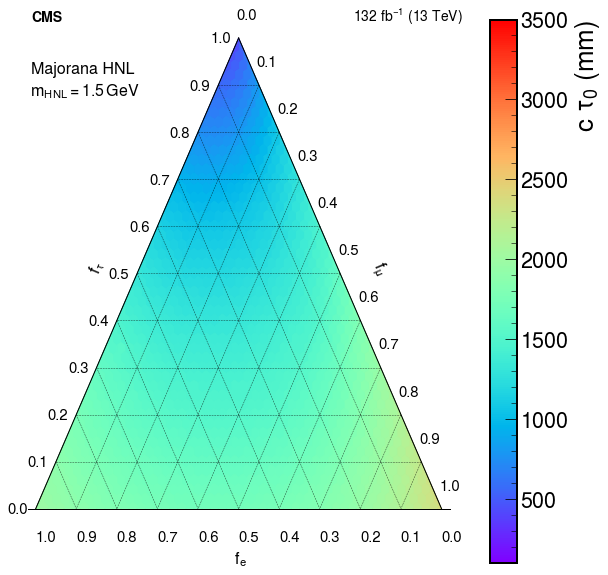

In [65]:
import ternary
from matplotlib.ticker import FormatStrFormatter
## Boundary and Gridlines
scale = 50.0
figure, tax = ternary.figure(scale=scale,permutation="120")

tax.heatmap(d_new_fixed_mass,style="h",cmap="rainbow",cbarlabel="c $\\tau_0$ (mm)" )
# Draw Boundary and Gridlines
tax.boundary(linewidth=1)
tax.gridlines(color="black", multiple=5,linestyle="--",alpha=0.7)
#tax.gridlines(color="blue", multiple=1, linewidth=0.5)

# Set Axis labels and Title
fontsize = 16
offset = 0.12
tax.set_title("", fontsize=fontsize)
tax.left_axis_label("      $f_{\\tau}$", fontsize=fontsize, offset=offset)
tax.right_axis_label("$f_{\\mu}$      ", fontsize=fontsize, offset=offset)
tax.bottom_axis_label("      $f_e$      ", fontsize=fontsize, offset=0)

# Set ticks

tax.ticks(ticks = [x/10 for x in range(11)],axis='blr',permutation='120', clockwise=True, linewidth=1, multiple=1, offset=0.02,tick_formats="%.1f",fontsize=15)



# Background color
tax.set_background_color(color="white", alpha=0.7) # the detault, essentially


# Remove default Matplotlib Axes
tax.clear_matplotlib_ticks()
tax.top_corner_label("Majorana HNL\n $m_{HNL}=1.5 \, \mathrm{GeV}$",position = (-0.35,1,0),fontsize=fontsize)
tax.right_corner_label("CMS",position = (-0.505,1.15,0),fontsize=14,fontweight="bold")
tax.left_corner_label("137 $\mathrm{fb}^{-1}$ (13 TeV)",position = (0.305,1.15,0),fontsize=14)

ax = tax.get_axes()

tax.get_axes().axis('off')
plt.style.use(hep.style.CMS) 

tax.show()
tax.savefig("Ternary_plot_1p5GeV_Majorana.pdf")

In [16]:
for i,j in d_new_fixed_mass.items():
    
    print(tuple(ti/100 for ti in i),j)


(0.0, 0.0, 0.5) 452.2803606955387
(0.0, 0.01, 0.49) 540.5613607321334
(0.0, 0.02, 0.48) 619.2655572123978
(0.0, 0.03, 0.47) 692.8931274837789
(0.0, 0.04, 0.46) 758.8639789912044
(0.0, 0.05, 0.45) 826.0212615626309
(0.0, 0.06, 0.44) 889.4413613886969
(0.0, 0.07, 0.43) 946.29801946916
(0.0, 0.08, 0.42) 1000.2084184260676
(0.0, 0.09, 0.41) 1050.6996394396874
(0.0, 0.1, 0.4) 1098.6801900412852
(0.0, 0.11, 0.39) 1143.025093779073
(0.0, 0.12, 0.38) 1186.5680987572343
(0.0, 0.13, 0.37) 1226.3604851598525
(0.0, 0.14, 0.36) 1264.7658086818124
(0.0, 0.15, 0.35) 1301.963453966392
(0.0, 0.16, 0.34) 1336.807955416314
(0.0, 0.17, 0.33) 1370.5203045966532
(0.0, 0.18, 0.32) 1403.4033392036872
(0.0, 0.19, 0.31) 1434.3048548648774
(0.0, 0.2, 0.3) 1465.891880668207
(0.0, 0.21, 0.29) 1493.9379538827473
(0.0, 0.22, 0.28) 1531.4633386429164
(0.0, 0.23, 0.27) 1569.85503809671
(0.0, 0.24, 0.26) 1609.0135835121976
(0.0, 0.25, 0.25) 1646.1224277247277
(0.0, 0.26, 0.24) 1682.6337583632162
(0.0, 0.27, 0.23) 1718.

(0.42, 0.05, 0.03) 1817.0292922552926
(0.42, 0.06, 0.02) 1822.0918302393982
(0.42, 0.07, 0.01) 1827.7933335327327
(0.42, 0.08, 0.0) 1834.347341524202
(0.43, 0.0, 0.07) 1830.8668866822422
(0.43, 0.01, 0.06) 1831.0983064291906
(0.43, 0.02, 0.05) 1832.2985355579247
(0.43, 0.03, 0.04) 1834.4370763579263
(0.43, 0.04, 0.03) 1837.477525528413
(0.43, 0.05, 0.02) 1841.7578749730062
(0.43, 0.06, 0.01) 1846.313525742602
(0.43, 0.07, 0.0) 1851.8435516676839
(0.44, 0.0, 0.06) 1855.8381903345698
(0.44, 0.01, 0.05) 1855.982767328936
(0.44, 0.02, 0.04) 1857.062765591658
(0.44, 0.03, 0.03) 1859.0504324510978
(0.44, 0.04, 0.02) 1861.9139555055897
(0.44, 0.05, 0.01) 1865.6177676529562
(0.44, 0.06, 0.0) 1870.124650072828
(0.45, 0.0, 0.05) 1880.2715496763217
(0.45, 0.01, 0.04) 1880.3348382157035
(0.45, 0.02, 0.03) 1881.301621959898
(0.45, 0.03, 0.02) 1883.1463317089763
(0.45, 0.04, 0.01) 1885.8715233315736
(0.45, 0.05, 0.0) 1889.3802185604177
(0.46, 0.0, 0.04) 1907.4165510633782
(0.46, 0.01, 0.03) 1907.403

In [63]:
def plot_1D_mixing(target,target_mixing,x_axsis,array):
    if target==x_axsis:
        print("Same x axis and fixed mixing")
        return
    count = 0
    list_of_keys = []
    x_array = []
    y_array = []
    for fe in range(101):
        
        fe=fe/100
        if target=="fe" and fe!=target_mixing: continue

        for fmu in range(101):
            fmu=fmu/100
            if target=="fmu" and fmu!=target_mixing: continue

            for ftau in range(101):
                ftau=ftau/100
                if target=="ftau" and ftau!=target_mixing: continue
                
                if round(fe+fmu+ftau,2) !=1: continue
                if (fe*100,fmu*100,ftau*100) not in array.keys(): continue
                if x_axsis=="fe":
                    x_array.append(fe)
                elif x_axsis=="fmu":
                    x_array.append(fmu)
                elif x_axsis=="ftau":
                    x_array.append(ftau)   
                #print(d[(fe*10,fmu*10,ftau*10)])
                print(fe,fmu,ftau,array[(fe*100,fmu*100,ftau*100)])
                y_array.append(array[(fe*100,fmu*100,ftau*100)])
    fig, ax = plt.subplots(figsize=(8,6))
    ax.plot(x_array,y_array,label=target + str(target_mixing))
    ytext = ax.get_ylim()[1]*0.8
    xtext  =ax.get_xlim()[0]*1.4
    #ax.set_ylim(None,ax.get_ylim()[1]*4)
    ax.legend([target +"   " +str(target_mixing)],title="Combined",loc=1,fontsize="x-small")
    ax.set_xlabel(x_axsis)
    ax.set_ylabel("95% CL Limit on ctau[mm]")
    #ax.text(xtext,ytext,"Majorana")        
    hep.cms.label(ax=ax,label="Preliminary",data=True,lumi=120)

0.0 0.3 0.7 1301.963453966392
0.02 0.3 0.68 1271.3669568649407
0.04 0.3 0.66 1247.9202481729365
0.06 0.3 0.64 1231.8975022508575
0.08 0.3 0.62 1222.539735622541
0.1 0.3 0.6 1218.0954364274269
0.16 0.3 0.54 1228.827431286036
0.18 0.3 0.52 1237.6032369793675
0.2 0.3 0.5 1248.450675208896
0.22 0.3 0.48 1260.7206653307194
0.24 0.3 0.46 1274.307312920183
0.26 0.3 0.44 1289.9808249503078
0.3 0.3 0.4 1321.8003705980864
0.32 0.3 0.38 1337.7181902539137
0.34 0.3 0.36 1355.2663248235483
0.36 0.3 0.34 1374.5636296061216
0.38 0.3 0.32 1391.8118813139167
0.4 0.3 0.3 1411.978815057383
0.44 0.3 0.26 1450.6509040410688
0.46 0.3 0.24 1470.2724659043167
0.48 0.3 0.22 1489.2058875627704
0.5 0.3 0.2 1512.6724477638993
0.52 0.3 0.18 1534.3906176683427
0.54 0.3 0.16 1560.4052002460335
0.6 0.3 0.1 1630.7777506078764
0.62 0.3 0.08 1654.0041117287942
0.64 0.3 0.06 1677.0965581610096
0.66 0.3 0.04 1698.691721087316
0.68 0.3 0.02 1721.4688152375268
0.7 0.3 0.0 1743.6320814987741


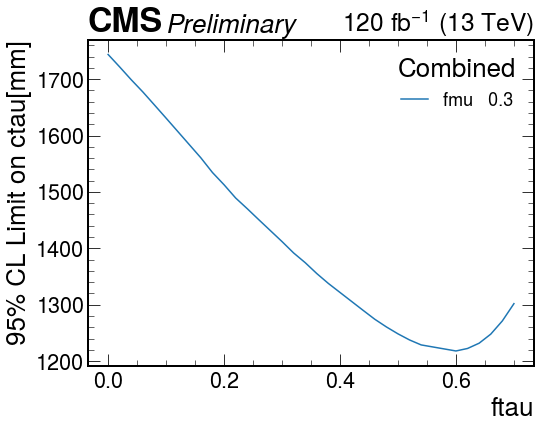

In [64]:
d_plot = {}
for i,j in d_new_fixed_mass.items():
    d_plot[(i[0]*2,i[1]*2,i[2]*2)]= j
plot_1D_mixing("fmu",0.3,"ftau",d_plot)


In [66]:
def plotOneCtau_fpath(fpath,showBand=True,ax=None,addTheory=True,color='black',plotObs=False):
    ctau =  float(fpath[fpath.find("pl")+2:fpath.find("_comb")])     

    
    isDirac = True if "Dirac" in fpath else False
    isTau   = True if "tauType" in fpath else False
    isMixed = True if "mixed" in fpath else False
    if isMixed:
        fe = float(f.split("-")[1][2:].replace("p","."))
        fmu = float(f.split("-")[2][3:].replace("p","."))
        ftau = float(f.split("-")[3].split("_")[0][4:].replace("p","."))
    if isMixed:
        label = r"$ctau_{HNL}=%(ctau)s$, (%(fe)s,%(fmu)s,%(ftau)s)"%({"ctau":ctau,"fe":fe,"fmu":fmu,"ftau":ftau})
        if "ele" in fpath:
            channel = "Electron Channel\n"+label            
            lumi    = "122"
        else:            
            channel = "Muon Channel\n"+label            
            lumi    = "120"
        #channel = "Combined Channel\n"+label    
    if len(glob.glob(fpath))==0:
        print("Cannot find files with ",fpath)
        return
    arr,mass = loadLimitFiles_mass(fpath)
    print(arr,mass)
    arr_i, mass_i,funcs = interpolate1D(arr, mass,-1)

    plt.style.use(hep.style.CMS) 

    if ax ==None:
        fig, ax = plt.subplots(figsize=(8,6))
    ax = plotlimit(ax,arr_i,mass_i,showBand,color=color,plotObs=plotObs)
    if addTheory:
        if isDirac:
            if 'tauType' in fpath:
                ax.plot(mass,f_xsec_tau(mass_i)(ctau)*2,label="Theory")
            else:
                ax.plot(mass,f_xsec(mass_i)(ctau)*2,label="Theory")
        elif isMixed:
            ax.plot(mass,(f_xsec(mass_i)(ctau))*(fe+fmu)+f_xsec_tau(mass_i)(ctau)*ftau,label="Theory")
        else:
            if 'tauType' in fpath:
                ax.plot(mass,f_xsec_tau(mass_i)(ctau),label="Theory")
                #ax.plot(ctau_i,f_xsec(mass)(ctau_i),label="Theory")
            else:
                ax.plot(mass,f_xsec(mass_i)(ctau),label="Theory")            

    ax.set_xlabel("mass[GeV]")
    ax.set_ylabel("95% CL Limit on $\sigma$[pb]")
    ax.set_yscale("log")
    #ax.set_xscale("log")
    if plotObs:
        ax.legend(["Observed","Expected","Theory"],title=channel,loc=1,fontsize="x-small",title_fontsize="x-small")
    else:
        ax.legend(["Expected","Theory"],title=channel,loc=1,fontsize="x-small")
        
    ytext = ax.get_ylim()[1]*0.8
    xtext  =ax.get_xlim()[0]*1.4
    ax.set_ylim(None,ax.get_ylim()[1]*4)

    if isDirac:
        ax.text(xtext,ytext,"Dirac")
    else:
        ax.text(xtext,ytext,"Majorana")        
    hep.cms.label(ax=ax,label="Preliminary",data=True,lumi=lumi)
    
    return ax
def loadLimitFiles_mass(fpath,ctau_max=-1):
    arr =[]
    mass_array = []
    ctau = []
    for f in glob.glob(fpath):
        print(f)
        ct = f.split("/")[-1].split("_")[4].replace("pl","")
        mass = float(f.split("/")[-1].split("_")[3].replace("mHNL","").replace("p","."))  
              
        func_xsec = getf_xsec(f)
        xsec = func_xsec(float(ct))
        signalName = "_".join(f.split("/")[-1].split("_")[1:-1]) 
        with uproot.open(f) as file:
                if "limit;1" not in file.keys(): continue
        limit = loadLimits(f)
        norm=1
        if len(limit) !=6:
            print("Problem loading limit for ",signalName)
            print(limit)
        else:
            if ctau_max>-1:
                if float(ct)<ctau_max:
                    arr.append(loadLimits(f)*xsec/norm)
                    ctau.append(float(ct))
                    mass_array.append(float(mass))
            else:
                arr.append(loadLimits(f)*xsec/norm)
                ctau.append(float(ct))
                mass_array.append(float(mass))
    arr = np.array(arr)
    ctau = np.array(ctau)
    mass = np.array(mass_array)
    print(mass)
    return arr,mass
def get_mass_xing(fpath,init_mass):
    ## get limit and ctau from path
    arr,mass = loadLimitFiles_mass(fpath)
    ## get iterpolated limit and ctau from path    
    arr_i, mass_i,funcs = interpolate1D(arr, mass,-1)
    print(arr_i,mass_i)
    func_xsec = getf_xsec_m(fpath)
    mass_xing = intersect(funcs,func_xsec,init_mass)
    return mass_xing

def getf_xsec_m(f):
    print(f)
    print(f[f.find("pl")])
    print(f[f.find("_comb")])
    print(f[f.find("pl")+2:f.find("_comb")])
    ctau =  float(f[f.find("pl")+2:f.find("_comb")]) 

       
    if "mixed" in f:
        fe = float(f.split("-")[1][2:].replace("p","."))
        fmu = float(f.split("-")[2][3:].replace("p","."))
        ftau = float(f.split("-")[3].split("_")[0][4:].replace("p","."))
        return lambda x: f_xsec(x)(ctau)*(fe+fmu) + f_xsec_tau(x)(ctau)*ftau
    else:
        if "tauType" in f:
            return f_xsec_tau(mass)
        else:
            return f_xsec(mass)
    print("ERROR: cannot find xsec function for ",f)
    return


In [68]:
import os
basedir="/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/"
d_1 = dict()

fpath = basedir + "/higgsCombine_HNL_mixed-fe%(fe)s-fmu%(fmu)s-ftau%(ftau)s_mHNL*p0_pl1000_comb*.root"
print(fpath)
for fe in range(110):
    #if fe==0: continue
    fe=fe/100
    for fmu in range(101):
        fmu=fmu/100
        for ftau in range (101):
            ftau= ftau/100
            
            if round(fe+fmu+ftau,2) !=1: continue
            fpath_new = fpath%({"fe":str(fe).replace(".","p"),
                                "fmu":str(fmu).replace(".","p"),
                                "ftau":str(ftau).replace(".","p"),})
            #print(fpath_new)
            #print(get_ct_xing(fpath_new,1500))
            print(fpath_new)
            arr, mass = loadLimitFiles_mass(fpath_new)
            if not list(arr): continue
            #if 1000 not in list(ctau): continue
            #d[(fe*10,fmu*10,ftau*10)] = arr[list(ctau).index(1000)][-1]
            d_1[(round(fe*100,2),round(fmu*100,2),round(ftau*100,2))]=get_mass_xing(fpath_new,1.3)[-1]
print(d_1)
#ax = plotOneMass_fpath(fpath,plotObs=False)
#ax.set_ylim(None,1e4)
#ax.set_xlim(1e2,1e4)
#test = get_ct_xing(fpath,1500)
#print(test)

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe%(fe)s-fmu%(fmu)s-ftau%(ftau)s_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p0-ftau1p0_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p0-ftau1p0_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p0-ftau1p0_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p0-ftau1p0_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p0-ftau1p0_mHNL2p0_pl

/cvmfs/sft.cern.ch/lcg/views/LCG_98python3/x86_64-centos7-gcc9-opt/lib/python3.7/site-packages/scipy/optimize/minpack.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p03-ftau0p97_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p04-ftau0p96_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p04-ftau0p96_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p04-ftau0p96_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p04-ftau0p96_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p04-ftau0p96_mHNL2p0

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p1-ftau0p9_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p1-ftau0p9_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p1-ftau0p9_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p1-ftau0p9_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p1-ftau0p9_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p1-ftau0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p15-ftau0p85_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p16-ftau0p84_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p16-ftau0p84_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p16-ftau0p84_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p16-ftau0p84_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p16-ftau0p84_mHNL1p0

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p22-ftau0p78_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p22-ftau0p78_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p22-ftau0p78_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p22-ftau0p78_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p22-ftau0p78_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p27-ftau0p73_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p28-ftau0p72_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p28-ftau0p72_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p28-ftau0p72_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p28-ftau0p72_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p28-ftau0p72_mHNL2p0

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p34-ftau0p66_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p34-ftau0p66_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p34-ftau0p66_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p34-ftau0p66_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p34-ftau0p66_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p4-ftau0p6_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p4-ftau0p6_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p4-ftau0p6_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p4-ftau0p6_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p4-ftau0p6_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-f

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p46-ftau0p54_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p46-ftau0p54_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p46-ftau0p54_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p46-ftau0p54_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p46-ftau0p54_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p52-ftau0p48_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p52-ftau0p48_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p52-ftau0p48_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p52-ftau0p48_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p52-ftau0p48_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p58-ftau0p42_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p58-ftau0p42_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p58-ftau0p42_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p58-ftau0p42_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p58-ftau0p42_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p64-ftau0p36_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p64-ftau0p36_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p64-ftau0p36_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p64-ftau0p36_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p64-ftau0p36_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p7-ftau0p3_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p7-ftau0p3_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p7-ftau0p3_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p7-ftau0p3_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p7-ftau0p3_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p7-ftau0p

_
1000
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p75-ftau0p25_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p76-ftau0p24_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p76-ftau0p24_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p76-ftau0p24_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p76-ftau0p24_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p76-ftau0p24_

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p82-ftau0p18_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p82-ftau0p18_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p82-ftau0p18_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p82-ftau0p18_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p82-ftau0p18_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p87-ftau0p13_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p88-ftau0p12_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p88-ftau0p12_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p88-ftau0p12_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p88-ftau0p12_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p88-ftau0p12_mHNL2p0

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p94-ftau0p06_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p94-ftau0p06_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p94-ftau0p06_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p94-ftau0p06_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu0p94-ftau0p06_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu0p99-ftau0p01_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p0-fmu1p0-ftau0p0_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu1p0-ftau0p0_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu1p0-ftau0p0_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu1p0-ftau0p0_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p0-fmu1p0-ftau0p0_mHNL2p0_pl1000_co

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p01-fmu0p33-ftau0p66_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p01-fmu0p34-ftau0p65_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p01-fmu0p35-ftau0p64_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p01-fmu0p36-ftau0p63_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p01-fmu0p37-ftau0p62_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p01-fmu0p38-ftau0p61_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschind

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p01-fmu0p85-ftau0p14_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p01-fmu0p86-ftau0p13_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p01-fmu0p87-ftau0p12_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p01-fmu0p88-ftau0p11_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p01-fmu0p89-ftau0p1_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p01-fmu0p9-ftau0p09_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/

../HNLprocessor/util.py:9: RuntimeWarning: overflow encountered in exp
  return np.exp(np.poly1d(np.polyfit(x0,np.log(y0),5))(x))


[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p02-ftau0p96_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p02-ftau0p96_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p02-ftau0p96_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p02-ftau0p96_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p02-ftau0p96_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p07-ftau0p91_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p08-ftau0p9_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p08-ftau0p9_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p08-ftau0p9_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p08-ftau0p9_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p08-ftau0p9_mHNL1p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p14-ftau0p84_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p14-ftau0p84_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p14-ftau0p84_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p14-ftau0p84_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p14-ftau0p84_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p2-ftau0p78_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p2-ftau0p78_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p2-ftau0p78_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p2-ftau0p78_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p2-ftau0p78_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p26-ftau0p72_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p26-ftau0p72_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p26-ftau0p72_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p26-ftau0p72_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p26-ftau0p72_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p32-ftau0p66_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p32-ftau0p66_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p32-ftau0p66_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p32-ftau0p66_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p32-ftau0p66_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p37-ftau0p61_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p38-ftau0p6_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p38-ftau0p6_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p38-ftau0p6_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p38-ftau0p6_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p38-ftau0p6_mHNL2p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p44-ftau0p54_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p44-ftau0p54_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p44-ftau0p54_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p44-ftau0p54_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p44-ftau0p54_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p5-ftau0p48_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p5-ftau0p48_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p5-ftau0p48_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p5-ftau0p48_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p5-ftau0p48_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p56-ftau0p42_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p56-ftau0p42_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p56-ftau0p42_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p56-ftau0p42_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p56-ftau0p42_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p62-ftau0p36_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p62-ftau0p36_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p62-ftau0p36_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p62-ftau0p36_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p62-ftau0p36_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p68-ftau0p3_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p68-ftau0p3_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p68-ftau0p3_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p68-ftau0p3_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p68-ftau0p3_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fm

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p74-ftau0p24_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p74-ftau0p24_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p74-ftau0p24_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p74-ftau0p24_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p74-ftau0p24_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p8-ftau0p18_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p8-ftau0p18_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p8-ftau0p18_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p8-ftau0p18_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p8-ftau0p18_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p86-ftau0p12_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p86-ftau0p12_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p86-ftau0p12_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p86-ftau0p12_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p86-ftau0p12_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p92-ftau0p06_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p92-ftau0p06_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p92-ftau0p06_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p92-ftau0p06_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p92-ftau0p06_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p97-ftau0p01_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p02-fmu0p98-ftau0p0_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p98-ftau0p0_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p98-ftau0p0_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p98-ftau0p0_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p02-fmu0p98-ftau0p0_mHNL1p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p03-fmu0p33-ftau0p64_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p03-fmu0p34-ftau0p63_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p03-fmu0p35-ftau0p62_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p03-fmu0p36-ftau0p61_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p03-fmu0p37-ftau0p6_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p03-fmu0p38-ftau0p59_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p03-fmu0p85-ftau0p12_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p03-fmu0p86-ftau0p11_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p03-fmu0p87-ftau0p1_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p03-fmu0p88-ftau0p09_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p03-fmu0p89-ftau0p08_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p03-fmu0p9-ftau0p07_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p04-ftau0p92_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p04-ftau0p92_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p04-ftau0p92_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p04-ftau0p92_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p04-ftau0p92_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

[2. 4. 1.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p1-ftau0p86_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p1-ftau0p86_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p1-ftau0p86_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p1-ftau0p86_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p1-ftau0p86_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p16-ftau0p8_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p16-ftau0p8_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p16-ftau0p8_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p16-ftau0p8_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p16-ftau0p8_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p22-ftau0p74_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p22-ftau0p74_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p22-ftau0p74_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p22-ftau0p74_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p22-ftau0p74_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

[4. 1. 2.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p28-ftau0p68_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p28-ftau0p68_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p28-ftau0p68_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p28-ftau0p68_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p28-ftau0p68_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majorann

[1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p34-ftau0p62_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p34-ftau0p62_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p34-ftau0p62_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p34-ftau0p62_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p34-ftau0p62_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majorann

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p4-ftau0p56_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p4-ftau0p56_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p4-ftau0p56_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p4-ftau0p56_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p4-ftau0p56_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[2. 1. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p46-ftau0p5_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p46-ftau0p5_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p46-ftau0p5_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p46-ftau0p5_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p46-ftau0p5_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

[2. 1. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p52-ftau0p44_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p52-ftau0p44_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p52-ftau0p44_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p52-ftau0p44_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p52-ftau0p44_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majorann

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p58-ftau0p38_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p58-ftau0p38_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p58-ftau0p38_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p58-ftau0p38_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p58-ftau0p38_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p64-ftau0p32_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p64-ftau0p32_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p64-ftau0p32_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p64-ftau0p32_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p64-ftau0p32_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

[1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p7-ftau0p26_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p7-ftau0p26_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p7-ftau0p26_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p7-ftau0p26_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p7-ftau0p26_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

[2. 4. 1.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p76-ftau0p2_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p76-ftau0p2_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p76-ftau0p2_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p76-ftau0p2_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p76-ftau0p2_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p82-ftau0p14_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p82-ftau0p14_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p82-ftau0p14_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p82-ftau0p14_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p82-ftau0p14_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

[1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p88-ftau0p08_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p88-ftau0p08_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p88-ftau0p08_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p88-ftau0p08_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p88-ftau0p08_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majorann

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p94-ftau0p02_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p94-ftau0p02_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p94-ftau0p02_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p94-ftau0p02_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p04-fmu0p94-ftau0p02_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p05-fmu0p24-ftau0p71_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p05-fmu0p25-ftau0p7_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p05-fmu0p26-ftau0p69_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p05-fmu0p27-ftau0p68_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p05-fmu0p28-ftau0p67_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p05-fmu0p29-ftau0p66_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p05-fmu0p76-ftau0p19_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p05-fmu0p77-ftau0p18_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p05-fmu0p78-ftau0p17_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p05-fmu0p79-ftau0p16_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p05-fmu0p8-ftau0p15_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p05-fmu0p81-ftau0p14_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p04-ftau0p9_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p04-ftau0p9_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p04-ftau0p9_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p04-ftau0p9_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p04-ftau0p9_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p1-ftau0p84_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p1-ftau0p84_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p1-ftau0p84_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p1-ftau0p84_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p1-ftau0p84_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fm

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p15-ftau0p79_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p16-ftau0p78_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p16-ftau0p78_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p16-ftau0p78_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p16-ftau0p78_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p16-ftau0p78_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p22-ftau0p72_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p22-ftau0p72_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p22-ftau0p72_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p22-ftau0p72_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p22-ftau0p72_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p28-ftau0p66_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p28-ftau0p66_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p28-ftau0p66_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p28-ftau0p66_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p28-ftau0p66_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p34-ftau0p6_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p34-ftau0p6_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p34-ftau0p6_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p34-ftau0p6_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p34-ftau0p6_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p4-ftau0p54_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p4-ftau0p54_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p4-ftau0p54_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p4-ftau0p54_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p4-ftau0p54_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p46-ftau0p48_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p46-ftau0p48_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p46-ftau0p48_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p46-ftau0p48_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p46-ftau0p48_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p51-ftau0p43_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p52-ftau0p42_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p52-ftau0p42_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p52-ftau0p42_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p52-ftau0p42_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p52-ftau0p42_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p58-ftau0p36_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p58-ftau0p36_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p58-ftau0p36_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p58-ftau0p36_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p58-ftau0p36_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p63-ftau0p31_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p64-ftau0p3_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p64-ftau0p3_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p64-ftau0p3_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p64-ftau0p3_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p64-ftau0p3_mHNL4p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p69-ftau0p25_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p7-ftau0p24_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p7-ftau0p24_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p7-ftau0p24_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p7-ftau0p24_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p7-ftau0p24_mHNL2p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p76-ftau0p18_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p76-ftau0p18_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p76-ftau0p18_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p76-ftau0p18_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p76-ftau0p18_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p82-ftau0p12_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p82-ftau0p12_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p82-ftau0p12_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p82-ftau0p12_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p82-ftau0p12_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p87-ftau0p07_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p88-ftau0p06_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p88-ftau0p06_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p88-ftau0p06_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p88-ftau0p06_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p88-ftau0p06_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p06-fmu0p94-ftau0p0_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p94-ftau0p0_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p94-ftau0p0_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p94-ftau0p0_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fmu0p94-ftau0p0_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p06-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p07-fmu0p35-ftau0p58_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p07-fmu0p36-ftau0p57_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p07-fmu0p37-ftau0p56_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p07-fmu0p38-ftau0p55_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p07-fmu0p39-ftau0p54_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p07-fmu0p4-ftau0p53_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p07-fmu0p87-ftau0p06_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p07-fmu0p88-ftau0p05_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p07-fmu0p89-ftau0p04_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p07-fmu0p9-ftau0p03_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p07-fmu0p91-ftau0p02_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p07-fmu0p92-ftau0p01_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p04-ftau0p88_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p04-ftau0p88_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p04-ftau0p88_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p04-ftau0p88_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p04-ftau0p88_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

[1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p1-ftau0p82_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p1-ftau0p82_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p1-ftau0p82_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p1-ftau0p82_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p1-ftau0p82_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p16-ftau0p76_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p16-ftau0p76_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p16-ftau0p76_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p16-ftau0p76_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p16-ftau0p76_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

[4. 1. 2.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p22-ftau0p7_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p22-ftau0p7_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p22-ftau0p7_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p22-ftau0p7_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p22-ftau0p7_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p28-ftau0p64_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p28-ftau0p64_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p28-ftau0p64_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p28-ftau0p64_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p28-ftau0p64_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

[4. 1. 2.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p34-ftau0p58_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p34-ftau0p58_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p34-ftau0p58_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p34-ftau0p58_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p34-ftau0p58_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majorann

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p4-ftau0p52_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p4-ftau0p52_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
[4. 2. 1.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p4-ftau0p52_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p4-ftau0p52_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p4-ftau0p52_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p46-ftau0p46_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p46-ftau0p46_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p46-ftau0p46_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p46-ftau0p46_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p46-ftau0p46_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p52-ftau0p4_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p52-ftau0p4_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p52-ftau0p4_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p52-ftau0p4_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p52-ftau0p4_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[2. 4. 1.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p58-ftau0p34_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p58-ftau0p34_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p58-ftau0p34_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p58-ftau0p34_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p58-ftau0p34_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majorann

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p64-ftau0p28_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p64-ftau0p28_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p64-ftau0p28_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p64-ftau0p28_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p64-ftau0p28_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

[1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p7-ftau0p22_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p7-ftau0p22_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p7-ftau0p22_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p7-ftau0p22_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p7-ftau0p22_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p76-ftau0p16_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p76-ftau0p16_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p76-ftau0p16_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p76-ftau0p16_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
[1. 2. 4.]
[[0.26172605 0.35987333 0.52345211 0.78635139 1.15443982 0.58638781]
 [0.18625741 0.25464881 0.37251483 0.55812232 0.81401705 0.4112036 ]
 [0.09025689 0.12339809 0.18051377 0.2718948  0.39958426 0.19869823]] [1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/l

[1. 4. 2.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p82-ftau0p1_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p82-ftau0p1_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p82-ftau0p1_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p82-ftau0p1_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p82-ftau0p1_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p88-ftau0p04_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p88-ftau0p04_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p88-ftau0p04_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p88-ftau0p04_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p08-fmu0p88-ftau0p04_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p09-fmu0p07-ftau0p84_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p09-fmu0p08-ftau0p83_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p09-fmu0p09-ftau0p82_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p09-fmu0p1-ftau0p81_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p09-fmu0p11-ftau0p8_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p09-fmu0p12-ftau0p79_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p09-fmu0p59-ftau0p32_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p09-fmu0p6-ftau0p31_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p09-fmu0p61-ftau0p3_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p09-fmu0p62-ftau0p29_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p09-fmu0p63-ftau0p28_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p09-fmu0p64-ftau0p27_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p02-ftau0p88_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p02-ftau0p88_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p02-ftau0p88_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p02-ftau0p88_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p02-ftau0p88_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p08-ftau0p82_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p08-ftau0p82_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p08-ftau0p82_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p08-ftau0p82_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p08-ftau0p82_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p14-ftau0p76_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p14-ftau0p76_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p14-ftau0p76_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p14-ftau0p76_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p14-ftau0p76_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p2-ftau0p7_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p2-ftau0p7_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p2-ftau0p7_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p2-ftau0p7_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p2-ftau0p7_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-f

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p26-ftau0p64_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p26-ftau0p64_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p26-ftau0p64_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p26-ftau0p64_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p26-ftau0p64_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p32-ftau0p58_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p32-ftau0p58_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p32-ftau0p58_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p32-ftau0p58_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p32-ftau0p58_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p38-ftau0p52_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p38-ftau0p52_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p38-ftau0p52_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p38-ftau0p52_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p38-ftau0p52_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p44-ftau0p46_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p44-ftau0p46_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p44-ftau0p46_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p44-ftau0p46_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p44-ftau0p46_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p5-ftau0p4_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p5-ftau0p4_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p5-ftau0p4_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p5-ftau0p4_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p5-ftau0p4_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-f

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p56-ftau0p34_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p56-ftau0p34_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p56-ftau0p34_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p56-ftau0p34_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p56-ftau0p34_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p61-ftau0p29_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p62-ftau0p28_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p62-ftau0p28_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p62-ftau0p28_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p62-ftau0p28_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p62-ftau0p28_mHNL1p0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p67-ftau0p23_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p68-ftau0p22_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p68-ftau0p22_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p68-ftau0p22_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p68-ftau0p22_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p68-ftau0p22_mHNL1p0

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p74-ftau0p16_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p74-ftau0p16_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p74-ftau0p16_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p74-ftau0p16_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p74-ftau0p16_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p8-ftau0p1_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p8-ftau0p1_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p8-ftau0p1_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p8-ftau0p1_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p8-ftau0p1_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-f

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p1-fmu0p86-ftau0p04_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p86-ftau0p04_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p86-ftau0p04_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p86-ftau0p04_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu0p86-ftau0p04_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p1-fmu

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p11-fmu0p02-ftau0p87_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p11-fmu0p03-ftau0p86_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p11-fmu0p04-ftau0p85_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p11-fmu0p05-ftau0p84_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p11-fmu0p06-ftau0p83_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p11-fmu0p07-ftau0p82_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschind

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p11-fmu0p54-ftau0p35_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p11-fmu0p55-ftau0p34_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p11-fmu0p56-ftau0p33_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p11-fmu0p57-ftau0p32_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p11-fmu0p58-ftau0p31_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p11-fmu0p59-ftau0p3_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl

_
1000
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p01-ftau0p87_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p02-ftau0p86_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p02-ftau0p86_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p02-ftau0p86_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p02-ftau0p86_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p02-fta

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p08-ftau0p8_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p08-ftau0p8_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p08-ftau0p8_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p08-ftau0p8_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p08-ftau0p8_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fm

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p14-ftau0p74_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p14-ftau0p74_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p14-ftau0p74_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p14-ftau0p74_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p14-ftau0p74_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p2-ftau0p68_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p2-ftau0p68_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p2-ftau0p68_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p2-ftau0p68_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p2-ftau0p68_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fm

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p25-ftau0p63_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p26-ftau0p62_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p26-ftau0p62_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p26-ftau0p62_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p26-ftau0p62_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p26-ftau0p62_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p32-ftau0p56_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p32-ftau0p56_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p32-ftau0p56_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p32-ftau0p56_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p32-ftau0p56_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p37-ftau0p51_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p38-ftau0p5_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p38-ftau0p5_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p38-ftau0p5_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p38-ftau0p5_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p38-ftau0p5_mHNL2p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p43-ftau0p45_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p44-ftau0p44_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p44-ftau0p44_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p44-ftau0p44_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p44-ftau0p44_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p44-ftau0p44_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p5-ftau0p38_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p5-ftau0p38_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p5-ftau0p38_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p5-ftau0p38_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p5-ftau0p38_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fm

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p56-ftau0p32_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p56-ftau0p32_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p56-ftau0p32_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p56-ftau0p32_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p56-ftau0p32_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p62-ftau0p26_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p62-ftau0p26_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p62-ftau0p26_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p62-ftau0p26_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p62-ftau0p26_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p67-ftau0p21_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p68-ftau0p2_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p68-ftau0p2_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p68-ftau0p2_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p68-ftau0p2_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p68-ftau0p2_mHNL2p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p74-ftau0p14_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p74-ftau0p14_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p74-ftau0p14_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p74-ftau0p14_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p74-ftau0p14_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p79-ftau0p09_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p8-ftau0p08_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p8-ftau0p08_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p8-ftau0p08_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p8-ftau0p08_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p8-ftau0p08_mHNL4p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p12-fmu0p86-ftau0p02_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p86-ftau0p02_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p86-ftau0p02_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p86-ftau0p02_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p12-fmu0p86-ftau0p02_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p13-fmu0p17-ftau0p7_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p13-fmu0p18-ftau0p69_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p13-fmu0p19-ftau0p68_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p13-fmu0p2-ftau0p67_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p13-fmu0p21-ftau0p66_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p13-fmu0p22-ftau0p65_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p13-fmu0p69-ftau0p18_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p13-fmu0p7-ftau0p17_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p13-fmu0p71-ftau0p16_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p13-fmu0p72-ftau0p15_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p13-fmu0p73-ftau0p14_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p13-fmu0p74-ftau0p13_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p03-ftau0p83_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p04-ftau0p82_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p04-ftau0p82_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p04-ftau0p82_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p04-ftau0p82_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p04-ftau0p82_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p1-ftau0p76_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p1-ftau0p76_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p1-ftau0p76_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p1-ftau0p76_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p1-ftau0p76_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p16-ftau0p7_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p16-ftau0p7_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p16-ftau0p7_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p16-ftau0p7_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p16-ftau0p7_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fm

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p21-ftau0p65_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p22-ftau0p64_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p22-ftau0p64_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p22-ftau0p64_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p22-ftau0p64_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p22-ftau0p64_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p28-ftau0p58_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p28-ftau0p58_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p28-ftau0p58_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p28-ftau0p58_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p28-ftau0p58_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p33-ftau0p53_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p34-ftau0p52_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p34-ftau0p52_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p34-ftau0p52_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p34-ftau0p52_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p34-ftau0p52_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p39-ftau0p47_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p4-ftau0p46_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p4-ftau0p46_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p4-ftau0p46_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p4-ftau0p46_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p4-ftau0p46_mHNL2p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p46-ftau0p4_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p46-ftau0p4_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p46-ftau0p4_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p46-ftau0p4_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p46-ftau0p4_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fm

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p51-ftau0p35_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p52-ftau0p34_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p52-ftau0p34_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p52-ftau0p34_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p52-ftau0p34_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p52-ftau0p34_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p58-ftau0p28_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p58-ftau0p28_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p58-ftau0p28_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p58-ftau0p28_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p58-ftau0p28_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p63-ftau0p23_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p64-ftau0p22_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p64-ftau0p22_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p64-ftau0p22_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p64-ftau0p22_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p64-ftau0p22_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p7-ftau0p16_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p7-ftau0p16_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p7-ftau0p16_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p7-ftau0p16_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p7-ftau0p16_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p76-ftau0p1_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p76-ftau0p1_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p76-ftau0p1_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p76-ftau0p1_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p76-ftau0p1_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fm

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p81-ftau0p05_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p14-fmu0p82-ftau0p04_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p82-ftau0p04_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p82-ftau0p04_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p82-ftau0p04_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p14-fmu0p82-ftau0p04_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p15-fmu0p01-ftau0p84_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p15-fmu0p02-ftau0p83_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p15-fmu0p03-ftau0p82_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p15-fmu0p04-ftau0p81_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p15-fmu0p05-ftau0p8_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p15-fmu0p06-ftau0p79_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p15-fmu0p53-ftau0p32_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p15-fmu0p54-ftau0p31_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p15-fmu0p55-ftau0p3_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p15-fmu0p56-ftau0p29_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p15-fmu0p57-ftau0p28_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p15-fmu0p58-ftau0p27_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p02-ftau0p82_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p02-ftau0p82_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p02-ftau0p82_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p02-ftau0p82_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p02-ftau0p82_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p08-ftau0p76_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p08-ftau0p76_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p08-ftau0p76_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p08-ftau0p76_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p08-ftau0p76_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

_
1000
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p13-ftau0p71_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p14-ftau0p7_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p14-ftau0p7_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p14-ftau0p7_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p14-ftau0p7_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p14-ftau0p7

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p2-ftau0p64_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p2-ftau0p64_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p2-ftau0p64_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p2-ftau0p64_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p2-ftau0p64_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fm

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p25-ftau0p59_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p26-ftau0p58_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p26-ftau0p58_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p26-ftau0p58_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p26-ftau0p58_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p26-ftau0p58_m

[1. 4. 2.]
[[0.95020039 1.30652554 1.90040078 2.84728565 4.14129268 2.56549645]
 [0.65465698 0.8963472  1.29916423 1.94130122 2.82035575 1.73973581]
 [0.26063594 0.35837442 0.52127189 0.78307619 1.14336559 0.69610382]] [1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p3-ftau0p54_mHNL*p0_pl1000_comb*.root
p
_
1000
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p31-ftau0p53_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p32-ftau0p52_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p32-ftau0p52_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p38-ftau0p46_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p38-ftau0p46_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p38-ftau0p46_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p38-ftau0p46_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p38-ftau0p46_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p44-ftau0p4_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p44-ftau0p4_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p44-ftau0p4_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p44-ftau0p4_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p44-ftau0p4_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p5-ftau0p34_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p5-ftau0p34_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p5-ftau0p34_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p5-ftau0p34_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p5-ftau0p34_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fm

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p56-ftau0p28_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p56-ftau0p28_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p56-ftau0p28_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p56-ftau0p28_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p56-ftau0p28_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p62-ftau0p22_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p62-ftau0p22_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p62-ftau0p22_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p62-ftau0p22_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p62-ftau0p22_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p68-ftau0p16_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p68-ftau0p16_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p68-ftau0p16_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p68-ftau0p16_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p68-ftau0p16_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p74-ftau0p1_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p74-ftau0p1_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p74-ftau0p1_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p74-ftau0p1_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p74-ftau0p1_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p16-fmu0p8-ftau0p04_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p8-ftau0p04_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p8-ftau0p04_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p8-ftau0p04_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fmu0p8-ftau0p04_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p16-fm

p
_
1000
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p17-fmu0p0-ftau0p83_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p17-fmu0p01-ftau0p82_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p17-fmu0p02-ftau0p81_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p17-fmu0p03-ftau0p8_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p17-fmu0p04-ftau0p79_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p17-fmu0p05-ftau0p78_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jsc

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p17-fmu0p52-ftau0p31_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p17-fmu0p53-ftau0p3_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p17-fmu0p54-ftau0p29_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p17-fmu0p55-ftau0p28_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p17-fmu0p56-ftau0p27_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p17-fmu0p57-ftau0p26_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p02-ftau0p8_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p02-ftau0p8_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p02-ftau0p8_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p02-ftau0p8_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p02-ftau0p8_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p07-ftau0p75_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p08-ftau0p74_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p08-ftau0p74_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p08-ftau0p74_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p08-ftau0p74_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p08-ftau0p74_m

[4. 2. 1.]
[[1.74461127 2.41960968 3.54460703 5.35311334 7.8539386  5.37581595]
 [1.15967701 1.59220172 2.33761664 3.51166447 5.141413   3.48102574]
 [0.44814035 0.61791574 0.91050737 1.37868982 2.03569618 1.36673843]] [1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p12-ftau0p7_mHNL*p0_pl1000_comb*.root
p
_
1000
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p13-ftau0p69_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p14-ftau0p68_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p14-ftau0p68_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine

[2. 4. 1.]
[[1.40244027 1.91739881 2.80488055 4.20242718 6.14610902 4.09017483]
 [0.93705483 1.28845039 1.87410966 2.80789479 4.08399992 2.69872573]
 [0.36531376 0.50156483 0.7363805  1.10915647 1.62563331 1.06128327]] [1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p18-ftau0p64_mHNL*p0_pl1000_comb*.root
p
_
1000
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p19-ftau0p63_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p2-ftau0p62_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p2-ftau0p62_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p26-ftau0p56_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p26-ftau0p56_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p26-ftau0p56_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p26-ftau0p56_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p26-ftau0p56_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p32-ftau0p5_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p32-ftau0p5_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p32-ftau0p5_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p32-ftau0p5_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p32-ftau0p5_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p38-ftau0p44_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p38-ftau0p44_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p38-ftau0p44_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p38-ftau0p44_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p38-ftau0p44_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p43-ftau0p39_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p44-ftau0p38_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p44-ftau0p38_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p44-ftau0p38_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p44-ftau0p38_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p44-ftau0p38_m

[1. 2. 4.]
[[0.51314624 0.69188395 1.01050336 1.52204793 2.21867163 1.31010872]
 [0.35807168 0.49026675 0.71059186 1.06181558 1.54691685 0.90883921]
 [0.15352881 0.21110212 0.30705762 0.46127468 0.67350481 0.39124175]] [1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p48-ftau0p34_mHNL*p0_pl1000_comb*.root
p
_
1000
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p49-ftau0p33_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p5-ftau0p32_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p5-ftau0p32_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p56-ftau0p26_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p56-ftau0p26_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p56-ftau0p26_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p56-ftau0p26_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p56-ftau0p26_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p61-ftau0p21_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p62-ftau0p2_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p62-ftau0p2_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p62-ftau0p2_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p62-ftau0p2_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p62-ftau0p2_mHNL4p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p67-ftau0p15_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p68-ftau0p14_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p68-ftau0p14_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p68-ftau0p14_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p68-ftau0p14_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p68-ftau0p14_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p18-fmu0p74-ftau0p08_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p74-ftau0p08_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p74-ftau0p08_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p74-ftau0p08_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p74-ftau0p08_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p8-ftau0p02_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p8-ftau0p02_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p8-ftau0p02_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p8-ftau0p02_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p18-fmu0p8-ftau0p02_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p19-fmu0p18-ftau0p63_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p19-fmu0p19-ftau0p62_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p19-fmu0p2-ftau0p61_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p19-fmu0p21-ftau0p6_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p19-fmu0p22-ftau0p59_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p19-fmu0p23-ftau0p58_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p19-fmu0p7-ftau0p11_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p19-fmu0p71-ftau0p1_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p19-fmu0p72-ftau0p09_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p19-fmu0p73-ftau0p08_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p19-fmu0p74-ftau0p07_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p19-fmu0p75-ftau0p06_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/

[1. 4. 2.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p04-ftau0p76_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p04-ftau0p76_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p04-ftau0p76_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p04-ftau0p76_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p04-ftau0p76_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p1-ftau0p7_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p1-ftau0p7_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p1-ftau0p7_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p1-ftau0p7_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p1-ftau0p7_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p16-ftau0p64_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p16-ftau0p64_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p16-ftau0p64_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p16-ftau0p64_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p16-ftau0p64_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[2. 1. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p22-ftau0p58_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p22-ftau0p58_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p22-ftau0p58_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p22-ftau0p58_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p22-ftau0p58_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p28-ftau0p52_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p28-ftau0p52_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p28-ftau0p52_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p28-ftau0p52_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p28-ftau0p52_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[1. 4. 2.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p34-ftau0p46_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p34-ftau0p46_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p34-ftau0p46_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p34-ftau0p46_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p34-ftau0p46_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

[2. 1. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p4-ftau0p4_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p4-ftau0p4_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p4-ftau0p4_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p4-ftau0p4_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p4-ftau0p4_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_

[1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p46-ftau0p34_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p46-ftau0p34_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p46-ftau0p34_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p46-ftau0p34_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p46-ftau0p34_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p52-ftau0p28_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p52-ftau0p28_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p52-ftau0p28_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p52-ftau0p28_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p52-ftau0p28_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p58-ftau0p22_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p58-ftau0p22_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p58-ftau0p22_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p58-ftau0p22_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p58-ftau0p22_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p64-ftau0p16_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p64-ftau0p16_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p64-ftau0p16_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p64-ftau0p16_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p64-ftau0p16_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[4. 1. 2.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p7-ftau0p1_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p7-ftau0p1_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p7-ftau0p1_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p7-ftau0p1_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p7-ftau0p1_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p76-ftau0p04_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p76-ftau0p04_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p76-ftau0p04_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p76-ftau0p04_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p2-fmu0p76-ftau0p04_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p21-fmu0p07-ftau0p72_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p21-fmu0p08-ftau0p71_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p21-fmu0p09-ftau0p7_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p21-fmu0p1-ftau0p69_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p21-fmu0p11-ftau0p68_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p21-fmu0p12-ftau0p67_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p21-fmu0p59-ftau0p2_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p21-fmu0p6-ftau0p19_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p21-fmu0p61-ftau0p18_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p21-fmu0p62-ftau0p17_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p21-fmu0p63-ftau0p16_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p21-fmu0p64-ftau0p15_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/

[1. 2. 4.]
[[1.97768244 2.7583199  4.14989102 6.4657214  9.78283745 7.01075712]
 [1.32103196 1.85380984 2.7720015  4.27470852 6.43312365 4.57216799]
 [0.49733775 0.70430278 1.0609872  1.65729603 2.52760696 1.78266606]] [1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p22-fmu0p02-ftau0p76_mHNL*p0_pl1000_comb*.root
p
_
1000
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p22-fmu0p03-ftau0p75_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p22-fmu0p04-ftau0p74_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p04-ftau0p74_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombin

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p22-fmu0p09-ftau0p69_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p22-fmu0p1-ftau0p68_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p1-ftau0p68_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p1-ftau0p68_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p1-ftau0p68_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p1-ftau0p68_mHNL4p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p22-fmu0p16-ftau0p62_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p16-ftau0p62_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p16-ftau0p62_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p16-ftau0p62_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p16-ftau0p62_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p22-ftau0p56_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p22-ftau0p56_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p22-ftau0p56_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p22-ftau0p56_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p22-ftau0p56_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p22-fmu0p28-ftau0p5_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p28-ftau0p5_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p28-ftau0p5_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p28-ftau0p5_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p28-ftau0p5_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fm

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p22-fmu0p33-ftau0p45_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p22-fmu0p34-ftau0p44_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p34-ftau0p44_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p34-ftau0p44_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p34-ftau0p44_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p34-ftau0p44_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p22-fmu0p4-ftau0p38_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p4-ftau0p38_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p4-ftau0p38_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p4-ftau0p38_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p4-ftau0p38_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fm

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p46-ftau0p32_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p46-ftau0p32_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p46-ftau0p32_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p46-ftau0p32_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p46-ftau0p32_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p22-fmu0p52-ftau0p26_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p52-ftau0p26_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p52-ftau0p26_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p52-ftau0p26_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p52-ftau0p26_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p58-ftau0p2_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p58-ftau0p2_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p58-ftau0p2_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p58-ftau0p2_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p58-ftau0p2_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p22-fmu0p64-ftau0p14_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p64-ftau0p14_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p64-ftau0p14_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p64-ftau0p14_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p64-ftau0p14_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p22-fmu0p7-ftau0p08_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p7-ftau0p08_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p7-ftau0p08_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p7-ftau0p08_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p7-ftau0p08_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fm

 [0.07793205 0.10715657 0.1558641  0.2341455  0.34281141 0.1927942 ]] [1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p22-fmu0p74-ftau0p04_mHNL*p0_pl1000_comb*.root
p
_
1000
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p22-fmu0p75-ftau0p03_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p22-fmu0p76-ftau0p02_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p76-ftau0p02_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p22-fmu0p76-ftau0p02_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p23-fmu0p15-ftau0p62_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p23-fmu0p16-ftau0p61_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p23-fmu0p17-ftau0p6_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p23-fmu0p18-ftau0p59_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p23-fmu0p19-ftau0p58_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p23-fmu0p2-ftau0p57_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p23-fmu0p67-ftau0p1_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p23-fmu0p68-ftau0p09_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p23-fmu0p69-ftau0p08_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p23-fmu0p7-ftau0p07_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p23-fmu0p71-ftau0p06_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p23-fmu0p72-ftau0p05_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p04-ftau0p72_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p04-ftau0p72_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
[4. 1. 2.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p04-ftau0p72_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p04-ftau0p72_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p04-ftau0p72_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majorann

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p1-ftau0p66_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p1-ftau0p66_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p1-ftau0p66_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p1-ftau0p66_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p1-ftau0p66_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p16-ftau0p6_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p16-ftau0p6_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
[1. 4. 2.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p16-ftau0p6_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p16-ftau0p6_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p16-ftau0p6_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p22-ftau0p54_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p22-ftau0p54_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p22-ftau0p54_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p22-ftau0p54_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p22-ftau0p54_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p28-ftau0p48_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p28-ftau0p48_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p28-ftau0p48_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p28-ftau0p48_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p28-ftau0p48_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p34-ftau0p42_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p34-ftau0p42_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p34-ftau0p42_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p34-ftau0p42_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p34-ftau0p42_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

[1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p4-ftau0p36_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p4-ftau0p36_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p4-ftau0p36_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p4-ftau0p36_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p4-ftau0p36_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p46-ftau0p3_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p46-ftau0p3_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p46-ftau0p3_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p46-ftau0p3_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p46-ftau0p3_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p52-ftau0p24_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p52-ftau0p24_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p52-ftau0p24_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p52-ftau0p24_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p52-ftau0p24_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

[4. 1. 2.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p58-ftau0p18_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p58-ftau0p18_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p58-ftau0p18_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p58-ftau0p18_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p58-ftau0p18_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majorann

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p64-ftau0p12_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p64-ftau0p12_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p64-ftau0p12_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p64-ftau0p12_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p64-ftau0p12_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

[2. 1. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p7-ftau0p06_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p7-ftau0p06_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p7-ftau0p06_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p7-ftau0p06_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p7-ftau0p06_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

[4. 2. 1.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p76-ftau0p0_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p76-ftau0p0_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p76-ftau0p0_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p76-ftau0p0_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p24-fmu0p76-ftau0p0_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p25-fmu0p43-ftau0p32_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p25-fmu0p44-ftau0p31_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p25-fmu0p45-ftau0p3_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p25-fmu0p46-ftau0p29_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p25-fmu0p47-ftau0p28_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p25-fmu0p48-ftau0p27_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p26-fmu0p02-ftau0p72_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p02-ftau0p72_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p02-ftau0p72_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p02-ftau0p72_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p02-ftau0p72_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p26-fmu0p08-ftau0p66_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p08-ftau0p66_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p08-ftau0p66_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p08-ftau0p66_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p08-ftau0p66_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p14-ftau0p6_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p14-ftau0p6_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p14-ftau0p6_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p14-ftau0p6_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p14-ftau0p6_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p26-fmu0p19-ftau0p55_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p26-fmu0p2-ftau0p54_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p2-ftau0p54_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p2-ftau0p54_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p2-ftau0p54_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p2-ftau0p54_mHNL2p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p26-fmu0p25-ftau0p49_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p26-fmu0p26-ftau0p48_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p26-ftau0p48_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p26-ftau0p48_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p26-ftau0p48_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p26-ftau0p48_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p26-fmu0p32-ftau0p42_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p32-ftau0p42_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p32-ftau0p42_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p32-ftau0p42_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p32-ftau0p42_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p26-fmu0p38-ftau0p36_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p38-ftau0p36_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p38-ftau0p36_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p38-ftau0p36_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p38-ftau0p36_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p26-fmu0p44-ftau0p3_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p44-ftau0p3_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p44-ftau0p3_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p44-ftau0p3_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p44-ftau0p3_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p26-fmu0p5-ftau0p24_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p5-ftau0p24_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p5-ftau0p24_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p5-ftau0p24_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p5-ftau0p24_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p26-fmu0p56-ftau0p18_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p56-ftau0p18_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p56-ftau0p18_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p56-ftau0p18_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p56-ftau0p18_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p26-fmu0p62-ftau0p12_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p62-ftau0p12_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p62-ftau0p12_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p62-ftau0p12_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p62-ftau0p12_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p26-fmu0p68-ftau0p06_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p68-ftau0p06_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p68-ftau0p06_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p68-ftau0p06_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p68-ftau0p06_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p26-fmu0p74-ftau0p0_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p74-ftau0p0_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p74-ftau0p0_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p74-ftau0p0_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fmu0p74-ftau0p0_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p26-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p27-fmu0p35-ftau0p38_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p27-fmu0p36-ftau0p37_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p27-fmu0p37-ftau0p36_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p27-fmu0p38-ftau0p35_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p27-fmu0p39-ftau0p34_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p27-fmu0p4-ftau0p33_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p28-fmu0p02-ftau0p7_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p02-ftau0p7_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p02-ftau0p7_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p02-ftau0p7_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p02-ftau0p7_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p28-fmu0p08-ftau0p64_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p08-ftau0p64_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p08-ftau0p64_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p08-ftau0p64_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p08-ftau0p64_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p28-fmu0p14-ftau0p58_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p14-ftau0p58_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p14-ftau0p58_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p14-ftau0p58_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p14-ftau0p58_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p2-ftau0p52_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p2-ftau0p52_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p2-ftau0p52_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p2-ftau0p52_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p2-ftau0p52_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p28-fmu0p26-ftau0p46_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p26-ftau0p46_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p26-ftau0p46_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p26-ftau0p46_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p26-ftau0p46_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p28-fmu0p32-ftau0p4_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p32-ftau0p4_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p32-ftau0p4_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p32-ftau0p4_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p32-ftau0p4_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fm

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p38-ftau0p34_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p38-ftau0p34_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p38-ftau0p34_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p38-ftau0p34_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p38-ftau0p34_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p28-fmu0p44-ftau0p28_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p44-ftau0p28_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p44-ftau0p28_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p44-ftau0p28_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p44-ftau0p28_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p28-fmu0p5-ftau0p22_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p5-ftau0p22_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p5-ftau0p22_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p5-ftau0p22_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p5-ftau0p22_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p28-fmu0p56-ftau0p16_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p56-ftau0p16_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p56-ftau0p16_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p56-ftau0p16_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p56-ftau0p16_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p28-fmu0p62-ftau0p1_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p62-ftau0p1_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p62-ftau0p1_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p62-ftau0p1_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p62-ftau0p1_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p28-fmu0p68-ftau0p04_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p68-ftau0p04_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p68-ftau0p04_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p68-ftau0p04_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p28-fmu0p68-ftau0p04_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p29-fmu0p0-ftau0p71_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p29-fmu0p01-ftau0p7_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p29-fmu0p02-ftau0p69_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p29-fmu0p03-ftau0p68_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p29-fmu0p04-ftau0p67_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p29-fmu0p05-ftau0p66_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nob

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p29-fmu0p52-ftau0p19_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p29-fmu0p53-ftau0p18_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p29-fmu0p54-ftau0p17_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p29-fmu0p55-ftau0p16_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p29-fmu0p56-ftau0p15_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p29-fmu0p57-ftau0p14_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschind

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p3-fmu0p04-ftau0p66_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p04-ftau0p66_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p04-ftau0p66_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p04-ftau0p66_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p04-ftau0p66_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu

_
1000
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p3-fmu0p09-ftau0p61_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p3-fmu0p1-ftau0p6_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p1-ftau0p6_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p1-ftau0p6_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p1-ftau0p6_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p1-ftau0p6_mHNL4p0_pl

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p3-fmu0p16-ftau0p54_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p16-ftau0p54_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p16-ftau0p54_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p16-ftau0p54_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p16-ftau0p54_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p3-fmu0p22-ftau0p48_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p22-ftau0p48_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p22-ftau0p48_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p22-ftau0p48_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p22-ftau0p48_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p3-fmu0p27-ftau0p43_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p3-fmu0p28-ftau0p42_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p28-ftau0p42_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p28-ftau0p42_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p28-ftau0p42_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p28-ftau0p42_mHNL4p0

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p3-fmu0p34-ftau0p36_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p34-ftau0p36_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p34-ftau0p36_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p34-ftau0p36_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p34-ftau0p36_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p3-fmu0p39-ftau0p31_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p3-fmu0p4-ftau0p3_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p4-ftau0p3_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p4-ftau0p3_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p4-ftau0p3_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p4-ftau0p3_mHNL4p0_pl1000_co

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p3-fmu0p46-ftau0p24_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p46-ftau0p24_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p46-ftau0p24_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p46-ftau0p24_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p46-ftau0p24_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu

p
_
1000
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p3-fmu0p51-ftau0p19_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p3-fmu0p52-ftau0p18_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p52-ftau0p18_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p52-ftau0p18_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p52-ftau0p18_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p52-ftau0p1

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p3-fmu0p58-ftau0p12_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p58-ftau0p12_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p58-ftau0p12_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p58-ftau0p12_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p58-ftau0p12_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p3-fmu0p64-ftau0p06_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p64-ftau0p06_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p64-ftau0p06_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p64-ftau0p06_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p64-ftau0p06_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p3-fmu0p7-ftau0p0_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p7-ftau0p0_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p7-ftau0p0_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p7-ftau0p0_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p7-ftau0p0_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p3-fmu0p7-ftau0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p31-fmu0p34-ftau0p35_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p31-fmu0p35-ftau0p34_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p31-fmu0p36-ftau0p33_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p31-fmu0p37-ftau0p32_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p31-fmu0p38-ftau0p31_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p31-fmu0p39-ftau0p3_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p32-fmu0p01-ftau0p67_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p32-fmu0p02-ftau0p66_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p02-ftau0p66_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p02-ftau0p66_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p02-ftau0p66_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p02-ftau0p66_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p32-fmu0p08-ftau0p6_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p08-ftau0p6_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p08-ftau0p6_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p08-ftau0p6_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p08-ftau0p6_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fm

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p32-fmu0p13-ftau0p55_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p32-fmu0p14-ftau0p54_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p14-ftau0p54_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p14-ftau0p54_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p14-ftau0p54_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p14-ftau0p54_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p32-fmu0p19-ftau0p49_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p32-fmu0p2-ftau0p48_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p2-ftau0p48_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p2-ftau0p48_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p2-ftau0p48_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p2-ftau0p48_mHNL2p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p32-fmu0p26-ftau0p42_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p26-ftau0p42_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p26-ftau0p42_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p26-ftau0p42_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p26-ftau0p42_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p32-fmu0p31-ftau0p37_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p32-fmu0p32-ftau0p36_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p32-ftau0p36_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p32-ftau0p36_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p32-ftau0p36_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p32-ftau0p36_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p32-fmu0p38-ftau0p3_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p38-ftau0p3_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p38-ftau0p3_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p38-ftau0p3_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p38-ftau0p3_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fm

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p32-fmu0p43-ftau0p25_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p32-fmu0p44-ftau0p24_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p44-ftau0p24_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p44-ftau0p24_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p44-ftau0p24_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p44-ftau0p24_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p32-fmu0p5-ftau0p18_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p5-ftau0p18_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p5-ftau0p18_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p5-ftau0p18_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p5-ftau0p18_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fm

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p32-fmu0p55-ftau0p13_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p32-fmu0p56-ftau0p12_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p56-ftau0p12_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p56-ftau0p12_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p56-ftau0p12_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p56-ftau0p12_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p32-fmu0p61-ftau0p07_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p32-fmu0p62-ftau0p06_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p62-ftau0p06_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p62-ftau0p06_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p62-ftau0p06_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p62-ftau0p06_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p32-fmu0p68-ftau0p0_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p68-ftau0p0_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p68-ftau0p0_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p68-ftau0p0_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fmu0p68-ftau0p0_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p32-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p33-fmu0p34-ftau0p33_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p33-fmu0p35-ftau0p32_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p33-fmu0p36-ftau0p31_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p33-fmu0p37-ftau0p3_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p33-fmu0p38-ftau0p29_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p33-fmu0p39-ftau0p28_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p34-fmu0p02-ftau0p64_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p02-ftau0p64_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p02-ftau0p64_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p02-ftau0p64_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p02-ftau0p64_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p34-fmu0p07-ftau0p59_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p34-fmu0p08-ftau0p58_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p08-ftau0p58_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p08-ftau0p58_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p08-ftau0p58_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p08-ftau0p58_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p34-fmu0p14-ftau0p52_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p14-ftau0p52_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p14-ftau0p52_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p14-ftau0p52_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p14-ftau0p52_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p34-fmu0p2-ftau0p46_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p2-ftau0p46_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p2-ftau0p46_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p2-ftau0p46_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p2-ftau0p46_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p34-fmu0p26-ftau0p4_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p26-ftau0p4_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p26-ftau0p4_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p26-ftau0p4_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p26-ftau0p4_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fm

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p34-fmu0p31-ftau0p35_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p34-fmu0p32-ftau0p34_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p32-ftau0p34_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p32-ftau0p34_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p32-ftau0p34_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p32-ftau0p34_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p34-fmu0p38-ftau0p28_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p38-ftau0p28_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p38-ftau0p28_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p38-ftau0p28_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p38-ftau0p28_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p34-fmu0p43-ftau0p23_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p34-fmu0p44-ftau0p22_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p44-ftau0p22_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p44-ftau0p22_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p44-ftau0p22_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p44-ftau0p22_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p34-fmu0p5-ftau0p16_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p5-ftau0p16_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p5-ftau0p16_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p5-ftau0p16_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p5-ftau0p16_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fm

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p34-fmu0p55-ftau0p11_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p34-fmu0p56-ftau0p1_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p56-ftau0p1_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p56-ftau0p1_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p56-ftau0p1_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p56-ftau0p1_mHNL2p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p34-fmu0p62-ftau0p04_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p62-ftau0p04_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p62-ftau0p04_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p62-ftau0p04_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p34-fmu0p62-ftau0p04_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p35-fmu0p01-ftau0p64_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p35-fmu0p02-ftau0p63_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p35-fmu0p03-ftau0p62_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p35-fmu0p04-ftau0p61_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p35-fmu0p05-ftau0p6_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p35-fmu0p06-ftau0p59_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p35-fmu0p53-ftau0p12_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p35-fmu0p54-ftau0p11_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p35-fmu0p55-ftau0p1_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p35-fmu0p56-ftau0p09_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p35-fmu0p57-ftau0p08_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p35-fmu0p58-ftau0p07_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p04-ftau0p6_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p04-ftau0p6_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p04-ftau0p6_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p04-ftau0p6_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p04-ftau0p6_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[4. 1. 2.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p1-ftau0p54_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p1-ftau0p54_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p1-ftau0p54_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p1-ftau0p54_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p1-ftau0p54_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p16-ftau0p48_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p16-ftau0p48_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p16-ftau0p48_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p16-ftau0p48_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p16-ftau0p48_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

[1. 4. 2.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p22-ftau0p42_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p22-ftau0p42_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p22-ftau0p42_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p22-ftau0p42_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p22-ftau0p42_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majorann

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p28-ftau0p36_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p28-ftau0p36_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p28-ftau0p36_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p28-ftau0p36_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p28-ftau0p36_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

[2. 1. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p34-ftau0p3_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p34-ftau0p3_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p34-ftau0p3_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p34-ftau0p3_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p34-ftau0p3_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

[1. 4. 2.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p4-ftau0p24_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p4-ftau0p24_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p4-ftau0p24_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p4-ftau0p24_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p4-ftau0p24_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p46-ftau0p18_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p46-ftau0p18_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p46-ftau0p18_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p46-ftau0p18_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p46-ftau0p18_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p52-ftau0p12_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p52-ftau0p12_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p52-ftau0p12_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p52-ftau0p12_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p52-ftau0p12_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

[2. 4. 1.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p58-ftau0p06_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p58-ftau0p06_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p58-ftau0p06_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p58-ftau0p06_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p58-ftau0p06_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majorann

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p64-ftau0p0_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p64-ftau0p0_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p64-ftau0p0_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p64-ftau0p0_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p36-fmu0p64-ftau0p0_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p37-fmu0p43-ftau0p2_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p37-fmu0p44-ftau0p19_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p37-fmu0p45-ftau0p18_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p37-fmu0p46-ftau0p17_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p37-fmu0p47-ftau0p16_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p37-fmu0p48-ftau0p15_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p02-ftau0p6_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p02-ftau0p6_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
[2. 1. 4.]
[[1.00368732 1.4124808  2.14119961 3.35315718 5.10481482 3.65891019]
 [0.69955281 0.98309122 1.48004562 2.30597913 3.50616391 2.50713504]
 [0.26636291 0.37656636 0.573016   0.90420557 1.38227142 0.98450369]] [1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p02-ftau0p6_mHNL*p0_pl1000_comb*.root
p
_
1000
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p03-ftau0p59_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/maj

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p1-ftau0p52_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p1-ftau0p52_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p1-ftau0p52_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p1-ftau0p52_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p1-ftau0p52_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p16-ftau0p46_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p16-ftau0p46_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p16-ftau0p46_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p16-ftau0p46_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p16-ftau0p46_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p21-ftau0p41_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p22-ftau0p4_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p22-ftau0p4_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p22-ftau0p4_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p22-ftau0p4_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p22-ftau0p4_mHNL2p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p27-ftau0p35_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p28-ftau0p34_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p28-ftau0p34_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p28-ftau0p34_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p28-ftau0p34_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p28-ftau0p34_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p33-ftau0p29_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p34-ftau0p28_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p34-ftau0p28_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p34-ftau0p28_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p34-ftau0p28_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p34-ftau0p28_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p39-ftau0p23_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p4-ftau0p22_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p4-ftau0p22_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p4-ftau0p22_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p4-ftau0p22_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p4-ftau0p22_mHNL1p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p46-ftau0p16_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p46-ftau0p16_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p46-ftau0p16_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p46-ftau0p16_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p46-ftau0p16_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

1000
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p51-ftau0p11_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p52-ftau0p1_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p52-ftau0p1_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p52-ftau0p1_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p52-ftau0p1_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p52-ftau0p1_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p38-fmu0p58-ftau0p04_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p58-ftau0p04_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p58-ftau0p04_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p58-ftau0p04_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p38-fmu0p58-ftau0p04_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p39-fmu0p02-ftau0p59_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p39-fmu0p03-ftau0p58_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p39-fmu0p04-ftau0p57_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p39-fmu0p05-ftau0p56_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p39-fmu0p06-ftau0p55_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p39-fmu0p07-ftau0p54_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschind

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p39-fmu0p54-ftau0p07_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p39-fmu0p55-ftau0p06_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p39-fmu0p56-ftau0p05_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p39-fmu0p57-ftau0p04_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p39-fmu0p58-ftau0p03_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p39-fmu0p59-ftau0p02_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschind

[1. 4. 2.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p04-ftau0p56_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p04-ftau0p56_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p04-ftau0p56_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p04-ftau0p56_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p04-ftau0p56_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p1-ftau0p5_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p1-ftau0p5_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p1-ftau0p5_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p1-ftau0p5_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p1-ftau0p5_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p16-ftau0p44_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p16-ftau0p44_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p16-ftau0p44_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p16-ftau0p44_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p16-ftau0p44_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[2. 1. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p22-ftau0p38_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p22-ftau0p38_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p22-ftau0p38_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p22-ftau0p38_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p22-ftau0p38_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p28-ftau0p32_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p28-ftau0p32_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p28-ftau0p32_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p28-ftau0p32_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p28-ftau0p32_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p34-ftau0p26_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p34-ftau0p26_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p34-ftau0p26_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p34-ftau0p26_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p34-ftau0p26_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p4-ftau0p2_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p4-ftau0p2_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p4-ftau0p2_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p4-ftau0p2_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p4-ftau0p2_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_

[4. 2. 1.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p46-ftau0p14_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p46-ftau0p14_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p46-ftau0p14_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p46-ftau0p14_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p46-ftau0p14_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p52-ftau0p08_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p52-ftau0p08_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p52-ftau0p08_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p52-ftau0p08_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p52-ftau0p08_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[2. 4. 1.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p58-ftau0p02_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p58-ftau0p02_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p58-ftau0p02_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p58-ftau0p02_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p4-fmu0p58-ftau0p02_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p41-fmu0p24-ftau0p35_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p41-fmu0p25-ftau0p34_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p41-fmu0p26-ftau0p33_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p41-fmu0p27-ftau0p32_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p41-fmu0p28-ftau0p31_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p41-fmu0p29-ftau0p3_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl

[2. 4. 1.]
[[0.89520106 1.25980899 1.90976227 2.99833469 4.60032733 3.29124269]
 [0.62837937 0.88307019 1.32946378 2.08196428 3.16956279 2.26701994]
 [0.24020452 0.33958536 0.5167425  0.81746714 1.25918862 0.89395801]] [1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p42-fmu0p0-ftau0p58_mHNL*p0_pl1000_comb*.root
p
_
1000
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p42-fmu0p01-ftau0p57_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p42-fmu0p02-ftau0p56_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p02-ftau0p56_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p42-fmu0p08-ftau0p5_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p08-ftau0p5_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p08-ftau0p5_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p08-ftau0p5_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p08-ftau0p5_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p42-fmu0p14-ftau0p44_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p14-ftau0p44_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p14-ftau0p44_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p14-ftau0p44_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p14-ftau0p44_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p42-fmu0p2-ftau0p38_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p2-ftau0p38_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p2-ftau0p38_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p2-ftau0p38_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p2-ftau0p38_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p42-fmu0p26-ftau0p32_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p26-ftau0p32_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p26-ftau0p32_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p26-ftau0p32_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p26-ftau0p32_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p42-fmu0p32-ftau0p26_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p32-ftau0p26_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p32-ftau0p26_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p32-ftau0p26_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p32-ftau0p26_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p42-fmu0p37-ftau0p21_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p42-fmu0p38-ftau0p2_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p38-ftau0p2_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p38-ftau0p2_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p38-ftau0p2_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p38-ftau0p2_mHNL2p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p42-fmu0p44-ftau0p14_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p44-ftau0p14_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p44-ftau0p14_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p44-ftau0p14_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p44-ftau0p14_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p42-fmu0p5-ftau0p08_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p5-ftau0p08_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p5-ftau0p08_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p5-ftau0p08_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p5-ftau0p08_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p42-fmu0p56-ftau0p02_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p56-ftau0p02_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p56-ftau0p02_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p56-ftau0p02_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p42-fmu0p56-ftau0p02_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p43-fmu0p16-ftau0p41_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p43-fmu0p17-ftau0p4_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p43-fmu0p18-ftau0p39_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p43-fmu0p19-ftau0p38_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p43-fmu0p2-ftau0p37_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p43-fmu0p21-ftau0p36_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p44-fmu0p02-ftau0p54_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p02-ftau0p54_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p02-ftau0p54_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p02-ftau0p54_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p02-ftau0p54_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p44-fmu0p07-ftau0p49_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p44-fmu0p08-ftau0p48_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p08-ftau0p48_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p08-ftau0p48_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p08-ftau0p48_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p08-ftau0p48_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p44-fmu0p14-ftau0p42_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p14-ftau0p42_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p14-ftau0p42_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p14-ftau0p42_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p14-ftau0p42_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p44-fmu0p19-ftau0p37_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p44-fmu0p2-ftau0p36_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p2-ftau0p36_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p2-ftau0p36_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p2-ftau0p36_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p2-ftau0p36_mHNL2p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p26-ftau0p3_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p26-ftau0p3_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p26-ftau0p3_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p26-ftau0p3_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p26-ftau0p3_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p44-fmu0p32-ftau0p24_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p32-ftau0p24_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p32-ftau0p24_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p32-ftau0p24_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p32-ftau0p24_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p44-fmu0p37-ftau0p19_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p44-fmu0p38-ftau0p18_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p38-ftau0p18_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p38-ftau0p18_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p38-ftau0p18_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p38-ftau0p18_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p44-fmu0p43-ftau0p13_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p44-fmu0p44-ftau0p12_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p44-ftau0p12_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p44-ftau0p12_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p44-ftau0p12_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p44-ftau0p12_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p44-fmu0p5-ftau0p06_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p5-ftau0p06_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p5-ftau0p06_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p5-ftau0p06_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p5-ftau0p06_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p44-fmu0p56-ftau0p0_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p56-ftau0p0_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p56-ftau0p0_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p56-ftau0p0_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fmu0p56-ftau0p0_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p44-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p45-fmu0p34-ftau0p21_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p45-fmu0p35-ftau0p2_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p45-fmu0p36-ftau0p19_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p45-fmu0p37-ftau0p18_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p45-fmu0p38-ftau0p17_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p45-fmu0p39-ftau0p16_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p46-fmu0p03-ftau0p51_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p46-fmu0p04-ftau0p5_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p04-ftau0p5_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p04-ftau0p5_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p04-ftau0p5_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p04-ftau0p5_mHNL4p

[2. 1. 4.]
[[0.70086718 0.97751582 1.47067211 2.2972369  3.46962365 2.48931716]
 [0.48891667 0.68609886 1.0259235  1.59025724 2.39081624 1.71247241]
 [0.19457725 0.27382695 0.41509814 0.65005117 0.98963178 0.70006802]] [1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p46-fmu0p08-ftau0p46_mHNL*p0_pl1000_comb*.root
p
_
1000
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p46-fmu0p09-ftau0p45_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p46-fmu0p1-ftau0p44_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p1-ftau0p44_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p46-fmu0p15-ftau0p39_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p46-fmu0p16-ftau0p38_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p16-ftau0p38_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p16-ftau0p38_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p16-ftau0p38_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p16-ftau0p38_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p46-fmu0p22-ftau0p32_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p22-ftau0p32_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p22-ftau0p32_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p22-ftau0p32_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p22-ftau0p32_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p46-fmu0p27-ftau0p27_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p46-fmu0p28-ftau0p26_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p28-ftau0p26_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p28-ftau0p26_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p28-ftau0p26_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p28-ftau0p26_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p46-fmu0p33-ftau0p21_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p46-fmu0p34-ftau0p2_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p34-ftau0p2_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p34-ftau0p2_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p34-ftau0p2_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p34-ftau0p2_mHNL2p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p46-fmu0p4-ftau0p14_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p4-ftau0p14_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p4-ftau0p14_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p4-ftau0p14_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p4-ftau0p14_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fm

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p46-fmu0p45-ftau0p09_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p46-fmu0p46-ftau0p08_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p46-ftau0p08_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p46-ftau0p08_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p46-ftau0p08_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p46-ftau0p08_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p46-fmu0p52-ftau0p02_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p52-ftau0p02_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p52-ftau0p02_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p52-ftau0p02_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p46-fmu0p52-ftau0p02_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p47-fmu0p17-ftau0p36_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p47-fmu0p18-ftau0p35_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p47-fmu0p19-ftau0p34_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p47-fmu0p2-ftau0p33_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p47-fmu0p21-ftau0p32_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p47-fmu0p22-ftau0p31_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p48-fmu0p02-ftau0p5_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p02-ftau0p5_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p02-ftau0p5_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p02-ftau0p5_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p02-ftau0p5_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p48-fmu0p08-ftau0p44_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p08-ftau0p44_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p08-ftau0p44_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p08-ftau0p44_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p08-ftau0p44_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p48-fmu0p14-ftau0p38_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p14-ftau0p38_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p14-ftau0p38_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p14-ftau0p38_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p14-ftau0p38_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p48-fmu0p2-ftau0p32_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p2-ftau0p32_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p2-ftau0p32_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p2-ftau0p32_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p2-ftau0p32_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fm

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p48-fmu0p25-ftau0p27_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p48-fmu0p26-ftau0p26_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p26-ftau0p26_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p26-ftau0p26_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p26-ftau0p26_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p26-ftau0p26_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p48-fmu0p32-ftau0p2_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p32-ftau0p2_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p32-ftau0p2_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p32-ftau0p2_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p32-ftau0p2_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p48-fmu0p38-ftau0p14_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p38-ftau0p14_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p38-ftau0p14_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p38-ftau0p14_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p38-ftau0p14_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p48-fmu0p43-ftau0p09_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p48-fmu0p44-ftau0p08_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p44-ftau0p08_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p44-ftau0p08_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p44-ftau0p08_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p44-ftau0p08_m

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p48-fmu0p49-ftau0p03_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p48-fmu0p5-ftau0p02_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p5-ftau0p02_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p5-ftau0p02_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p5-ftau0p02_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p48-fmu0p5-ftau0p02_mHNL2p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p49-fmu0p16-ftau0p35_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p49-fmu0p17-ftau0p34_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p49-fmu0p18-ftau0p33_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p49-fmu0p19-ftau0p32_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p49-fmu0p2-ftau0p31_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p49-fmu0p21-ftau0p3_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p5-fmu0p01-ftau0p49_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p5-fmu0p02-ftau0p48_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p02-ftau0p48_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p02-ftau0p48_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p02-ftau0p48_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p02-ftau0p48_mHNL2p0

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p5-fmu0p08-ftau0p42_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p08-ftau0p42_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p08-ftau0p42_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p08-ftau0p42_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p08-ftau0p42_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu

p
_
1000
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p5-fmu0p13-ftau0p37_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p5-fmu0p14-ftau0p36_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p14-ftau0p36_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p14-ftau0p36_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p14-ftau0p36_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p14-ftau0p3

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p5-fmu0p2-ftau0p3_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p2-ftau0p3_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p2-ftau0p3_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p2-ftau0p3_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p2-ftau0p3_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p2-ftau0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p5-fmu0p25-ftau0p25_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p5-fmu0p26-ftau0p24_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p26-ftau0p24_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p26-ftau0p24_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p26-ftau0p24_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p26-ftau0p24_mHNL2p0

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p5-fmu0p31-ftau0p19_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p5-fmu0p32-ftau0p18_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p32-ftau0p18_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p32-ftau0p18_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p32-ftau0p18_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p32-ftau0p18_mHNL4p0

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p5-fmu0p38-ftau0p12_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p38-ftau0p12_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p38-ftau0p12_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p38-ftau0p12_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p38-ftau0p12_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p5-fmu0p44-ftau0p06_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p44-ftau0p06_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p44-ftau0p06_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p44-ftau0p06_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p44-ftau0p06_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p5-ftau0p0_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p5-ftau0p0_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p5-ftau0p0_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p5-ftau0p0_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p5-fmu0p5-ftau0p0_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-f

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p51-fmu0p35-ftau0p14_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p51-fmu0p36-ftau0p13_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p51-fmu0p37-ftau0p12_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p51-fmu0p38-ftau0p11_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p51-fmu0p39-ftau0p1_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p51-fmu0p4-ftau0p09_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p04-ftau0p44_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p04-ftau0p44_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p04-ftau0p44_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p04-ftau0p44_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p04-ftau0p44_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p52-fmu0p1-ftau0p38_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p1-ftau0p38_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p1-ftau0p38_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p1-ftau0p38_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p1-ftau0p38_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fm

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p16-ftau0p32_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p16-ftau0p32_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p16-ftau0p32_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p16-ftau0p32_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p16-ftau0p32_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p52-fmu0p22-ftau0p26_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p22-ftau0p26_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p22-ftau0p26_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p22-ftau0p26_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p22-ftau0p26_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p52-fmu0p28-ftau0p2_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p28-ftau0p2_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p28-ftau0p2_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p28-ftau0p2_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p28-ftau0p2_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fm

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p52-fmu0p33-ftau0p15_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p52-fmu0p34-ftau0p14_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p34-ftau0p14_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p34-ftau0p14_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p34-ftau0p14_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p34-ftau0p14_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p52-fmu0p4-ftau0p08_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p4-ftau0p08_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p4-ftau0p08_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p4-ftau0p08_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p4-ftau0p08_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p52-fmu0p46-ftau0p02_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p46-ftau0p02_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p46-ftau0p02_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p46-ftau0p02_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p52-fmu0p46-ftau0p02_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p53-fmu0p17-ftau0p3_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p53-fmu0p18-ftau0p29_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p53-fmu0p19-ftau0p28_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p53-fmu0p2-ftau0p27_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p53-fmu0p21-ftau0p26_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p53-fmu0p22-ftau0p25_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p02-ftau0p44_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p02-ftau0p44_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
[1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p02-ftau0p44_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p02-ftau0p44_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p02-ftau0p44_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majorann

[2. 4. 1.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p08-ftau0p38_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p08-ftau0p38_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p08-ftau0p38_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p08-ftau0p38_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p08-ftau0p38_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majorann

[1. 4. 2.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p14-ftau0p32_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p14-ftau0p32_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p14-ftau0p32_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p14-ftau0p32_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p14-ftau0p32_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majorann

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p2-ftau0p26_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p2-ftau0p26_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p2-ftau0p26_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p2-ftau0p26_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p2-ftau0p26_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[4. 1. 2.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p26-ftau0p2_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p26-ftau0p2_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p26-ftau0p2_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p26-ftau0p2_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p26-ftau0p2_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p32-ftau0p14_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p32-ftau0p14_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p32-ftau0p14_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p32-ftau0p14_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p32-ftau0p14_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

[4. 2. 1.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p38-ftau0p08_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p38-ftau0p08_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p38-ftau0p08_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p38-ftau0p08_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p38-ftau0p08_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majorann

[1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p44-ftau0p02_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p44-ftau0p02_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p44-ftau0p02_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p44-ftau0p02_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p54-fmu0p44-ftau0p02_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majorann

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p55-fmu0p25-ftau0p2_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p55-fmu0p26-ftau0p19_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p55-fmu0p27-ftau0p18_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p55-fmu0p28-ftau0p17_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p55-fmu0p29-ftau0p16_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p55-fmu0p3-ftau0p15_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/

[4. 1. 2.]
[[0.56341463 0.78931887 1.19201773 1.88097561 2.87547285 2.05628322]
 [0.39688094 0.55601257 0.83968199 1.31161015 2.00038782 1.42862673]
 [0.15963286 0.22567845 0.34341187 0.54189577 0.83625291 0.5926757 ]] [1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p56-fmu0p02-ftau0p42_mHNL*p0_pl1000_comb*.root
p
_
1000
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p56-fmu0p03-ftau0p41_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p56-fmu0p04-ftau0p4_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p04-ftau0p4_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p56-fmu0p1-ftau0p34_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p1-ftau0p34_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p1-ftau0p34_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p1-ftau0p34_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p1-ftau0p34_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p56-fmu0p16-ftau0p28_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p16-ftau0p28_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p16-ftau0p28_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p16-ftau0p28_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p16-ftau0p28_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p56-fmu0p21-ftau0p23_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p56-fmu0p22-ftau0p22_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p22-ftau0p22_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p22-ftau0p22_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p22-ftau0p22_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p22-ftau0p22_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p56-fmu0p28-ftau0p16_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p28-ftau0p16_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p28-ftau0p16_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p28-ftau0p16_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p28-ftau0p16_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p56-fmu0p33-ftau0p11_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p56-fmu0p34-ftau0p1_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p34-ftau0p1_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p34-ftau0p1_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p34-ftau0p1_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p34-ftau0p1_mHNL2p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p56-fmu0p39-ftau0p05_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p56-fmu0p4-ftau0p04_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p4-ftau0p04_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p4-ftau0p04_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p4-ftau0p04_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p56-fmu0p4-ftau0p04_mHNL2p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p57-fmu0p01-ftau0p42_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p57-fmu0p02-ftau0p41_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p57-fmu0p03-ftau0p4_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p57-fmu0p04-ftau0p39_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p57-fmu0p05-ftau0p38_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p57-fmu0p06-ftau0p37_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p0-ftau0p42_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p0-ftau0p42_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p0-ftau0p42_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p0-ftau0p42_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p0-ftau0p42_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[4. 2. 1.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p06-ftau0p36_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p06-ftau0p36_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p06-ftau0p36_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p06-ftau0p36_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p06-ftau0p36_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majorann

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p12-ftau0p3_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p12-ftau0p3_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p12-ftau0p3_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p12-ftau0p3_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
[1. 2. 4.]
[[0.4478498  0.62846955 0.93975039 1.47166608 2.21879459 1.58561238]
 [0.31541693 0.44262594 0.66185848 1.02329136 1.54500497 1.102234  ]
 [0.13446469 0.19042161 0.286858   0.4492248  0.68389558 0.48261045]] [1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p58-fmu0p19-ftau0p23_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p58-fmu0p2-ftau0p22_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p2-ftau0p22_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p2-ftau0p22_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p2-ftau0p22_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p2-ftau0p22_mHNL1p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p58-fmu0p26-ftau0p16_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p26-ftau0p16_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p26-ftau0p16_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p26-ftau0p16_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p26-ftau0p16_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p58-fmu0p32-ftau0p1_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p32-ftau0p1_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p32-ftau0p1_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p32-ftau0p1_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p32-ftau0p1_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fm

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p38-ftau0p04_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p38-ftau0p04_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p38-ftau0p04_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p38-ftau0p04_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p58-fmu0p38-ftau0p04_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p59-fmu0p01-ftau0p4_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p59-fmu0p02-ftau0p39_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p59-fmu0p03-ftau0p38_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p59-fmu0p04-ftau0p37_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p59-fmu0p05-ftau0p36_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p59-fmu0p06-ftau0p35_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p0-ftau0p4_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p0-ftau0p4_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p0-ftau0p4_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p0-ftau0p4_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
[1. 2. 4.]
[[0.51301593 0.72196304 1.09443398 1.71826588 2.63632539 1.87907611]
 [0.3628397  0.50832231 0.76766086 1.20217077 1.83017337 1.31057619]
 [0.14605692 0.2074426  0.31686925 0.50001213 0.7716182  0.54767191]] [1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p06-ftau0p34_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p06-ftau0p34_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p06-ftau0p34_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p06-ftau0p34_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
[2. 4. 1.]
[[0.47410184 0.66124091 0.99483664 1.55793214 2.3717812  1.70412966]
 [0.33029885 0.46561304 0.69881409 1.09157006 1.6567225  1.1861933 ]
 [0.13775473 0.19474858 0.29634631 0.46762742 0.7148684  0.50866659]] [1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p12-ftau0p28_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p12-ftau0p28_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p12-ftau0p28_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p12-ftau0p28_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p12-ftau0p28_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p18-ftau0p22_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p18-ftau0p22_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p18-ftau0p22_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p18-ftau0p22_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p18-ftau0p22_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[4. 2. 1.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p24-ftau0p16_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p24-ftau0p16_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p24-ftau0p16_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p24-ftau0p16_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p24-ftau0p16_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p3-ftau0p1_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p3-ftau0p1_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p3-ftau0p1_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p3-ftau0p1_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p3-ftau0p1_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p36-ftau0p04_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p36-ftau0p04_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p36-ftau0p04_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p36-ftau0p04_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p6-fmu0p36-ftau0p04_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p61-fmu0p07-ftau0p32_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p61-fmu0p08-ftau0p31_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p61-fmu0p09-ftau0p3_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p61-fmu0p1-ftau0p29_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p61-fmu0p11-ftau0p28_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p61-fmu0p12-ftau0p27_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p62-fmu0p02-ftau0p36_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p02-ftau0p36_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p02-ftau0p36_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p02-ftau0p36_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p02-ftau0p36_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p62-fmu0p07-ftau0p31_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p62-fmu0p08-ftau0p3_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p08-ftau0p3_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p08-ftau0p3_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p08-ftau0p3_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p08-ftau0p3_mHNL1p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p62-fmu0p14-ftau0p24_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p14-ftau0p24_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p14-ftau0p24_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p14-ftau0p24_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p14-ftau0p24_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p62-fmu0p2-ftau0p18_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p2-ftau0p18_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p2-ftau0p18_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p2-ftau0p18_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p2-ftau0p18_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p62-fmu0p26-ftau0p12_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p26-ftau0p12_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p26-ftau0p12_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p26-ftau0p12_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p26-ftau0p12_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p62-fmu0p32-ftau0p06_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p32-ftau0p06_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p32-ftau0p06_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p32-ftau0p06_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p32-ftau0p06_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p62-fmu0p37-ftau0p01_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p62-fmu0p38-ftau0p0_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p38-ftau0p0_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p38-ftau0p0_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p38-ftau0p0_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p62-fmu0p38-ftau0p0_mHNL4p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p63-fmu0p33-ftau0p04_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p63-fmu0p34-ftau0p03_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p63-fmu0p35-ftau0p02_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p63-fmu0p36-ftau0p01_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p63-fmu0p37-ftau0p0_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p64-fmu0p0-ftau0p36_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nob

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p64-fmu0p06-ftau0p3_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p06-ftau0p3_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p06-ftau0p3_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p06-ftau0p3_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p06-ftau0p3_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fm

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p64-fmu0p11-ftau0p25_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p64-fmu0p12-ftau0p24_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p12-ftau0p24_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p12-ftau0p24_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p12-ftau0p24_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p12-ftau0p24_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p64-fmu0p18-ftau0p18_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p18-ftau0p18_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p18-ftau0p18_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p18-ftau0p18_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p18-ftau0p18_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p64-fmu0p24-ftau0p12_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p24-ftau0p12_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p24-ftau0p12_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p24-ftau0p12_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p24-ftau0p12_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p64-fmu0p29-ftau0p07_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p64-fmu0p3-ftau0p06_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p3-ftau0p06_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p3-ftau0p06_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p3-ftau0p06_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p3-ftau0p06_mHNL1p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p64-fmu0p36-ftau0p0_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p36-ftau0p0_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p36-ftau0p0_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p36-ftau0p0_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fmu0p36-ftau0p0_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p64-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p65-fmu0p34-ftau0p01_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p65-fmu0p35-ftau0p0_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p66-fmu0p0-ftau0p34_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p0-ftau0p34_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p0-ftau0p34_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p0-ftau0p34_mHNL2p0_pl1000_comb.A

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p66-fmu0p05-ftau0p29_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p66-fmu0p06-ftau0p28_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p06-ftau0p28_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p06-ftau0p28_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p06-ftau0p28_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p06-ftau0p28_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p66-fmu0p12-ftau0p22_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p12-ftau0p22_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p12-ftau0p22_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p12-ftau0p22_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p12-ftau0p22_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p66-fmu0p17-ftau0p17_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p66-fmu0p18-ftau0p16_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p18-ftau0p16_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p18-ftau0p16_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p18-ftau0p16_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p18-ftau0p16_m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p66-fmu0p24-ftau0p1_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p24-ftau0p1_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p24-ftau0p1_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p24-ftau0p1_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p24-ftau0p1_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p66-fmu0p3-ftau0p04_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p3-ftau0p04_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p3-ftau0p04_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p3-ftau0p04_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fmu0p3-ftau0p04_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p66-fm

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p67-fmu0p0-ftau0p33_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p67-fmu0p01-ftau0p32_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p67-fmu0p02-ftau0p31_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p67-fmu0p03-ftau0p3_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p67-fmu0p04-ftau0p29_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p67-fmu0p05-ftau0p28_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nob

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p68-fmu0p01-ftau0p31_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p68-fmu0p02-ftau0p3_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p02-ftau0p3_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p02-ftau0p3_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p02-ftau0p3_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p02-ftau0p3_mHNL1p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p68-fmu0p08-ftau0p24_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p08-ftau0p24_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p08-ftau0p24_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p08-ftau0p24_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p08-ftau0p24_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p68-fmu0p14-ftau0p18_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p14-ftau0p18_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p14-ftau0p18_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p14-ftau0p18_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p14-ftau0p18_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p68-fmu0p2-ftau0p12_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p2-ftau0p12_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p2-ftau0p12_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p2-ftau0p12_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p2-ftau0p12_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p68-fmu0p26-ftau0p06_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p26-ftau0p06_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p26-ftau0p06_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p26-ftau0p06_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p26-ftau0p06_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p68-fmu0p32-ftau0p0_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p32-ftau0p0_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p32-ftau0p0_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p32-ftau0p0_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fmu0p32-ftau0p0_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p68-fm

[2. 4. 1.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p0-ftau0p3_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p0-ftau0p3_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p0-ftau0p3_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p0-ftau0p3_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p0-ftau0p3_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p06-ftau0p24_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p06-ftau0p24_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p06-ftau0p24_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p06-ftau0p24_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
[4. 1. 2.]
[[0.3505781  0.48895947 0.7356393  1.16375359 1.77582322 1.27101199]
 [0.24608845 0.34475898 0.52064994 0.81327188 1.24035273 0.88639832]
 [0.10863094 0.15357528 0.23369345 0.36876269 0.56373257 0.40185413]] [1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit

[4. 2. 1.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p12-ftau0p18_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p12-ftau0p18_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p12-ftau0p18_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p12-ftau0p18_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p12-ftau0p18_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

[1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p18-ftau0p12_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p18-ftau0p12_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p18-ftau0p12_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p18-ftau0p12_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p18-ftau0p12_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

[1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p24-ftau0p06_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p24-ftau0p06_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p24-ftau0p06_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p24-ftau0p06_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p24-ftau0p06_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

[1. 4. 2.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p3-ftau0p0_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p3-ftau0p0_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p3-ftau0p0_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p3-ftau0p0_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p7-fmu0p3-ftau0p0_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_

[2. 1. 4.]
[[0.36626334 0.51083603 0.76855258 1.21582115 1.85527543 1.33068482]
 [0.25685565 0.35984335 0.54343012 0.85102142 1.30184844 0.9287127 ]
 [0.11050837 0.15622947 0.2377323  0.37608352 0.57930171 0.41189411]] [1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p72-fmu0p0-ftau0p28_mHNL*p0_pl1000_comb*.root
p
_
1000
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p72-fmu0p01-ftau0p27_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p72-fmu0p02-ftau0p26_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p02-ftau0p26_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p72-fmu0p08-ftau0p2_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p08-ftau0p2_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p08-ftau0p2_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p08-ftau0p2_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p08-ftau0p2_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p72-fmu0p14-ftau0p14_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p14-ftau0p14_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p14-ftau0p14_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p14-ftau0p14_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p14-ftau0p14_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p72-fmu0p2-ftau0p08_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p2-ftau0p08_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p2-ftau0p08_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p2-ftau0p08_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p2-ftau0p08_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fm

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p72-fmu0p26-ftau0p02_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p26-ftau0p02_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p26-ftau0p02_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p26-ftau0p02_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p72-fmu0p26-ftau0p02_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p73-fmu0p16-ftau0p11_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p73-fmu0p17-ftau0p1_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p73-fmu0p18-ftau0p09_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p73-fmu0p19-ftau0p08_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p73-fmu0p2-ftau0p07_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p73-fmu0p21-ftau0p06_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p04-ftau0p22_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p04-ftau0p22_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p04-ftau0p22_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p04-ftau0p22_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
[2. 4. 1.]
[[0.31614389 0.44901474 0.68587148 1.06861934 1.63274517 1.17305108]
 [0.22655493 0.31739339 0.47932282 0.75062819 1.14274928 0.81707456]
 [0.101231   0.14311373 0.21777425 0.34451066 0.53066828 0.37637538]] [1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/l

[4. 2. 1.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p1-ftau0p16_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p1-ftau0p16_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p1-ftau0p16_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p1-ftau0p16_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p1-ftau0p16_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p16-ftau0p1_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p16-ftau0p1_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p16-ftau0p1_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p16-ftau0p1_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p16-ftau0p1_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[2. 4. 1.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p22-ftau0p04_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p22-ftau0p04_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p22-ftau0p04_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p22-ftau0p04_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p74-fmu0p22-ftau0p04_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majorann

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p75-fmu0p06-ftau0p19_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p75-fmu0p07-ftau0p18_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p75-fmu0p08-ftau0p17_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p75-fmu0p09-ftau0p16_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p75-fmu0p1-ftau0p15_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p75-fmu0p11-ftau0p14_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p76-fmu0p04-ftau0p2_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p04-ftau0p2_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p04-ftau0p2_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p04-ftau0p2_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p04-ftau0p2_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fm

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p1-ftau0p14_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p1-ftau0p14_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p1-ftau0p14_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p1-ftau0p14_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p1-ftau0p14_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p76-fmu0p16-ftau0p08_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p16-ftau0p08_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p16-ftau0p08_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p16-ftau0p08_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p16-ftau0p08_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p76-fmu0p22-ftau0p02_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p22-ftau0p02_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p22-ftau0p02_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p22-ftau0p02_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p76-fmu0p22-ftau0p02_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p77-fmu0p16-ftau0p07_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p77-fmu0p17-ftau0p06_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p77-fmu0p18-ftau0p05_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p77-fmu0p19-ftau0p04_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p77-fmu0p2-ftau0p03_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p77-fmu0p21-ftau0p02_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl

[1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p04-ftau0p18_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p04-ftau0p18_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p04-ftau0p18_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p04-ftau0p18_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p04-ftau0p18_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majorann

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p1-ftau0p12_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p1-ftau0p12_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p1-ftau0p12_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p1-ftau0p12_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p1-ftau0p12_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p16-ftau0p06_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p16-ftau0p06_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p16-ftau0p06_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p16-ftau0p06_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p16-ftau0p06_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

[4. 2. 1.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p22-ftau0p0_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p22-ftau0p0_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p22-ftau0p0_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p22-ftau0p0_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p78-fmu0p22-ftau0p0_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

[4. 1. 2.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p8-fmu0p02-ftau0p18_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p8-fmu0p02-ftau0p18_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p8-fmu0p02-ftau0p18_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p8-fmu0p02-ftau0p18_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p8-fmu0p02-ftau0p18_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

[2. 4. 1.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p8-fmu0p08-ftau0p12_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p8-fmu0p08-ftau0p12_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p8-fmu0p08-ftau0p12_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p8-fmu0p08-ftau0p12_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p8-fmu0p08-ftau0p12_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p8-fmu0p14-ftau0p06_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p8-fmu0p14-ftau0p06_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p8-fmu0p14-ftau0p06_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p8-fmu0p14-ftau0p06_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p8-fmu0p14-ftau0p06_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p8-fmu0p2-ftau0p0_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p8-fmu0p2-ftau0p0_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p8-fmu0p2-ftau0p0_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p8-fmu0p2-ftau0p0_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
[4. 1. 2.]
[[0.17982137 0.25080106 0.37733008 0.59090572 0.89089396 0.63470331]
 [0.12791366 0.17950178 0.26840898 0.41498388 0.6249915  0.44437162]
 [0.07110352 0.10006339 0.1516875  0.2363361  0.3575839  0.25336182]] [1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_f

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p82-fmu0p02-ftau0p16_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p82-fmu0p02-ftau0p16_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p82-fmu0p02-ftau0p16_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p82-fmu0p02-ftau0p16_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p82-fmu0p02-ftau0p16_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

[2. 1. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p82-fmu0p08-ftau0p1_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p82-fmu0p08-ftau0p1_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p82-fmu0p08-ftau0p1_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p82-fmu0p08-ftau0p1_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p82-fmu0p08-ftau0p1_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

[1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p82-fmu0p14-ftau0p04_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p82-fmu0p14-ftau0p04_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p82-fmu0p14-ftau0p04_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p82-fmu0p14-ftau0p04_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p82-fmu0p14-ftau0p04_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majorann

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p83-fmu0p07-ftau0p1_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p83-fmu0p08-ftau0p09_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p83-fmu0p09-ftau0p08_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p83-fmu0p1-ftau0p07_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p83-fmu0p11-ftau0p06_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p83-fmu0p12-ftau0p05_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p04-ftau0p12_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p04-ftau0p12_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p04-ftau0p12_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p04-ftau0p12_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p04-ftau0p12_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p1-ftau0p06_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p1-ftau0p06_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p1-ftau0p06_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p1-ftau0p06_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p1-ftau0p06_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_H

[2. 4. 1.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p16-ftau0p0_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p16-ftau0p0_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p16-ftau0p0_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p16-ftau0p0_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p84-fmu0p16-ftau0p0_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p86-fmu0p02-ftau0p12_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p86-fmu0p02-ftau0p12_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p86-fmu0p02-ftau0p12_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p86-fmu0p02-ftau0p12_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p86-fmu0p02-ftau0p12_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsComb

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p86-fmu0p08-ftau0p06_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p86-fmu0p08-ftau0p06_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p86-fmu0p08-ftau0p06_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p86-fmu0p08-ftau0p06_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
[1. 2. 4.]
[[0.2034649  0.28377724 0.42694273 0.67200368 1.02917145 0.73456644]
 [0.14291357 0.20021556 0.30236259 0.47230007 0.72032324 0.51372799]
 [0.07362402 0.1040848  0.15838445 0.24929557 0.38179537 0.27210446]] [1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/l

[1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p86-fmu0p14-ftau0p0_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p86-fmu0p14-ftau0p0_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p86-fmu0p14-ftau0p0_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p86-fmu0p14-ftau0p0_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p86-fmu0p14-ftau0p0_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p88-fmu0p04-ftau0p08_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p88-fmu0p04-ftau0p08_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p88-fmu0p04-ftau0p08_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p88-fmu0p04-ftau0p08_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p88-fmu0p04-ftau0p08_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p88-fmu0p1-ftau0p02_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p88-fmu0p1-ftau0p02_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p88-fmu0p1-ftau0p02_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p88-fmu0p1-ftau0p02_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p88-fmu0p1-ftau0p02_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p88-fm

/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p9-fmu0p0-ftau0p1_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p9-fmu0p0-ftau0p1_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
[1. 2. 4.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p9-fmu0p0-ftau0p1_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p9-fmu0p0-ftau0p1_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p9-fmu0p0-ftau0p1_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_

[1. 4. 2.]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p9-fmu0p06-ftau0p04_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p9-fmu0p06-ftau0p04_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p9-fmu0p06-ftau0p04_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p9-fmu0p06-ftau0p04_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p9-fmu0p06-ftau0p04_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/hig

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p91-fmu0p07-ftau0p02_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p91-fmu0p08-ftau0p01_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p91-fmu0p09-ftau0p0_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p92-fmu0p0-ftau0p08_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p92-fmu0p0-ftau0p08_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p92-fmu0p0-ftau0p08_mHNL1p0_pl1000_comb.AsymptoticLimits.m

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p92-fmu0p06-ftau0p02_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p92-fmu0p06-ftau0p02_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p92-fmu0p06-ftau0p02_mHNL2p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p92-fmu0p06-ftau0p02_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p92-fmu0p06-ftau0p02_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p94-fmu0p02-ftau0p04_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p94-fmu0p02-ftau0p04_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p94-fmu0p02-ftau0p04_mHNL1p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p94-fmu0p02-ftau0p04_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p94-fmu0p02-ftau0p04_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p95-fmu0p01-ftau0p04_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p95-fmu0p02-ftau0p03_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p95-fmu0p03-ftau0p02_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p95-fmu0p04-ftau0p01_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p95-fmu0p05-ftau0p0_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p96-fmu0p0-ftau0p04_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nob

[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p97-fmu0p01-ftau0p02_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p97-fmu0p02-ftau0p01_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p97-fmu0p03-ftau0p0_mHNL*p0_pl1000_comb*.root
[]
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna//higgsCombine_HNL_mixed-fe0p98-fmu0p0-ftau0p02_mHNL*p0_pl1000_comb*.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p98-fmu0p0-ftau0p02_mHNL4p0_pl1000_comb.AsymptoticLimits.mH120.root
/uscms/home/jschindl/nobackup/HNL/LLP_coffea/limit/mixed_full_run/full_lumi/majoranna/higgsCombine_HNL_mixed-fe0p98-fmu0p0-ftau0p02_mHNL4p0_pl1000_comb.AsymptoticLimits.m

{(0.0, 0.0, 100.0): 0.9868323252346431, (0.0, 2.0, 98.0): 1.1093440688387606, (0.0, 4.0, 96.0): 1.2000786349944281, (0.0, 6.0, 94.0): 1.2698899758246283, (0.0, 8.0, 92.0): 1.3283849685583913, (0.0, 10.0, 90.0): 1.377561752260295, (0.0, 12.0, 88.0): 1.4201374098394508, (0.0, 14.0, 86.0): 1.4585699985330072, (0.0, 16.0, 84.0): 1.4938161902194136, (0.0, 18.0, 82.0): 1.524614948155828, (0.0, 20.0, 80.0): 1.553893797297648, (0.0, 22.0, 78.0): 1.5807409201942249, (0.0, 24.0, 76.0): 1.606090472544595, (0.0, 26.0, 74.0): 1.6299460151013505, (0.0, 28.0, 72.0): 1.6525034084433619, (0.0, 30.0, 70.0): 1.6732114990509428, (0.0, 32.0, 68.0): 1.6929524117273744, (0.0, 34.0, 66.0): 1.7119726888736557, (0.0, 36.0, 64.0): 1.7304263480704687, (0.0, 38.0, 62.0): 1.7476762063821143, (0.0, 40.0, 60.0): 1.7644003754804638, (0.0, 42.0, 58.0): 1.781119120431499, (0.0, 44.0, 56.0): 1.79671328058734, (0.0, 46.0, 54.0): 1.8114017984873705, (0.0, 48.0, 52.0): 1.8258759892438823, (0.0, 50.0, 50.0): 1.83976827152740

In [69]:
d_new_ctau = {}

for i,j in d_1.items():
    d_new_ctau[(i[0]/2,i[1]/2,i[2]/2)]= j

In [70]:
d_new_ctau[(10000,0,0)]= 1
d_new_ctau[(0,10000,0)]= 2.5

In [71]:
import pickle

with open('d_new_fixed_ctau_majorana.p', 'wb') as fp:
    pickle.dump(d_new_ctau, fp, protocol=pickle.HIGHEST_PROTOCOL)

In [72]:
for i,j in d_new_ctau.items():
    
    print(tuple(ti/100 for ti in i),j)
print("min: ",min(d_new_ctau.values()))
print("max: ",max(d_new_ctau.values()))

(0.0, 0.0, 0.5) 0.9868323252346431
(0.0, 0.01, 0.49) 1.1093440688387606
(0.0, 0.02, 0.48) 1.2000786349944281
(0.0, 0.03, 0.47) 1.2698899758246283
(0.0, 0.04, 0.46) 1.3283849685583913
(0.0, 0.05, 0.45) 1.377561752260295
(0.0, 0.06, 0.44) 1.4201374098394508
(0.0, 0.07, 0.43) 1.4585699985330072
(0.0, 0.08, 0.42) 1.4938161902194136
(0.0, 0.09, 0.41) 1.524614948155828
(0.0, 0.1, 0.4) 1.553893797297648
(0.0, 0.11, 0.39) 1.5807409201942249
(0.0, 0.12, 0.38) 1.606090472544595
(0.0, 0.13, 0.37) 1.6299460151013505
(0.0, 0.14, 0.36) 1.6525034084433619
(0.0, 0.15, 0.35) 1.6732114990509428
(0.0, 0.16, 0.34) 1.6929524117273744
(0.0, 0.17, 0.33) 1.7119726888736557
(0.0, 0.18, 0.32) 1.7304263480704687
(0.0, 0.19, 0.31) 1.7476762063821143
(0.0, 0.2, 0.3) 1.7644003754804638
(0.0, 0.21, 0.29) 1.781119120431499
(0.0, 0.22, 0.28) 1.79671328058734
(0.0, 0.23, 0.27) 1.8114017984873705
(0.0, 0.24, 0.26) 1.8258759892438823
(0.0, 0.25, 0.25) 1.8397682715274046
(0.0, 0.26, 0.24) 1.8533875660247432
(0.0, 0.27, 0.

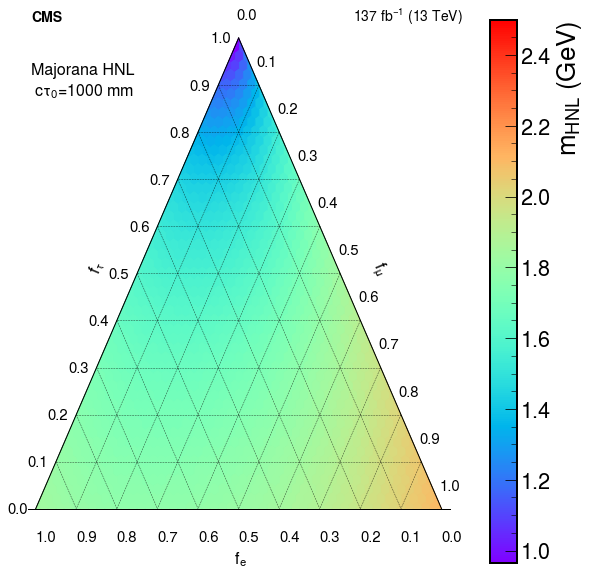

In [73]:
import ternary
from matplotlib.ticker import FormatStrFormatter
## Boundary and Gridlines
scale = 50.0
figure, tax = ternary.figure(scale=scale,permutation="120")

tax.heatmap(d_new_ctau,style="h",cmap="rainbow",cbarlabel="$m_{HNL}$ (GeV)" )
# Draw Boundary and Gridlines
tax.boundary(linewidth=1)
tax.gridlines(color="black", multiple=5,linestyle="--",alpha=0.7)
#tax.gridlines(color="blue", multiple=1, linewidth=0.5)

# Set Axis labels and Title
fontsize = 16
offset = 0.12
tax.set_title("", fontsize=fontsize)
tax.left_axis_label("      $f_{\\tau}$", fontsize=fontsize, offset=offset)
tax.right_axis_label("$f_{\\mu}$      ", fontsize=fontsize, offset=offset)
tax.bottom_axis_label("      $f_e$      ", fontsize=fontsize, offset=0)

# Set ticks

tax.ticks(ticks = [x/10 for x in range(11)],axis='blr',permutation='120', clockwise=True, linewidth=1, multiple=1, offset=0.02,tick_formats="%.1f",fontsize=15)



# Background color
tax.set_background_color(color="white", alpha=0.7) # the detault, essentially


# Remove default Matplotlib Axes
tax.clear_matplotlib_ticks()
tax.top_corner_label("Majorana HNL\n c$\\tau_0$=1000 mm ",position = (-0.35,1,0),fontsize=fontsize)
tax.right_corner_label("CMS",position = (-0.505,1.15,0),fontsize=14,fontweight="bold")
tax.left_corner_label("137 $\mathrm{fb}^{-1}$ (13 TeV)",position = (0.305,1.15,0),fontsize=14)

ax = tax.get_axes()

tax.get_axes().axis('off')
plt.style.use(hep.style.CMS) 

tax.show()
tax.savefig("Ternary_plot_ctau1000_Majorana.pdf")